In [1]:
# Loading Libraries
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib
# matplotlib.use("Agg")
import matplotlib.pyplot as plt
import seaborn as sns   
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
import math
import os
import textwrap
from sklearn.metrics import r2_score
import wandb
import csv
import shap

c:\Users\Georgia\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Για επαναληψιμότητα των αποτελεσμάτων
np.random.seed(42)
torch.manual_seed(42)

In [3]:
wandb.login()

wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.


wandb: Currently logged in as: sakkis (sakkis-national-technical-university-of-athens) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [4]:
with open("results.csv", "w", newline="") as f: # For WandB results renew
    pass

In [5]:
sns.set_style("whitegrid") # για καλύτερη εποπτεία

In [6]:
# Loading Dataset
# file_path = r"C:\Users\georg\Downloads\Advanced_Control_HW_1\Data2026.csv"
import os
folder_path = os.getcwd()  # παίρνει τον φάκελο που τρέχει το notebook
file_path = os.path.join(folder_path, "Data2026.csv")
df = pd.read_csv(file_path, sep="\t", skiprows=[1])
df=df.drop(columns=["Unnamed: 11"]) # γιατι έβγαζε και μια στήλη με NaN στο τέλος

In [7]:
# Defining the fonts before plotting:
plt.rcParams.update({
    'font.family': 'sans-serif',  # monospace font
    'font.sans-serif': 'Calibri',  # specific sans-serif font
    'font.size': 20,
    'axes.titlesize': 20,
    'axes.labelsize': 20,
    'xtick.labelsize': 20,
    'ytick.labelsize': 20,
    'legend.fontsize': 20,
    'figure.titlesize': 20
}) 

In [8]:
# πρωταρχικός έλεγχος των δεδομένων
print(df.head()) # ενδεικτικά πρώτες γραμμές 
print(df.shape) # πλήθος rows και columns
print(df.columns) # ονόματα στηλών
print(df.info()) # data types
print(df.describe().T) # βασικά στατιστικά

   Time    NOx  Fuel Consumption   lambda  Exhaust Gas Mass Flow  \
0  0.00  167.5               2.6  7.13776                  239.0   
1  0.01  167.5               2.6  7.13776                  239.0   
2  0.02  167.5               2.6  7.15801                  239.0   
3  0.03  167.5               2.6  7.15801                  239.0   
4  0.04  167.5               2.6  7.15801                  239.0   

   Intake Pressure  Torque Reference  Rot. Speed  Engine Torque  EGR Command  \
0                4                10     800.457         4.0340          0.0   
1                4                10     800.351         4.0340          0.0   
2                4                10     800.931         3.8323          0.0   
3                4                10     799.468         3.8323          0.0   
4                4                10     799.914         3.8323          0.0   

   Exhaust Gas Temperature  
0                  152.313  
1                  152.313  
2                  152.

In [9]:
print("\n #################### Question 1 ########################## \n")
# Ερώτημα 1 - Μερικά διαγράμματα για ανάλυση του dataset 
df_no_time = df.drop(columns=["Time"]) # ο χρόνος δεν έχει νόημα, είναι ένα index


 #################### Question 1 ########################## 



In [10]:
def heatmap(df, title):
    corr_matrix = df.corr()
    corr_matrix = corr_matrix.iloc[:-1, 1:]  # αφαίρεσε την πρώτη στήλη

    fig, ax = plt.subplots()

    n_rows, n_cols = corr_matrix.shape
    # Φτιάξε το mask με το σωστό shape (ορθογώνιο)
    mask = np.zeros((n_rows, n_cols), dtype=bool)
    for i in range(n_rows):
        for j in range(n_cols):
            if j <= i - 1:  # κάτω τρίγωνο (μετατοπισμένο κατά 1 λόγω crop)
                mask[i, j] = True

    sns.heatmap(corr_matrix, mask=mask, annot=True, cmap="coolwarm", fmt=".2f",
                linewidths=0.5, linecolor='lightgray', cbar=True, ax=ax)
    
    # Κάλυψε τα masked κελιά με λευκά patches
    for i in range(n_rows):
        for j in range(n_cols):
            if mask[i, j]:
                ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True,
                                           facecolor='white', edgecolor='white', lw=1, zorder=3))
    ax.set_facecolor('white')
    plt.title(title)
    
    x_labels = [tick.get_text() for tick in ax.get_xticklabels()]
    y_labels = [tick.get_text() for tick in ax.get_yticklabels()]
    wrapped_labels_x = [textwrap.fill(str(l).replace('_', ' '), width=5, break_long_words=False) for l in x_labels]
    wrapped_labels_y = [textwrap.fill(str(l).replace('_', ' '), width=15, break_long_words=False) for l in y_labels]
    ax.set_xticklabels(wrapped_labels_x, rotation=0, ha='center', multialignment='center')
    ax.set_yticklabels(wrapped_labels_y, rotation=0, ha='center', va='center', multialignment='center')
    ax.tick_params(axis='y', which='major', pad=70)
    plt.subplots_adjust(left=0.13, right=1.07, top=0.96, bottom=0.15)

    targets = ['NOx', 'lambda', 'Fuel Consumption', 'Intake Pressure']
    from matplotlib.patches import Rectangle
    for target in targets:
        if target in corr_matrix.index:
            row_idx = list(corr_matrix.index).index(target)
            col_start = row_idx      # ξεκινά από το πρώτο έγχρωμο κελί
            col_width = n_cols - col_start  # μέχρι το τέλος
            ax.add_patch(Rectangle((col_start, row_idx), col_width, 1,
                                    fill=False, edgecolor='black', lw=2.5, 
                                    clip_on=False, zorder=4))
    # manager = plt.get_current_fig_manager()
    # manager.window.state('zoomed')
    plot=plt.show()
    return plot

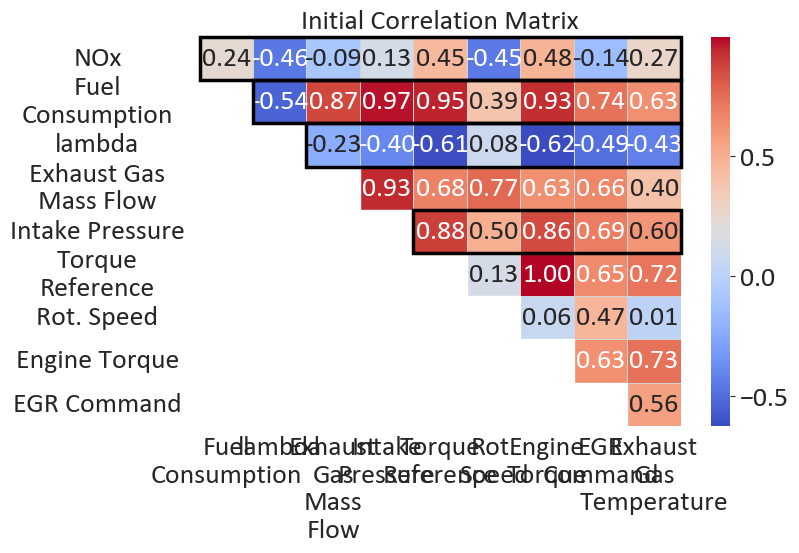

In [11]:
heatmap(df_no_time, "Initial Correlation Matrix")

# scatter plots for high correlation pairs
scatter_pairs = [
    ("NOx", "Rot. Speed"),
    ("NOx", "Engine Torque"),
    ("Fuel Consumption", "Rot. Speed"),
    ("Fuel Consumption", "Engine Torque"),

    # ("Fuel Consumption", "lambda"),
    # ("Fuel Consumption", "Exhaust Gas Mass Flow"),
    # ("Fuel Consumption", "Intake Pressure"),
    # ("Fuel Consumption", "Engine Torque"),
    # ("Fuel Consumption", "EGR Command"),
    # ("Fuel Consumption", "Exhaust Gas Temperature"),

    # ("lambda", "Engine Torque"),
    # ("lambda", "EGR Command"),

    # ("Exhaust Gas Mass Flow", "Intake Pressure"),
    # ("Exhaust Gas Mass Flow", "Rot. Speed"),
    # ("Exhaust Gas Mass Flow", "Engine Torque"),
    # ("Exhaust Gas Mass Flow", "EGR Command"),

    # ("Intake Pressure", "Rot. Speed"),
    # ("Intake Pressure", "Engine Torque"),
    # ("Intake Pressure", "EGR Command"),
    # ("Intake Pressure", "Exhaust Gas Temperature"),

    # ("Engine Torque", "EGR Command"),
    # ("Engine Torque", "Exhaust Gas Temperature"),

    # ("EGR Command", "Exhaust Gas Temperature"),
]

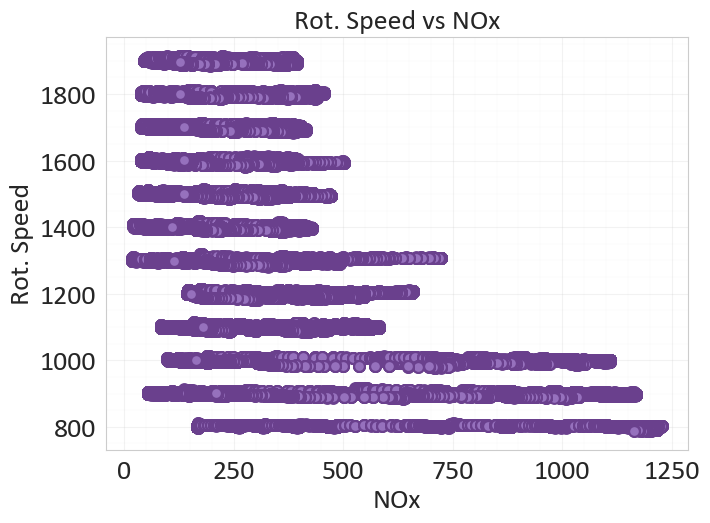

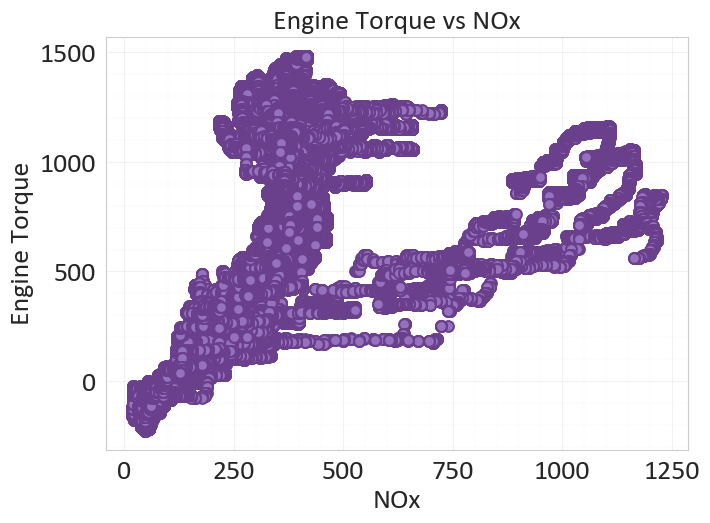

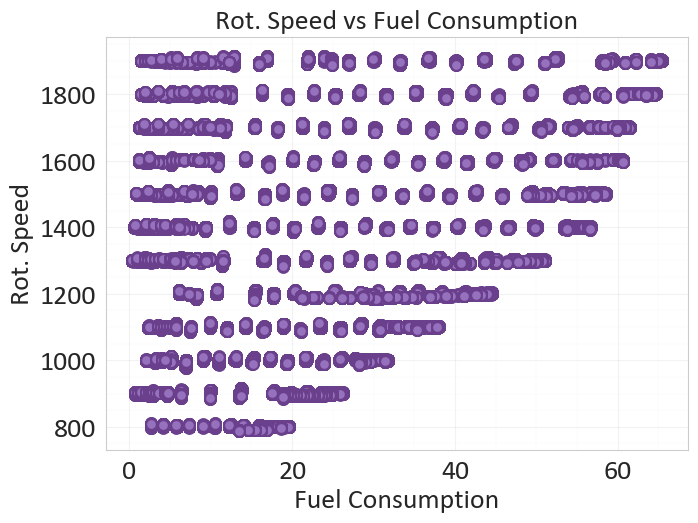

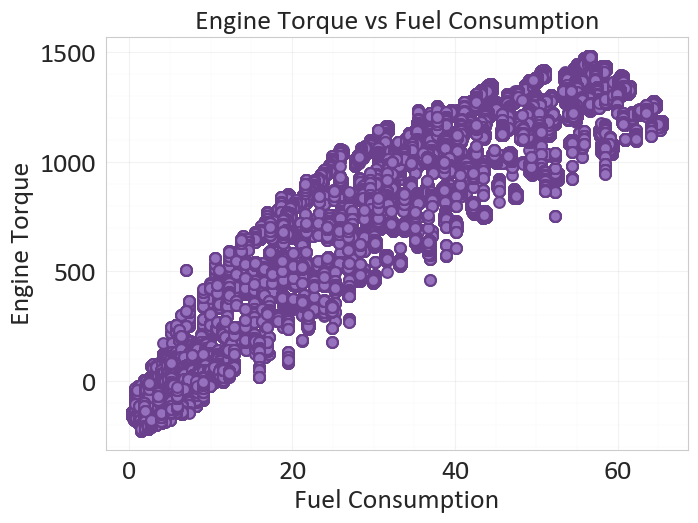

In [12]:
for x_col, y_col in scatter_pairs:
    fig,ax=plt.subplots()
    ax.scatter(df[x_col], df[y_col], color='#9671bd', s = 60, 
               edgecolors = '#6a408d',
               linewidths = 1.5,
               zorder = 3)
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(f"{y_col} vs {x_col}")
    ax.grid(True, which='major', linestyle='-', linewidth=0.75, alpha=0.25) # transparent major grid
    ax.minorticks_on()
    ax.grid(True,which='minor', linestyle='-', linewidth=0.25, alpha=0.15) # transparent minor grid
    ax.set_axisbelow(True) # to get grid below data
    plt.tight_layout()
    plt.subplots_adjust(left=0.07, right=0.98, top=0.96, bottom=0.1)
    # manager = plt.get_current_fig_manager()
    # manager.window.state('zoomed')
    plt.show()

In [13]:
print("\n #################### Question 2 ########################## \n")
# Ερώτημα 2 - Φιλτράρισμα δεδομένων
df = df[(df.drop(columns=["Time"]) > 0).all(axis=1)] # όλα τα μεγέθη πρέπει να έχουν θετικές τιμές
df = df.drop_duplicates() # remove dublicates
df = df[df["Torque Reference"] <= 100] # γιατί είναι ποσοστό
df = df[df["EGR Command"] <= 100] # γιατί είναι ποσοστό


 #################### Question 2 ########################## 



In [14]:
# Remove everything above 200% from the mean value (obviously all data>0 because of filters)
def remove_outliers(df, column):
    mean = df[column].mean()
    upper_threshold = 3*mean
    return df[(df[column] <= upper_threshold)]

In [15]:
for col in df.columns:
    if col != "Time":
        df = remove_outliers(df, col)

In [16]:
df = df.drop(columns=["Time"])
print(df.shape) # για να δούμε πόσα δεδομένα έμειναν μετά το φιλτράρισμα

(326698, 10)


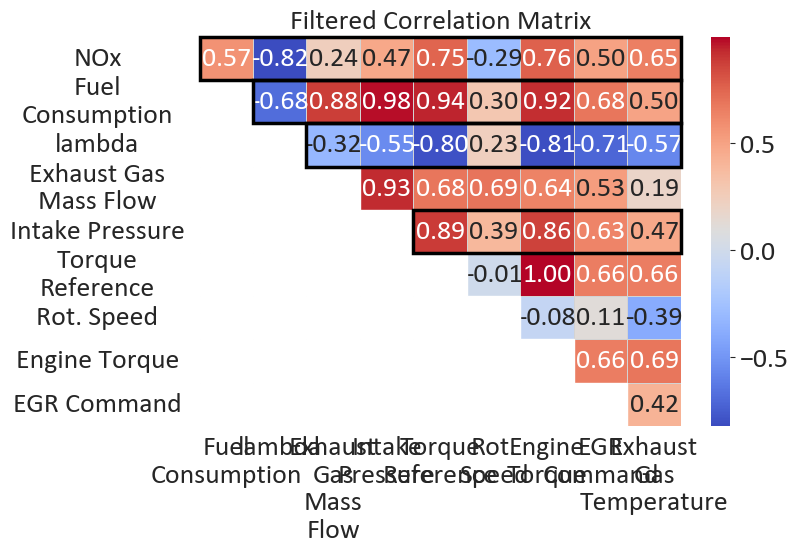

In [17]:
file_path_data=os.path.join(folder_path, "data.csv")
df.to_csv(file_path_data, sep='\t', index=False)

heatmap(df, "Filtered Correlation Matrix")

In [18]:
# γκρουπάρισμα με βάση τα rpm, γιατι στα δεδομένα παρατηρούνται clusters
df["rpm_group"] = (df["Rot. Speed"] / 100).round().astype(int) * 100
#df.sort_values("rpm_group", inplace=True) # sort by rpm group
print(df["rpm_group"].value_counts().sort_index())

rpm_group
1100    57180
1200    72228
1300    32741
1400    36091
1500    43426
1600    22437
1700    18849
1800    20662
1900    23084
Name: count, dtype: int64


In [19]:
file_path_sorted=os.path.join(folder_path, "data_sorted.csv")
df.to_csv(file_path_sorted, sep='\t', index=False)

In [20]:
print("\n #################### Question 3 ########################## \n")
# Ερώτημα 3 - Split των δεδομένων σε training, validation και test set
# input data και target πρόβλεψης
X = df.drop(columns=["NOx", "Fuel Consumption", "Intake Pressure", "lambda", "rpm_group", "Torque Reference"]) # αφαιρούμε τα μεγέθη που δεν έχουν νόημα για την πρόβλεψη των NOx (time) ή είναι πολύ άμεσα συνδεδεμένα με αυτά
X_simple = X.copy()
feature_set_name = "Simple"
print(X.columns)
# αφαιρούμε τα μεγέθη που δεν έχουν νόημα για την πρόβλεψη των NOx (time) ή είναι πολύ άμεσα συνδεδεμένα με αυτά
y = df["NOx"]


 #################### Question 3 ########################## 

Index(['Exhaust Gas Mass Flow', 'Rot. Speed', 'Engine Torque', 'EGR Command',
       'Exhaust Gas Temperature'],
      dtype='str')


In [21]:
# Σχεδίαση του νευρωνικού με κλάση 
class NNModel(nn.Module):
    def __init__(self, input_size, neurons_number, output_size):
        super(NNModel, self).__init__()
        layers=[]
        in_size=input_size
        for neurons in neurons_number:
            layers.append(nn.Linear(in_size, neurons)) # from the first layer to the next
            layers.append(nn.ReLU()) # non linearity
            in_size = neurons
        layers.append(nn.Linear(in_size, output_size)) # from the last hidden layer to the output
        
        self.net = nn.Sequential(*layers)
       
    def forward(self, x):
        return self.net(x) # εκτέλεση της forward διάδοσης δεδομένων στο νευρωνικό

In [22]:
# Ορισμός συνάρτησης κόστους και optimizer
loss_function = nn.MSELoss() # γιατί είναι πρόβλεψη συνεχούς μεγέθους, οπότε τιμωρούμε παραπάνω τις πιο απομακρυσμένες προβλέψεις

In [23]:
# Weights And Biases
# For simple models
sweep_config_simple = {
    "method": "grid",
    "metric": {"name": "Test_RMSE", "goal": "minimize"},
    "parameters": {
        "neurons": {"values": [[16], [20]]}, # set hidden layers and neurons for compare (1 hidden with 20 neurons max)
        "lr":      {"values": [0.001, 0.01]}, # set learnign rates for compare
        "epochs":  {"values": [500, 1000]} # set epochs for compare
    }
}
# For complex models
sweep_config_complex = {
    "method": "grid",
    "metric": {"name": "Test_RMSE", "goal": "minimize"},
    "parameters": {
        "neurons": {"values": [[32], [32, 32], [64, 64]]},
        "lr":      {"values": [0.001, 0.01]},
        "epochs":  {"values": [200, 500]}
    }
}
# Συνάρτηση που καλείται από το WandB sweep για κάθε διαφορετικό configuration
def train_Fuel_Consumption(model):
    wandb.init(project="FOC_nn")
    config = wandb.config # ανάγνωση των hyperparameters του τρέχοντος sweep run
    wandb.run.name = f"{feature_set_name}_Fuel_Consumption_neurons{config.neurons}_lr{config.lr}_epochs{config.epochs}"
    run_neural_network(
        X,
        df["Fuel Consumption"],
        model,
        config.epochs,
        config.neurons,
        config.lr,
        "Actual Fuel Consumption (scaled)",
        "Predicted Fuel Consumption (scaled)",
        "Actual Fuel Consumption [kg/h]",
        "Predicted Fuel Consumption [kg/h]",
        "Training vs Validation Loss for Fuel Consumption Model",
        "Predicted vs Actual Fuel Consumption",
        "Predicted vs Actual Fuel Consumption"
    )

In [24]:
def train_NOx(model):
    wandb.init(project="NOx_nn")
    config = wandb.config
    wandb.run.name = f"{feature_set_name}_NOx_neurons{config.neurons}_lr{config.lr}_epochs{config.epochs}"
    run_neural_network(
        X,
        df["NOx"],
        model,
        config.epochs, 
        config.neurons, 
        config.lr,
        "Actual NOx (scaled)",
        "Predicted NOx (scaled)",
        "Actual NOx [ppm]",
        "Predicted NOx [ppm]",
        "Training vs Validation Loss for NOx Model",
        "Predicted vs Actual NOx",
        "Predicted vs Actual NOx"
    )

In [25]:
def train_Intake_Pressure(model):
    wandb.init(project="Intake_Pressure_nn")
    config = wandb.config
    wandb.run.name = f"{feature_set_name}_Intake_Pressure_neurons{config.neurons}_lr{config.lr}_epochs{config.epochs}"
    run_neural_network(
        X,
        df["Intake Pressure"],
        model,
        config.epochs, 
        config.neurons, 
        config.lr,
        "Actual Intake Pressure (scaled)",
        "Predicted Intake Pressure (scaled)",
        "Actual Intake Pressure [kPa]",
        "Predicted Intake Pressure [kPa]",
        "Training vs Validation Loss for Intake Pressure Model",
        "Predicted vs Actual Intake Pressure",
        "Predicted vs Actual Intake Pressure"
    )

In [26]:
def train_lambda(model):
    wandb.init(project="lambda_nn")
    config = wandb.config
    wandb.run.name = f"{feature_set_name}_lambda_neurons{config.neurons}_lr{config.lr}_epochs{config.epochs}"
    run_neural_network(
        X,
        df["lambda"],
        model,
        config.epochs, 
        config.neurons, 
        config.lr,
        "Actual lambda (scaled)",
        "Predicted lambda (scaled)",
        "Actual lambda",
        "Predicted lambda",
        "Training vs Validation Loss for lambda Model",
        "Predicted vs Actual lambda",
        "Predicted vs Actual lambda"
    )

In [27]:
# Training
def run_neural_network(X, y, model_name, epochs, neurons_number, learning_rate, scaled_xlabel, scaled_ylabel, real_xlabel, real_ylabel, plot_title_loss, plot_title_scaled, plot_title_real, do_shap=False):
    np.random.seed(42)
    torch.manual_seed(42)
    print("\n #################### " + model_name + " Model ########################## \n")
    # training set (70%), validation set (10%) and test set (20%)
    rpm_groups = df["rpm_group"].unique()
    # Split ανά ομάδα στροφών
    train_groups, rest_groups = train_test_split(
    rpm_groups,
    test_size=0.3,
    random_state=42
    )

    val_groups, test_groups = train_test_split(
    rest_groups,
    test_size=20/30,
    random_state=42
    )
    # Έλεγχος των ομάδων rpm του κάθε set
    print("Train RPM groups:", sorted(train_groups))
    print("Validation RPM groups:", sorted(val_groups))
    print("Test RPM groups:", sorted(test_groups))

    # masks για να επιλεχθούν όλα τα data rows της κάθε ομάδας στροφών
    train_mask = df["rpm_group"].isin(train_groups)
    val_mask = df["rpm_group"].isin(val_groups)
    test_mask = df["rpm_group"].isin(test_groups)

    # Εφαρμογή των masks για τα τελικά sets
    X_train = X.loc[train_mask]
    X_val = X.loc[val_mask]
    X_test = X.loc[test_mask]
    y_train = y.loc[train_mask]
    y_val = y.loc[val_mask]
    y_test = y.loc[test_mask]

    # Κανονικοποίηση των δεδομένων
    x_scaler = StandardScaler() # κανονικόποιση ως z = (x - μ) / σ, γιατί δουλεύει καλά με ReLU
    y_scaler = StandardScaler()

    X_train = x_scaler.fit_transform(X_train)   # scale στο training set
    X_val   = x_scaler.transform(X_val)         # scale στο validation
    X_test  = x_scaler.transform(X_test)        # scale στο test

    y_train = y_scaler.fit_transform(y_train.to_numpy().reshape(-1,1)) # reshape σε (N,1) για να ταιριάζει με το output του μοντέλου
    y_val   = y_scaler.transform(y_val.to_numpy().reshape(-1,1)) # το to_numpy() για να είναι συμβατό με το torch.tensor
    y_test  = y_scaler.transform(y_test.to_numpy().reshape(-1,1))

    # Μετατροπή σε tensors
    X_train_t = torch.tensor(X_train, dtype=torch.float32) 
    y_train_t = torch.tensor(y_train, dtype=torch.float32) 

    X_val_t = torch.tensor(X_val, dtype=torch.float32) 
    y_val_t = torch.tensor(y_val, dtype=torch.float32) 

    X_test_t = torch.tensor(X_test, dtype=torch.float32)
    y_test_t = torch.tensor(y_test, dtype=torch.float32)

    input_size = X_train.shape[1]
    output_size = 1

    model = NNModel(input_size, neurons_number, output_size)

    optimizer = optim.Adam(model.parameters(), lr=learning_rate) # safe επιλογή ο Adam, 0.001 αρχικό learning rate
    print("\n #################### " + str(neurons_number) + " neurons with " + str(optimizer.param_groups[0]['lr']) + " learning rate and " + str(epochs) + " epochs ########################## \n")
    # Αποθήκευση των hyperparameters ώστε να γίνει σύγκριση μεταξύ διαφορετικών runs στο WandB
    wandb.log({
    "neurons_number": str(neurons_number),
    "learning_rate": learning_rate,
    "epochs": epochs
    })
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        
        model.train() # εκτέλεση του training\
        optimizer.zero_grad() # μηδενισμός των gradients από το προηγούμενο βήμα
        
        y_pred = model(X_train_t) # πρόβλεψη του μοντέλου
        loss = loss_function(y_pred, y_train_t) # υπολογισμός του κόστους 
        
        loss.backward() # backpropagation για να υπολογίσουμε τα gradients των παραμέτρων του μοντέλου
        optimizer.step() # update των παραμέτρων του μοντέλου με βάση τα gradients και το learning rate
        
        # Validation
        # model.eval() # έλεγχος κατά τη διάρκεια του training, για να βλέπουμε αν το μοντέλο γενικεύει καλά
        model.eval()
        with torch.no_grad():
            y_val_pred = model(X_val_t)
            val_loss = loss_function(y_val_pred, y_val_t)
            train_losses.append(loss.item())
            val_losses.append(val_loss.item())

        if epoch % 10 == 0: # ανα 100 epochs βλέπουμε την πρόοδο στη μάθηση
            if model_name == "Fuel":
                print(f"[Fuel] Epoch {epoch}: Train Loss = {loss.item():.4f}, Val Loss = {val_loss.item():.4f}")
            else:
                print(f"Epoch {epoch}: Train Loss = {loss.item():.4f}, Val Loss = {val_loss.item():.4f}")        

        wandb.log({
        "epoch": epoch,
        "Train_Loss": loss.item(),
        "Validation_Loss": val_loss.item()
        })
        
    # Ερώτημα 5
    # Test evaluation
    model.eval()

    # explainer = shap.DeepExplainer(model, X_train_t)
    # shap_values = explainer.shap_values(X_test_t)
    # shap.summary_plot(shap_values, X_test, 
    #               feature_names=X.columns.tolist(),
    #               plot_type="bar")
    # shap.summary_plot(shap_values, X_test,
    #               feature_names=X.columns.tolist())

    with torch.no_grad():
        y_test_pred = model(X_test_t)
        test_loss = loss_function(y_test_pred, y_test_t)

    test_rmse = math.sqrt(test_loss.item())

    if model_name == "Fuel":
        print("\nFuel Test Loss:", test_loss.item())
        print("Fuel Test RMSE:", math.sqrt(test_loss.item()))
    else:
        print("\nTest Loss:", test_loss.item())
        print("Test RMSE:", math.sqrt(test_loss.item()))

    wandb.log({
    "Test_Loss": test_loss.item(),
    "Test_RMSE": test_rmse
    })

    # Γραφήματα training και validation loss συναρτήσει των epochs
    fig,ax=plt.subplots()
    ax.plot(train_losses, label="Training Loss",color='#9671bd') #set better visual colors
    ax.plot(val_losses, label="Validation Loss",color='#77b5b6')
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.set_yscale('log') # log to see the waves
    ax.set_title(plot_title_loss, loc='center', y=1.1)  # move the title above the legend
    ax.grid(True, which='major', linestyle='-', linewidth=0.75, alpha=0.25) # transparent major grid
    ax.minorticks_on()
    ax.grid(True,which='minor', linestyle='-', linewidth=0.25, alpha=0.15) # transparent minor grid
    ax.set_axisbelow(True) # to get grid below data
    desired_order = [0, 1]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(  #more beautiful legend at the top
    [handles[i] for i in desired_order],
    [labels[i] for i in desired_order],
    loc = 'upper center',
    bbox_to_anchor = (0.5, 1.15),  # center top, above axes
    ncol = 4,                      # spread horizontally
    frameon = False                # removes legend border
    ) 
    plt.subplots_adjust(left=0.1, right=0.98, top=0.85, bottom=0.1)
    #manager = plt.get_current_fig_manager()
    #manager.window.state('zoomed')
    plot_name = f"{model_name}_loss_neurons_{neurons_number}_lr_{learning_rate}_epochs_{epochs}.png"
    plt.savefig(plot_name, dpi=300, bbox_inches="tight")
    wandb.log({"loss_plot": wandb.Image(plot_name)})
    plt.show()

    # Σύγκριση προβλέψεων με πραγματικές τιμές στο test set
    model.eval()
    with torch.no_grad():
        y_test_pred = model(X_test_t)

    y_test_pred_np = y_test_pred.numpy()
    y_test_np = y_test_t.numpy()
    y_test_pred_real = y_scaler.inverse_transform(y_test_pred_np).flatten()
    y_test_real = y_scaler.inverse_transform(y_test_np).flatten()
    y_test_pred_np = y_test_pred_np.flatten()
    y_test_np = y_test_np.flatten()

    fig,ax=plt.subplots()
    ax.scatter(y_test_np, y_test_pred_np, color='#9671bd', s = 60,
               edgecolors = '#6a408d',
               linewidths = 1.5,
               zorder = 3)
    ax.set_xlabel(scaled_xlabel)
    ax.set_ylabel(scaled_ylabel)
    ax.set_title(plot_title_scaled, loc='center', y=1.1)  # move the title above the legend
    ax.grid(True, which='major', linestyle='-', linewidth=0.75, alpha=0.25) # transparent major grid
    ax.minorticks_on()
    ax.grid(True,which='minor', linestyle='-', linewidth=0.25, alpha=0.15) # transparent minor grid
    ax.set_axisbelow(True) # to get grid below data
    plt.subplots_adjust(left=0.07, right=0.98, top=0.85, bottom=0.1)
    #manager = plt.get_current_fig_manager()
    #manager.window.state('zoomed')
    m, b = np.polyfit(y_test_np, y_test_pred_np, 1)
    x_line = np.linspace(min(y_test_np), max(y_test_np), 100)
    plt.plot(x_line, m * x_line + b, color='#77b5b6', label=f'Fit: y = {m:.3f}x {b:+.3f}', zorder=4)
    min_val = min(min(y_test_np), min(y_test_pred_np))
    max_val = max(max(y_test_np), max(y_test_pred_np))
    plt.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', label='y=x', zorder=4)
    desired_order = [0, 1]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(  #more beautiful legend at the top
    [handles[i] for i in desired_order],
    [labels[i] for i in desired_order],
    loc = 'upper center',
    bbox_to_anchor = (0.5, 1.15),  # center top, above axes
    ncol = 4,                      # spread horizontally
    frameon = False                # removes legend border
    ) 
    plot_name = f"{model_name}_predicted_vs_actual_scaled_loss_neurons_{neurons_number}_lr_{learning_rate}_epochs_{epochs}.png"
    plt.savefig(plot_name, dpi=300, bbox_inches="tight")
    wandb.log({"loss_plot": wandb.Image(plot_name)})
    plt.show()

    r2 = r2_score(y_test_np, y_test_pred_np)
    l_inf_scaled = np.max(np.abs(y_test_np - y_test_pred_np))

    # ίδιο διάγραμμα αλλά με τις πραγματικές τιμές αντί για τα scaled

    fig,ax=plt.subplots()
    ax.scatter(y_test_real, y_test_pred_real, color='#9671bd', s = 60, #set datat points parameters for better visualization
               edgecolors = '#6a408d',
               linewidths = 1.5,
               zorder = 3)
    ax.set_xlabel(real_xlabel)
    ax.set_ylabel(real_ylabel)
    ax.set_title(plot_title_real, loc='center', y=1.1)
    ax.grid(True, which='major', linestyle='-', linewidth=0.75, alpha=0.25) # transparent major grid
    ax.minorticks_on()
    ax.grid(True,which='minor', linestyle='-', linewidth=0.25, alpha=0.15) # transparent minor grid
    ax.set_axisbelow(True) # to get grid below data
    plt.subplots_adjust(left=0.07, right=0.98, top=0.85, bottom=0.1)
    #manager = plt.get_current_fig_manager()
    #manager.window.state('zoomed')
    m, b = np.polyfit(y_test_real, y_test_pred_real, 1)
    x_line = np.linspace(min(y_test_real), max(y_test_real), 100)
    plt.plot(x_line, m * x_line + b, color='#77b5b6', label=f'Fit: y = {m:.3f}x {b:+.3f}', zorder=4)
    min_val = min(min(y_test_real), min(y_test_pred_real))
    max_val = max(max(y_test_real), max(y_test_pred_real))
    plt.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', label='y=x', zorder=4)
    desired_order = [0, 1]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(  #more beautiful legend at the top
    [handles[i] for i in desired_order],
    [labels[i] for i in desired_order],
    loc = 'upper center',
    bbox_to_anchor = (0.5, 1.15),  # center top, above axes
    ncol = 4,                      # spread horizontally
    frameon = False                # removes legend border
    ) 
    plot_name = f"{model_name}_predicted_vs_actual_real_neurons_{neurons_number}_lr_{learning_rate}_epochs_{epochs}.png"
    plt.savefig(plot_name, dpi=300, bbox_inches="tight")
    wandb.log({"predicted_vs_actual_real": wandb.Image(plot_name)})
    plt.show()

    rmse_real = math.sqrt(    ((y_test_real - y_test_pred_real) ** 2).mean())

    print("Real RMSE:", rmse_real)
    print("R^2 Score:", r2)
    print(f"L_inf = {l_inf_scaled:.4f}")

    wandb.log({
    "Real_RMSE": rmse_real,
    "R2_Score": r2,
    "L_inf": l_inf_scaled
    })

    # SHAP analysis για το καλύτερο μοντέλο
    if do_shap:
        print("\nRunning SHAP analysis...")

        feature_names = X.columns.tolist()

        # Χρησιμοποιούμε μικρό sample γιατί το KernelExplainer είναι αργό
        background_size = min(200, X_train.shape[0])
        test_size = min(300, X_test.shape[0])

        np.random.seed(42)
        background_idx = np.random.choice(X_train.shape[0], background_size, replace=False)
        test_idx = np.random.choice(X_test.shape[0], test_size, replace=False)

        background = X_train[background_idx]
        X_test_shap = X_test[test_idx]

        def predict_for_shap(x):
            model.eval()
            with torch.no_grad():
                x_t = torch.tensor(x, dtype=torch.float32)
                output = model(x_t).numpy()
            return output.flatten()

        explainer = shap.KernelExplainer(predict_for_shap, background)
        shap_values = explainer.shap_values(X_test_shap)

        if isinstance(shap_values, list):
            shap_values_plot = shap_values[0]
        else:
            shap_values_plot = shap_values

        # SHAP bar plot: μέση απόλυτη επίδραση κάθε feature
        shap.summary_plot(
            shap_values_plot,
            X_test_shap,
            feature_names=feature_names,
            plot_type="bar",
            show=False
        )

        shap_bar_name = f"{model_name}_SHAP_bar_{feature_set_name}_neurons_{neurons_number}_lr_{learning_rate}_epochs_{epochs}.png"
        plt.title(f"SHAP Feature Importance - {model_name}")
        plt.tight_layout()
        plt.savefig(shap_bar_name, dpi=300, bbox_inches="tight")
        wandb.log({"SHAP_bar_plot": wandb.Image(shap_bar_name)})
        plt.show()

        # SHAP beeswarm plot: επίδραση feature value στην πρόβλεψη
        shap.summary_plot(
            shap_values_plot,
            X_test_shap,
            feature_names=feature_names,
            show=False
        )

        shap_beeswarm_name = f"{model_name}_SHAP_beeswarm_{feature_set_name}_neurons_{neurons_number}_lr_{learning_rate}_epochs_{epochs}.png"
        plt.title(f"SHAP Beeswarm Plot - {model_name}")
        plt.tight_layout()
        plt.savefig(shap_beeswarm_name, dpi=300, bbox_inches="tight")
        wandb.log({"SHAP_beeswarm_plot": wandb.Image(shap_beeswarm_name)})
        plt.show()

        print("SHAP analysis completed.")

    results_row = {
        "model_name": f"{feature_set_name}_{model_name}",

        "neurons": str(neurons_number),
        "lr": learning_rate,
        "epochs": epochs,
        "rmse": math.sqrt(test_loss.item()),
        "r2": r2,
        "L_inf": l_inf_scaled
    }
    results = "results.csv"
    file_exists = os.path.isfile(results)
    with open(results, "a", newline="") as f:
        writer = csv.DictWriter(f, fieldnames=results_row.keys(), delimiter='\t')
        if not file_exists:
            writer.writeheader()
        writer.writerow(results_row)

Create sweep with ID: oa5c5fc4
Sweep URL: https://wandb.ai/sakkis-national-technical-university-of-athens/FOC_nn/sweeps/oa5c5fc4


wandb: Agent Starting Run: 2xwc0pmb with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.8940, Val Loss = 1.0532
Epoch 10: Train Loss = 0.7550, Val Loss = 0.8663
Epoch 20: Train Loss = 0.6315, Val Loss = 0.7069
Epoch 30: Train Loss = 0.5228, Val Loss = 0.5729
Epoch 40: Train Loss = 0.4294, Val Loss = 0.4612
Epoch 50: Train Loss = 0.3491, Val Loss = 0.3665
Epoch 60: Train Loss = 0.2808, Val Loss = 0.2858
Epoch 70: Train Loss = 0.2235, Val Loss = 0.2172
Epoch 80: Train Loss = 0.1763, Val Loss = 0.1618
Epoch 90: Train Loss = 0.1385, Val Loss = 0.1185
Epoch 100: Train Loss = 0.1092, Val Loss = 0.0860
Epoch 110: Train Loss = 0.0874, Val Loss = 0.0629
Epoch 120: Train Lo

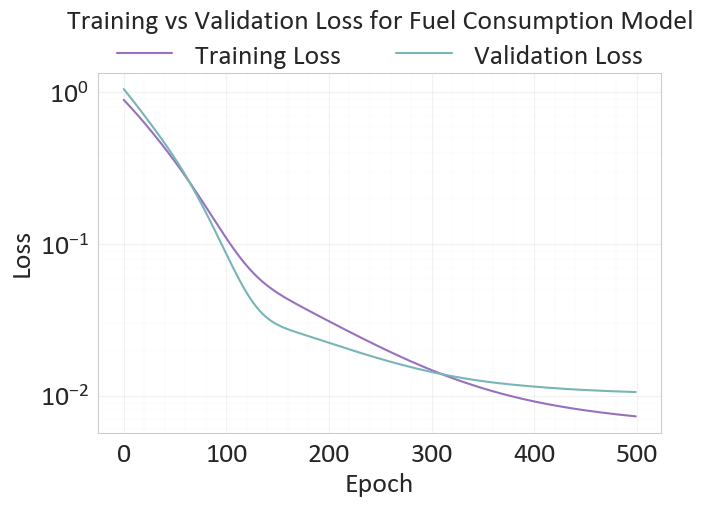

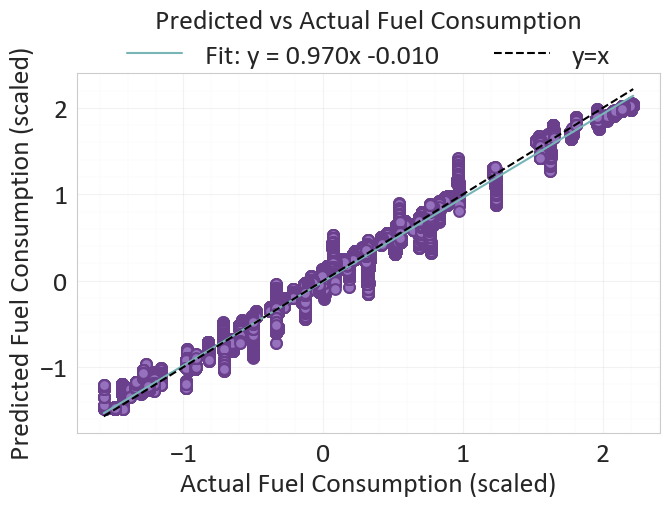

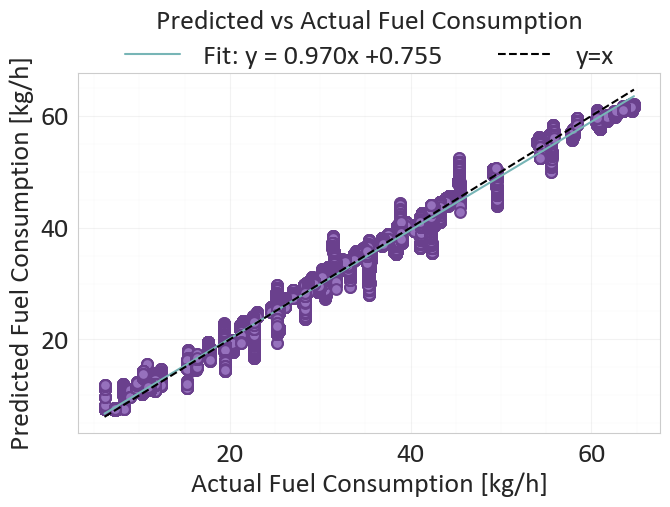

Real RMSE: 1.2821710578892518
R^2 Score: 0.9908028841018677
L_inf = 0.4755


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▅▄▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,██▆▅▄▄▄▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇███████
epochs,▁
learning_rate,▁
L_inf,0.47547


wandb: Agent Starting Run: u1855fe9 with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0620, Val Loss = 1.0467
Epoch 10: Train Loss = 0.9262, Val Loss = 0.8932
Epoch 20: Train Loss = 0.8023, Val Loss = 0.7584
Epoch 30: Train Loss = 0.6880, Val Loss = 0.6352
Epoch 40: Train Loss = 0.5821, Val Loss = 0.5205
Epoch 50: Train Loss = 0.4851, Val Loss = 0.4158
Epoch 60: Train Loss = 0.3981, Val Loss = 0.3241
Epoch 70: Train Loss = 0.3228, Val Loss = 0.2475
Epoch 80: Train Loss = 0.2607, Val Loss = 0.1870
Epoch 90: Train Loss = 0.2120, Val Loss = 0.1426
Epoch 100: Train Loss = 0.1761, Val Loss = 0.1127
Epoch 110: Train Loss = 0.1508, Val Loss = 0.0947
Epoch 120: Train Lo

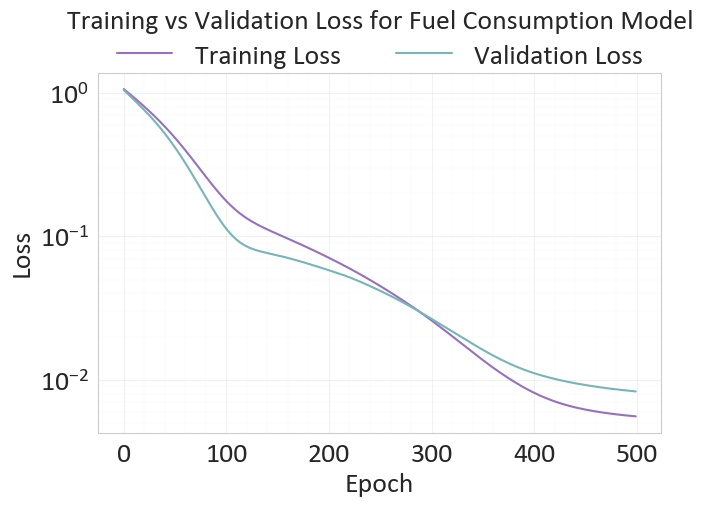

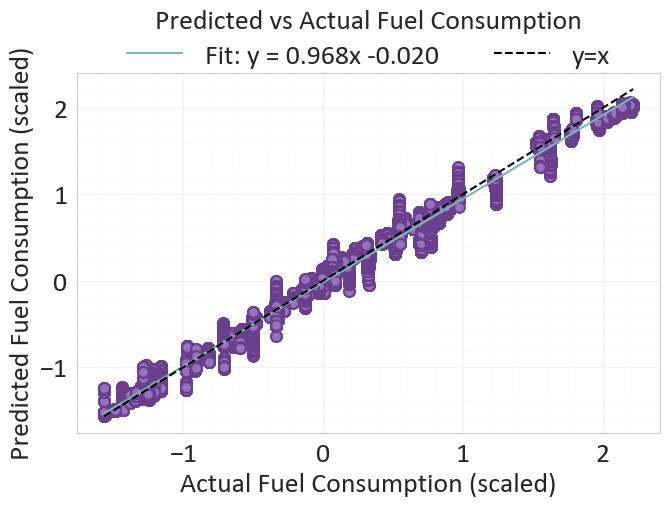

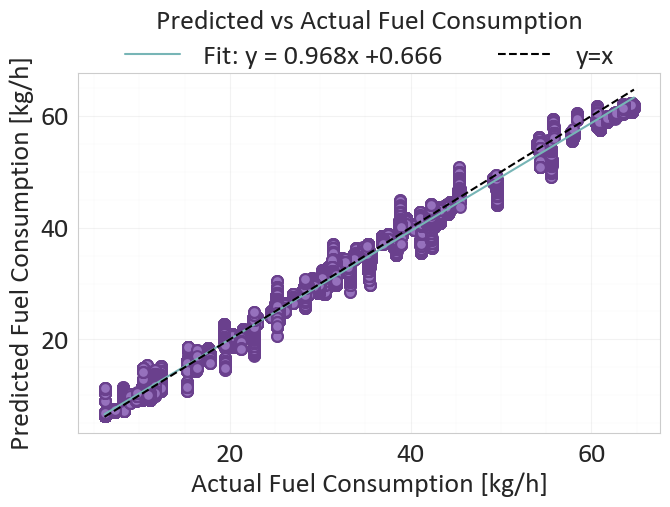

Real RMSE: 1.072314985629578
R^2 Score: 0.9935671091079712
L_inf = 0.4166


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,██▆▅▅▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇██
epochs,▁
learning_rate,▁
L_inf,0.4166


wandb: Agent Starting Run: h8l7l1dq with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.8940, Val Loss = 0.8830
Epoch 10: Train Loss = 0.0888, Val Loss = 0.0481
Epoch 20: Train Loss = 0.0757, Val Loss = 0.0808
Epoch 30: Train Loss = 0.0189, Val Loss = 0.0186
Epoch 40: Train Loss = 0.0138, Val Loss = 0.0152
Epoch 50: Train Loss = 0.0094, Val Loss = 0.0119
Epoch 60: Train Loss = 0.0070, Val Loss = 0.0099
Epoch 70: Train Loss = 0.0064, Val Loss = 0.0093
Epoch 80: Train Loss = 0.0060, Val Loss = 0.0093
Epoch 90: Train Loss = 0.0056, Val Loss = 0.0088
Epoch 100: Train Loss = 0.0053, Val Loss = 0.0084
Epoch 110: Train Loss = 0.0051, Val Loss = 0.0080
Epoch 120: Train Los

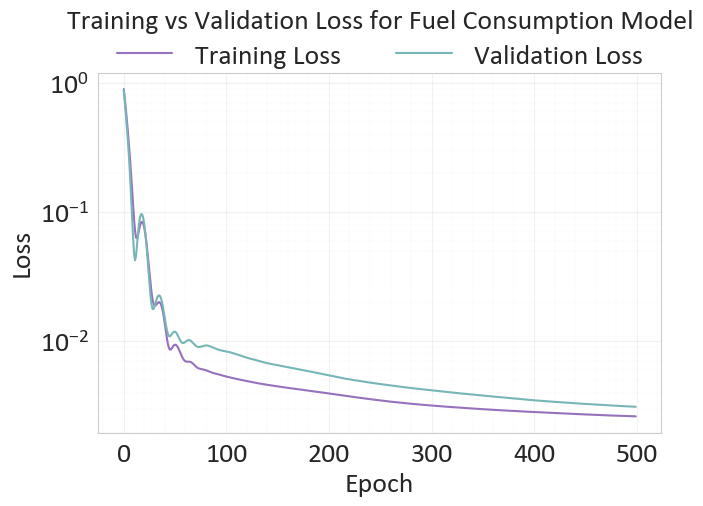

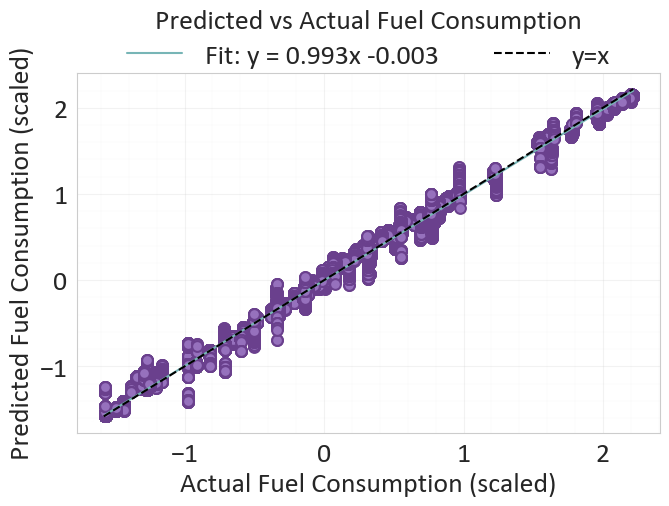

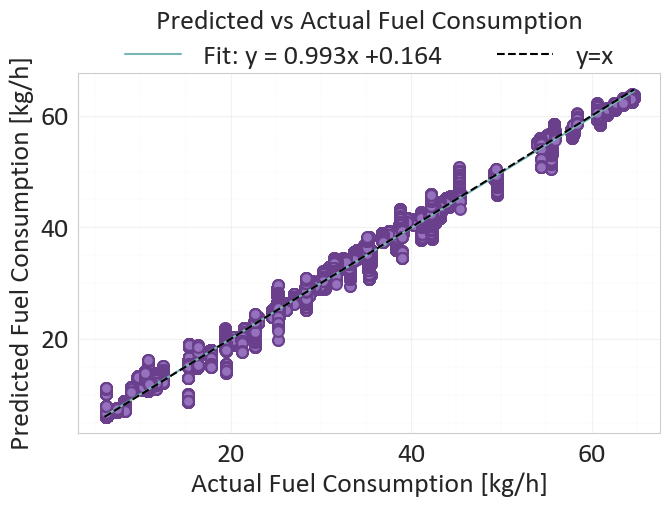

Real RMSE: 0.7416394669835064
R^2 Score: 0.9969228506088257
L_inf = 0.4309


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,██▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.43092


wandb: Agent Starting Run: xluqe0cl with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0620, Val Loss = 0.9073
Epoch 10: Train Loss = 0.1652, Val Loss = 0.0922
Epoch 20: Train Loss = 0.1259, Val Loss = 0.1241
Epoch 30: Train Loss = 0.0480, Val Loss = 0.0441
Epoch 40: Train Loss = 0.0240, Val Loss = 0.0232
Epoch 50: Train Loss = 0.0128, Val Loss = 0.0171
Epoch 60: Train Loss = 0.0068, Val Loss = 0.0086
Epoch 70: Train Loss = 0.0052, Val Loss = 0.0077
Epoch 80: Train Loss = 0.0048, Val Loss = 0.0067
Epoch 90: Train Loss = 0.0044, Val Loss = 0.0063
Epoch 100: Train Loss = 0.0042, Val Loss = 0.0058
Epoch 110: Train Loss = 0.0041, Val Loss = 0.0057
Epoch 120: Train Los

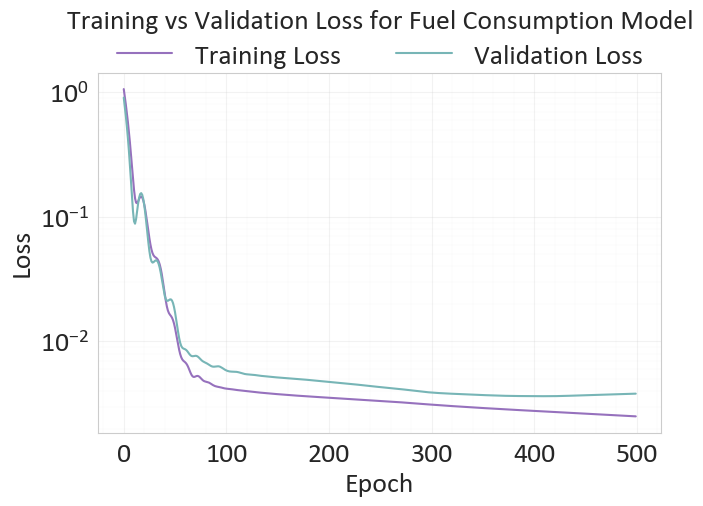

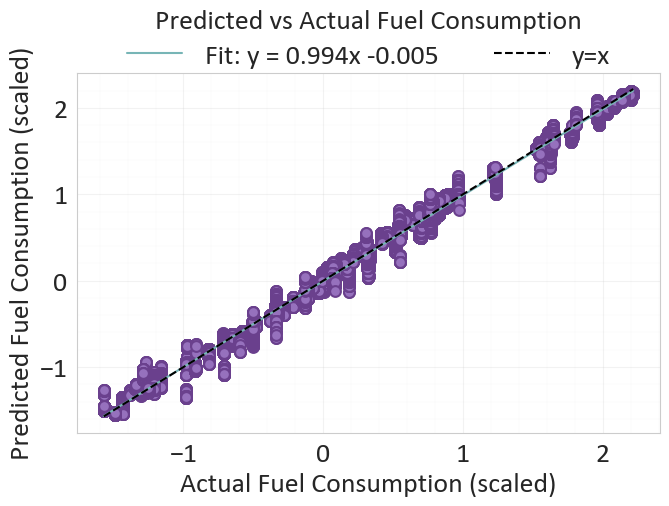

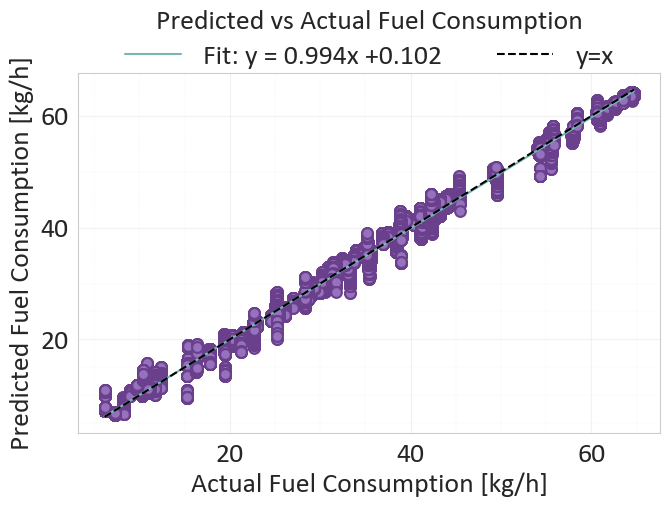

Real RMSE: 0.8460859529060242
R^2 Score: 0.9959951043128967
L_inf = 0.3863


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▅▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.38631


wandb: Agent Starting Run: gu7n4q0k with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.8940, Val Loss = 1.0532
Epoch 10: Train Loss = 0.7550, Val Loss = 0.8663
Epoch 20: Train Loss = 0.6315, Val Loss = 0.7069
Epoch 30: Train Loss = 0.5228, Val Loss = 0.5729
Epoch 40: Train Loss = 0.4294, Val Loss = 0.4612
Epoch 50: Train Loss = 0.3491, Val Loss = 0.3665
Epoch 60: Train Loss = 0.2808, Val Loss = 0.2858
Epoch 70: Train Loss = 0.2235, Val Loss = 0.2172
Epoch 80: Train Loss = 0.1763, Val Loss = 0.1618
Epoch 90: Train Loss = 0.1385, Val Loss = 0.1185
Epoch 100: Train Loss = 0.1092, Val Loss = 0.0860
Epoch 110: Train Loss = 0.0874, Val Loss = 0.0629
Epoch 120: Train L

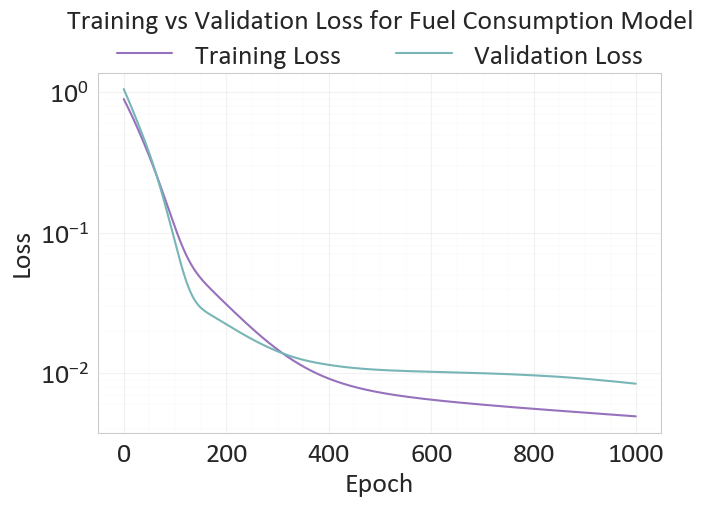

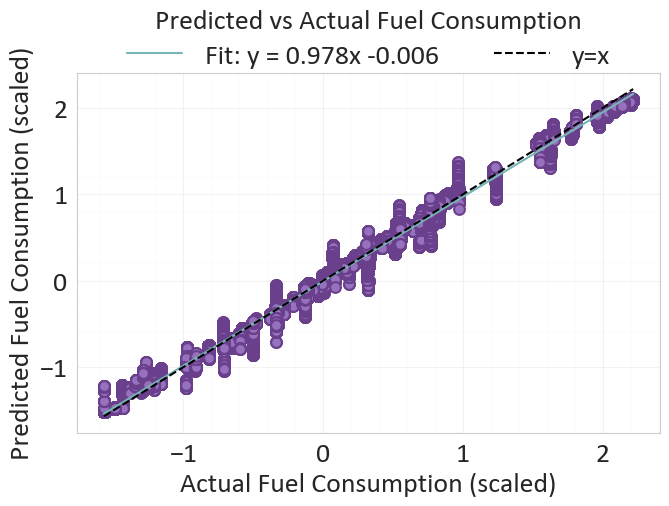

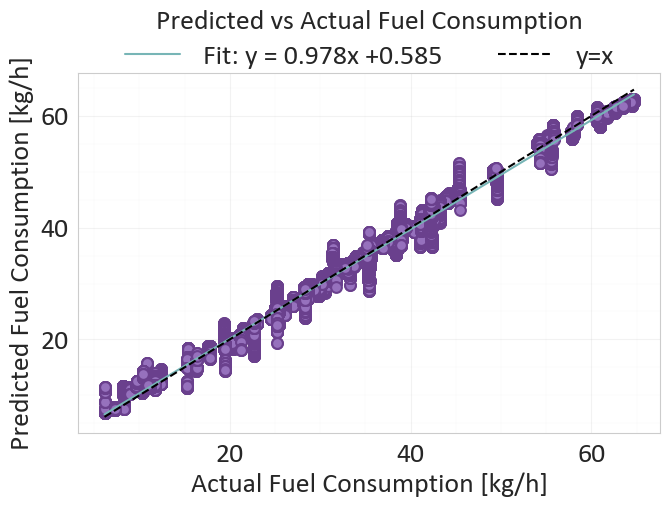

Real RMSE: 1.1282012744595438
R^2 Score: 0.9928791522979736
L_inf = 0.4312


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,██▃▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,██▆▃▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,0.43122


wandb: Agent Starting Run: t2dkupp2 with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.0620, Val Loss = 1.0467
Epoch 10: Train Loss = 0.9262, Val Loss = 0.8932
Epoch 20: Train Loss = 0.8023, Val Loss = 0.7584
Epoch 30: Train Loss = 0.6880, Val Loss = 0.6352
Epoch 40: Train Loss = 0.5821, Val Loss = 0.5205
Epoch 50: Train Loss = 0.4851, Val Loss = 0.4158
Epoch 60: Train Loss = 0.3981, Val Loss = 0.3241
Epoch 70: Train Loss = 0.3228, Val Loss = 0.2475
Epoch 80: Train Loss = 0.2607, Val Loss = 0.1870
Epoch 90: Train Loss = 0.2120, Val Loss = 0.1426
Epoch 100: Train Loss = 0.1761, Val Loss = 0.1127
Epoch 110: Train Loss = 0.1508, Val Loss = 0.0947
Epoch 120: Train L

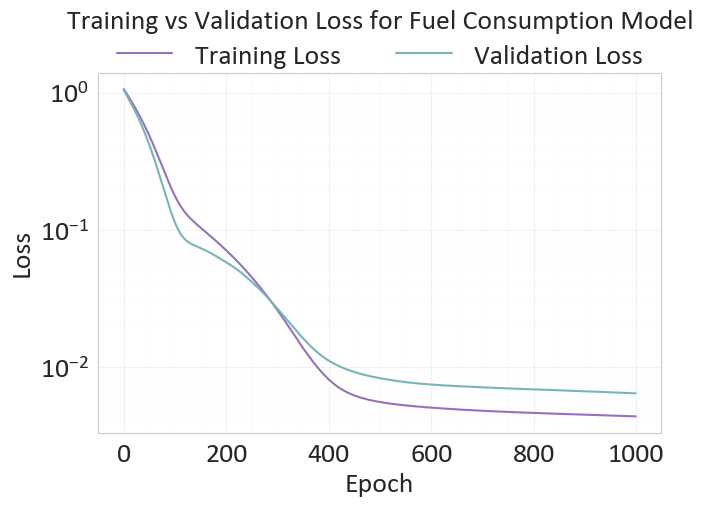

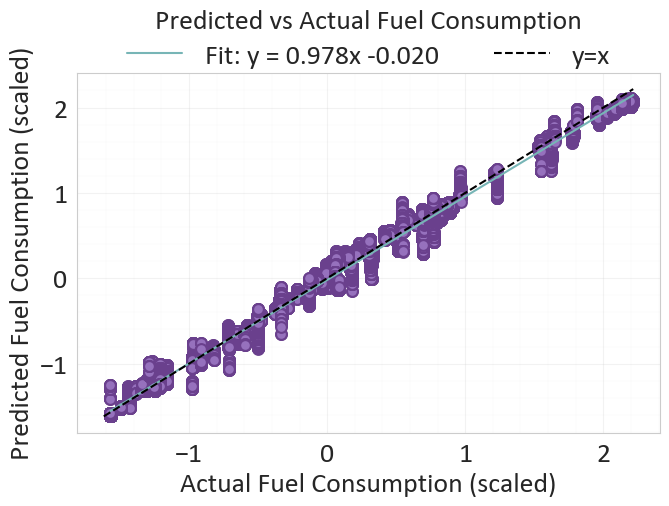

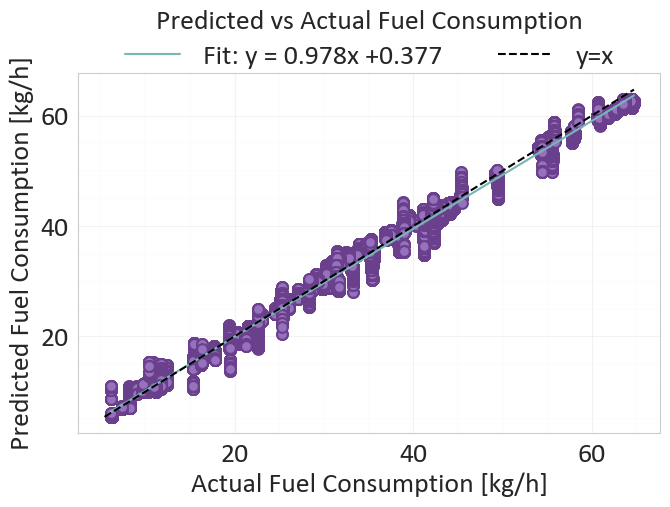

Real RMSE: 0.9913874126114677
R^2 Score: 0.9945014715194702
L_inf = 0.4165


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▅▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,0.4165


wandb: Agent Starting Run: 823c6x3b with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.8940, Val Loss = 0.8830
Epoch 10: Train Loss = 0.0888, Val Loss = 0.0481
Epoch 20: Train Loss = 0.0757, Val Loss = 0.0808
Epoch 30: Train Loss = 0.0189, Val Loss = 0.0186
Epoch 40: Train Loss = 0.0138, Val Loss = 0.0152
Epoch 50: Train Loss = 0.0094, Val Loss = 0.0119
Epoch 60: Train Loss = 0.0070, Val Loss = 0.0099
Epoch 70: Train Loss = 0.0064, Val Loss = 0.0093
Epoch 80: Train Loss = 0.0060, Val Loss = 0.0093
Epoch 90: Train Loss = 0.0056, Val Loss = 0.0088
Epoch 100: Train Loss = 0.0053, Val Loss = 0.0084
Epoch 110: Train Loss = 0.0051, Val Loss = 0.0080
Epoch 120: Train Lo

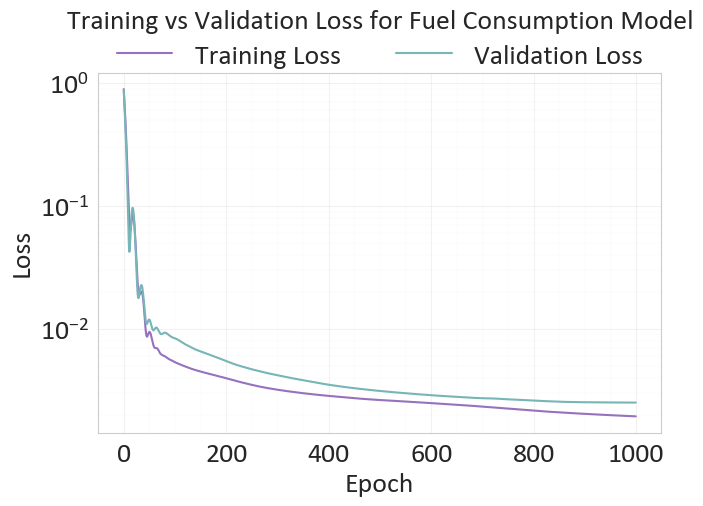

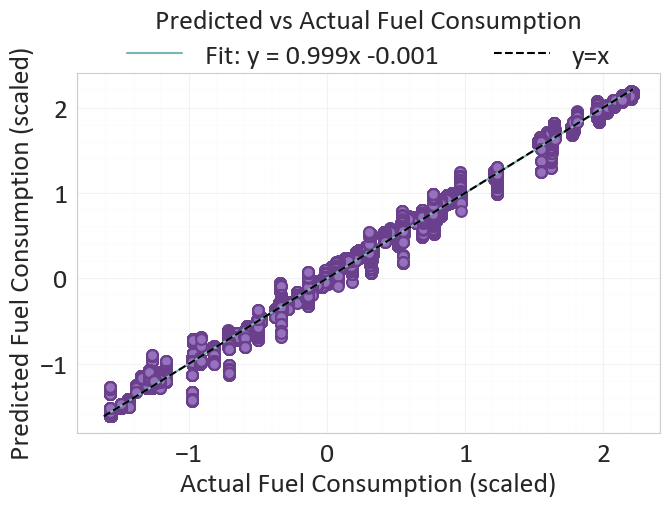

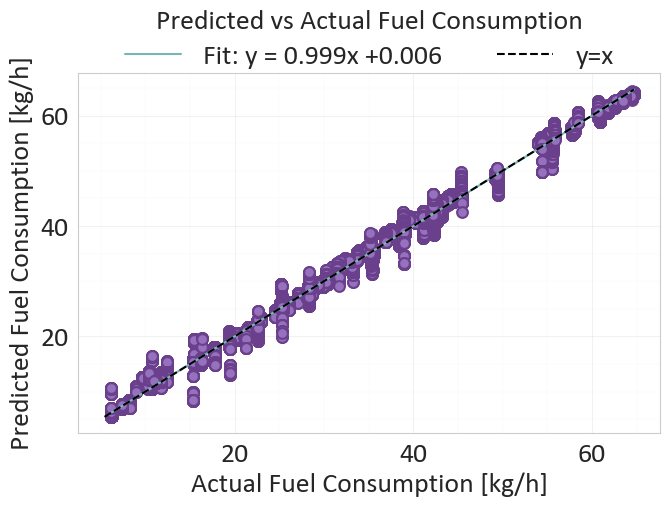

Real RMSE: 0.7069279505681894
R^2 Score: 0.9972041845321655
L_inf = 0.4529


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.45294


wandb: Agent Starting Run: zgzk7i1s with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.0620, Val Loss = 0.9073
Epoch 10: Train Loss = 0.1652, Val Loss = 0.0922
Epoch 20: Train Loss = 0.1259, Val Loss = 0.1241
Epoch 30: Train Loss = 0.0480, Val Loss = 0.0441
Epoch 40: Train Loss = 0.0240, Val Loss = 0.0232
Epoch 50: Train Loss = 0.0128, Val Loss = 0.0171
Epoch 60: Train Loss = 0.0068, Val Loss = 0.0086
Epoch 70: Train Loss = 0.0052, Val Loss = 0.0077
Epoch 80: Train Loss = 0.0048, Val Loss = 0.0067
Epoch 90: Train Loss = 0.0044, Val Loss = 0.0063
Epoch 100: Train Loss = 0.0042, Val Loss = 0.0058
Epoch 110: Train Loss = 0.0041, Val Loss = 0.0057
Epoch 120: Train Lo

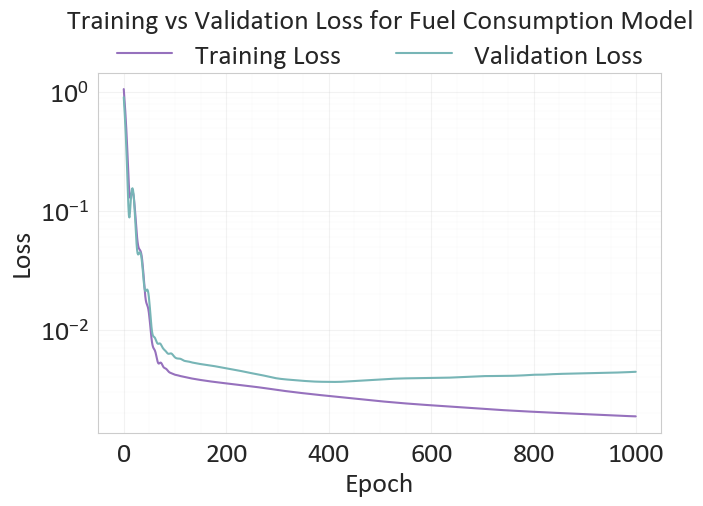

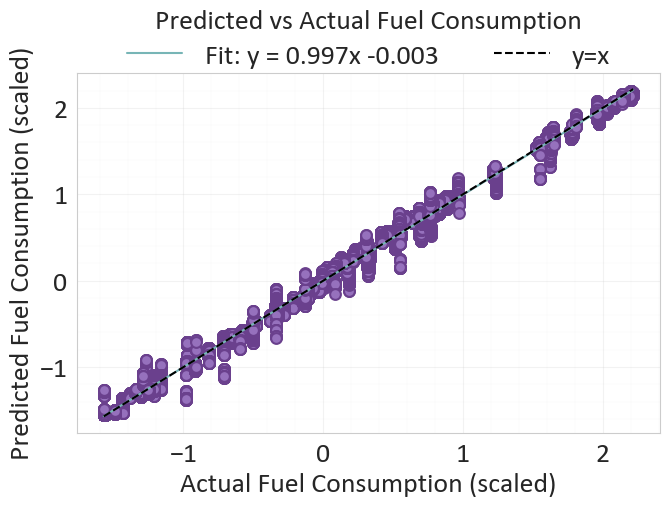

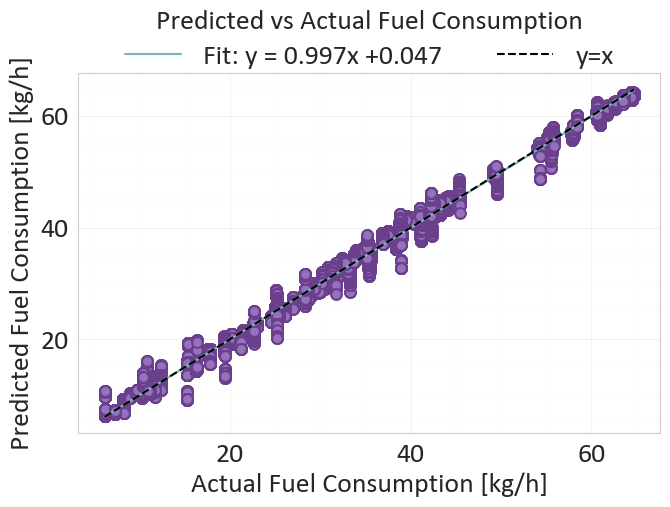

Real RMSE: 0.7990091207411001
R^2 Score: 0.996428370475769
L_inf = 0.4123


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▅▅▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,0.41234


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [28]:
# Run the simple model for Fuel Consumption
X = X_simple
feature_set_name = "Simple"
sweep_id = wandb.sweep(sweep_config_simple, project="FOC_nn")
wandb.agent(sweep_id, lambda: train_Fuel_Consumption("Simple Fuel Consumption"))

Create sweep with ID: c7vs5bb8
Sweep URL: https://wandb.ai/sakkis-national-technical-university-of-athens/NOx_nn/sweeps/c7vs5bb8


wandb: Agent Starting Run: phcbxkad with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9697, Val Loss = 0.4380
Epoch 10: Train Loss = 0.8817, Val Loss = 0.3810
Epoch 20: Train Loss = 0.8052, Val Loss = 0.3394
Epoch 30: Train Loss = 0.7388, Val Loss = 0.3102
Epoch 40: Train Loss = 0.6814, Val Loss = 0.2895
Epoch 50: Train Loss = 0.6316, Val Loss = 0.2744
Epoch 60: Train Loss = 0.5877, Val Loss = 0.2630
Epoch 70: Train Loss = 0.5478, Val Loss = 0.2524
Epoch 80: Train Loss = 0.5105, Val Loss = 0.2408
Epoch 90: Train Loss = 0.4749, Val Loss = 0.2281
Epoch 100: Train Loss = 0.4404, Val Loss = 0.2146
Epoch 110: Train Loss = 0.4069, Val Loss = 0.2007
Epoch 120: Train Loss = 0.3753, 

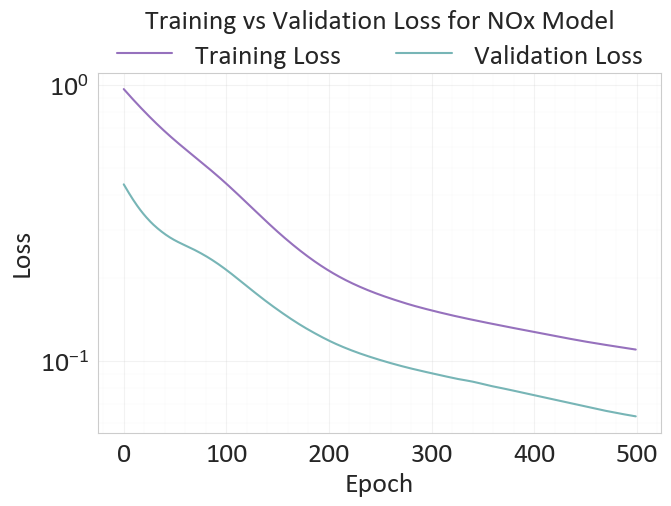

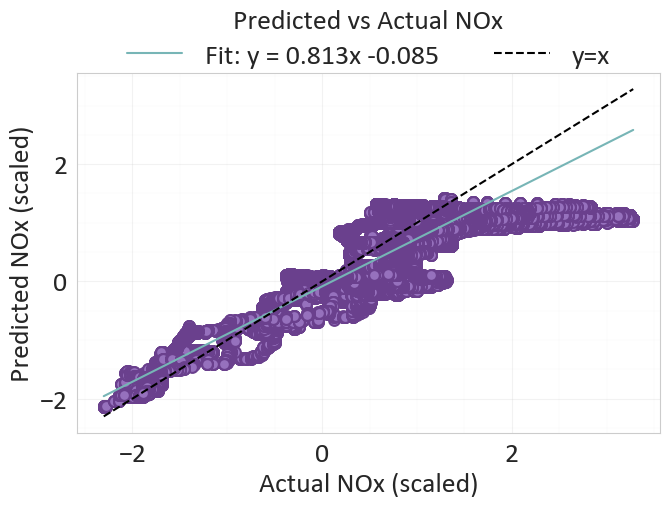

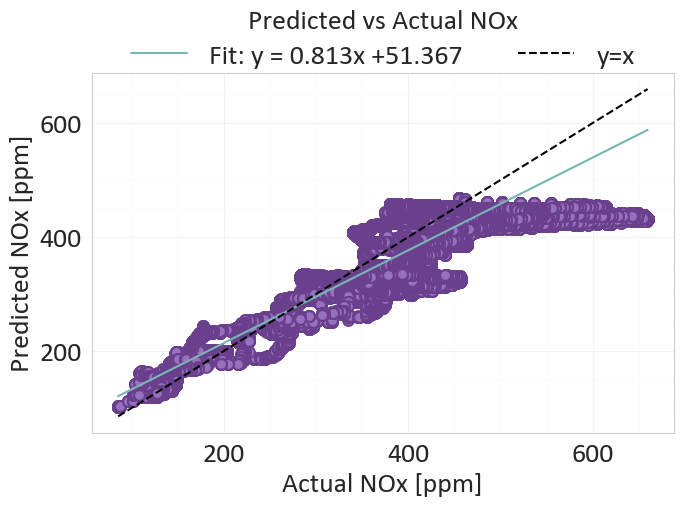

Real RMSE: 42.92860909132306
R^2 Score: 0.832676887512207
L_inf = 2.2544


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,████▇▆▆▆▅▅▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,██▇▇▆▅▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,2.25436


wandb: Agent Starting Run: r26jpiud with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0663, Val Loss = 0.4444
Epoch 10: Train Loss = 0.9624, Val Loss = 0.3862
Epoch 20: Train Loss = 0.8683, Val Loss = 0.3330
Epoch 30: Train Loss = 0.7830, Val Loss = 0.2851
Epoch 40: Train Loss = 0.7053, Val Loss = 0.2427
Epoch 50: Train Loss = 0.6345, Val Loss = 0.2063
Epoch 60: Train Loss = 0.5707, Val Loss = 0.1770
Epoch 70: Train Loss = 0.5142, Val Loss = 0.1554
Epoch 80: Train Loss = 0.4646, Val Loss = 0.1408
Epoch 90: Train Loss = 0.4213, Val Loss = 0.1317
Epoch 100: Train Loss = 0.3838, Val Loss = 0.1264
Epoch 110: Train Loss = 0.3515, Val Loss = 0.1234
Epoch 120: Train Loss = 0.3236, 

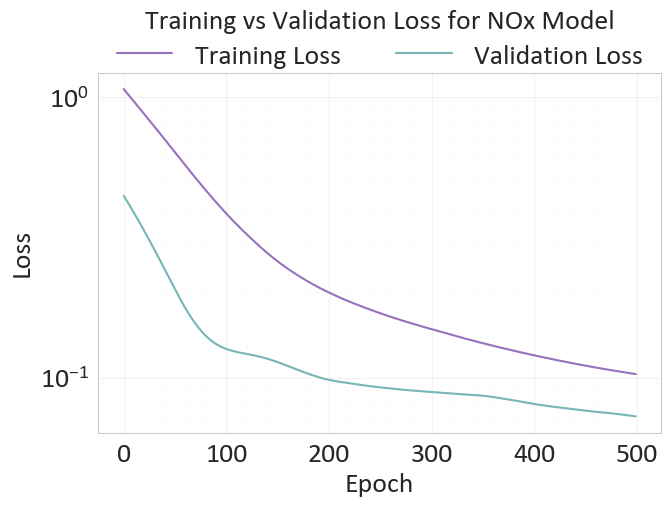

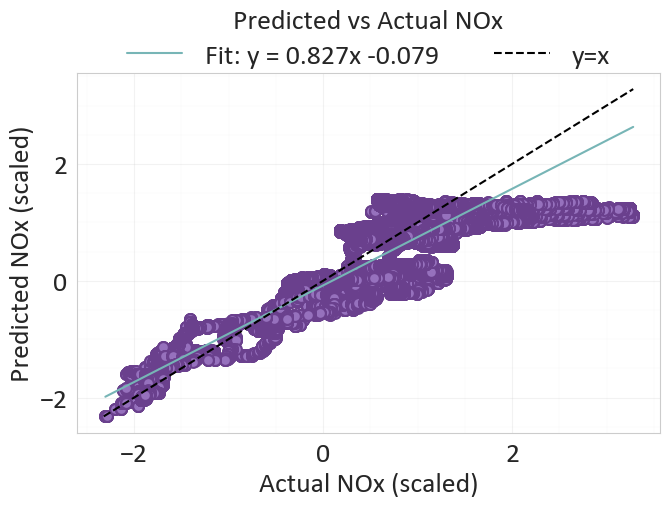

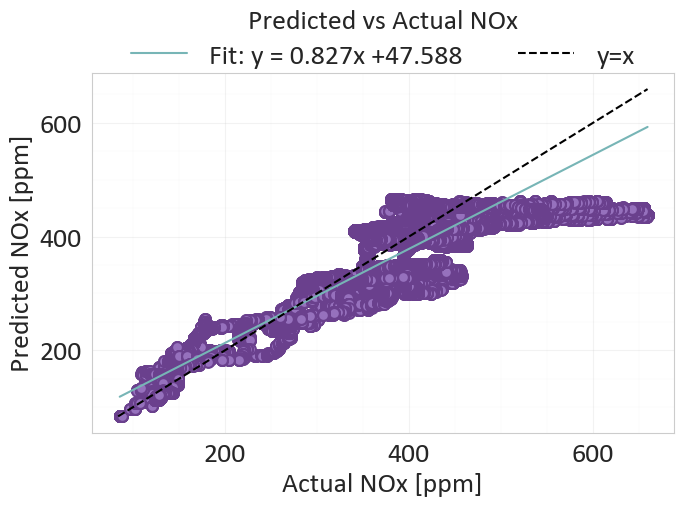

Real RMSE: 41.32819293472677
R^2 Score: 0.84492027759552
L_inf = 2.1884


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▆▆▆▄▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▆▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,2.18845


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: uk7129es with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9697, Val Loss = 0.3855
Epoch 10: Train Loss = 0.4621, Val Loss = 0.2838
Epoch 20: Train Loss = 0.2471, Val Loss = 0.1499
Epoch 30: Train Loss = 0.1774, Val Loss = 0.0965
Epoch 40: Train Loss = 0.1542, Val Loss = 0.0725
Epoch 50: Train Loss = 0.1317, Val Loss = 0.0744
Epoch 60: Train Loss = 0.1194, Val Loss = 0.0636
Epoch 70: Train Loss = 0.1090, Val Loss = 0.0571
Epoch 80: Train Loss = 0.1018, Val Loss = 0.0522
Epoch 90: Train Loss = 0.0960, Val Loss = 0.0486
Epoch 100: Train Loss = 0.0915, Val Loss = 0.0484
Epoch 110: Train Loss = 0.0876, Val Loss = 0.0485
Epoch 120: Train Loss = 0.0838, V

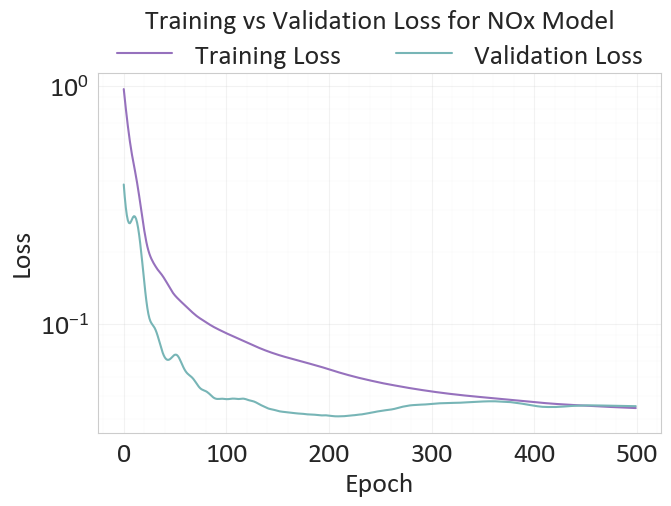

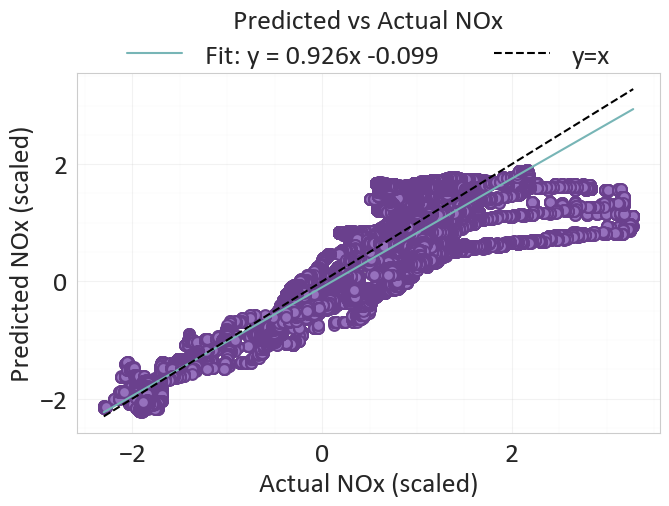

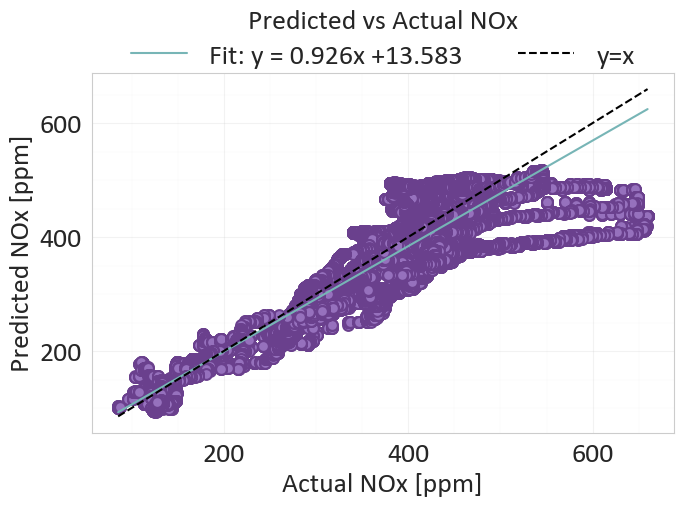

Real RMSE: 41.1926803456937
R^2 Score: 0.845935583114624
L_inf = 2.3837


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.38374


wandb: Agent Starting Run: fjlxurt7 with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0663, Val Loss = 0.3916
Epoch 10: Train Loss = 0.3952, Val Loss = 0.1745
Epoch 20: Train Loss = 0.2515, Val Loss = 0.1595
Epoch 30: Train Loss = 0.1969, Val Loss = 0.0717
Epoch 40: Train Loss = 0.1635, Val Loss = 0.0751
Epoch 50: Train Loss = 0.1352, Val Loss = 0.0753
Epoch 60: Train Loss = 0.1169, Val Loss = 0.0705
Epoch 70: Train Loss = 0.1062, Val Loss = 0.0617
Epoch 80: Train Loss = 0.1000, Val Loss = 0.0546
Epoch 90: Train Loss = 0.0950, Val Loss = 0.0528
Epoch 100: Train Loss = 0.0910, Val Loss = 0.0483
Epoch 110: Train Loss = 0.0878, Val Loss = 0.0470
Epoch 120: Train Loss = 0.0848, V

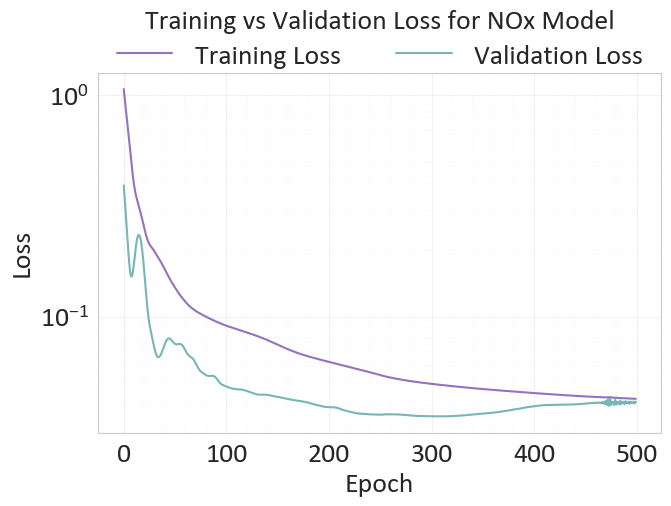

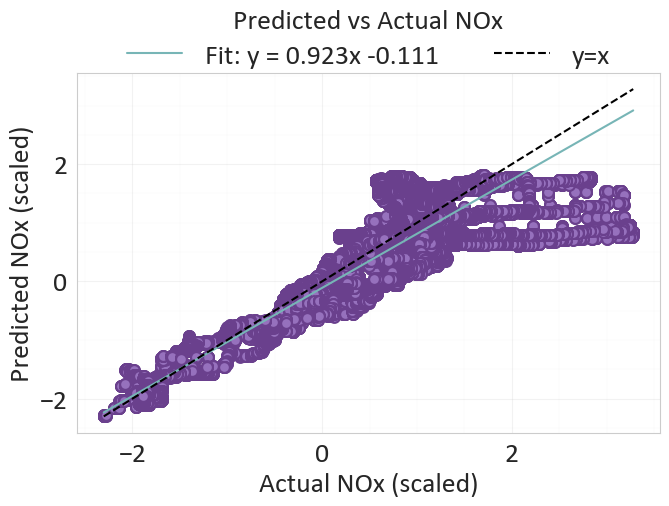

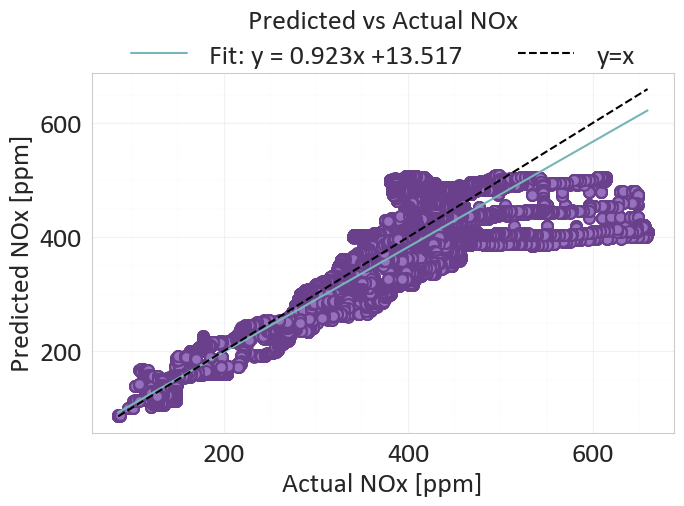

Real RMSE: 40.044168119597956
R^2 Score: 0.8544068932533264
L_inf = 2.5086


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▇▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,2.50862


wandb: Agent Starting Run: 00rx5l8f with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.9697, Val Loss = 0.4380
Epoch 10: Train Loss = 0.8817, Val Loss = 0.3810
Epoch 20: Train Loss = 0.8052, Val Loss = 0.3394
Epoch 30: Train Loss = 0.7388, Val Loss = 0.3102
Epoch 40: Train Loss = 0.6814, Val Loss = 0.2895
Epoch 50: Train Loss = 0.6316, Val Loss = 0.2744
Epoch 60: Train Loss = 0.5877, Val Loss = 0.2630
Epoch 70: Train Loss = 0.5478, Val Loss = 0.2524
Epoch 80: Train Loss = 0.5105, Val Loss = 0.2408
Epoch 90: Train Loss = 0.4749, Val Loss = 0.2281
Epoch 100: Train Loss = 0.4404, Val Loss = 0.2146
Epoch 110: Train Loss = 0.4069, Val Loss = 0.2007
Epoch 120: Train Loss = 0.3753,

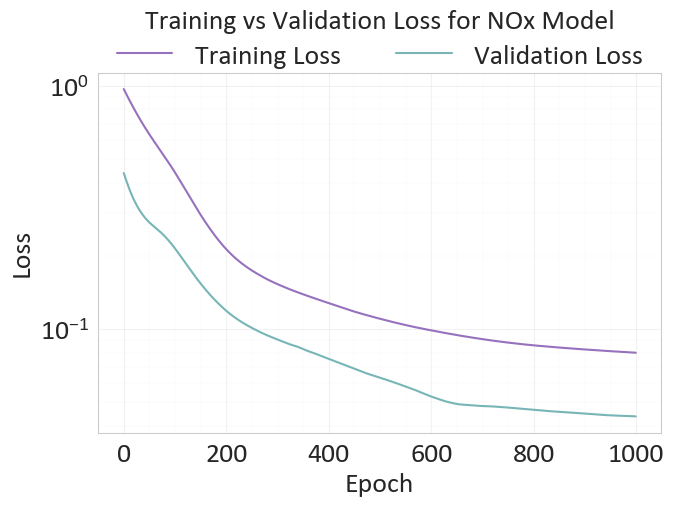

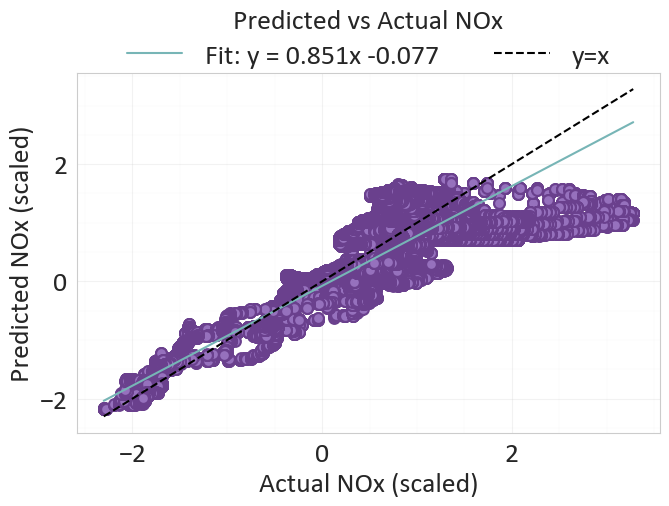

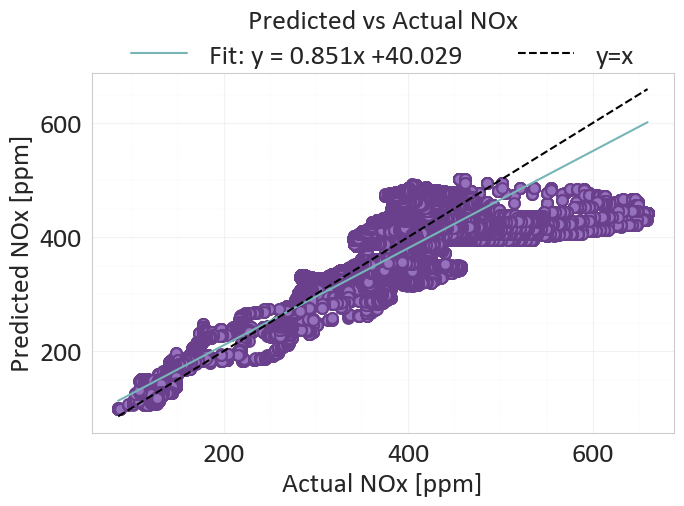

Real RMSE: 40.6328012341361
R^2 Score: 0.8500951528549194
L_inf = 2.2296


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▇▆▅▄▄▄▄▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.22955


wandb: Agent Starting Run: eekh1ipt with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.0663, Val Loss = 0.4444
Epoch 10: Train Loss = 0.9624, Val Loss = 0.3862
Epoch 20: Train Loss = 0.8683, Val Loss = 0.3330
Epoch 30: Train Loss = 0.7830, Val Loss = 0.2851
Epoch 40: Train Loss = 0.7053, Val Loss = 0.2427
Epoch 50: Train Loss = 0.6345, Val Loss = 0.2063
Epoch 60: Train Loss = 0.5707, Val Loss = 0.1770
Epoch 70: Train Loss = 0.5142, Val Loss = 0.1554
Epoch 80: Train Loss = 0.4646, Val Loss = 0.1408
Epoch 90: Train Loss = 0.4213, Val Loss = 0.1317
Epoch 100: Train Loss = 0.3838, Val Loss = 0.1264
Epoch 110: Train Loss = 0.3515, Val Loss = 0.1234
Epoch 120: Train Loss = 0.3236,

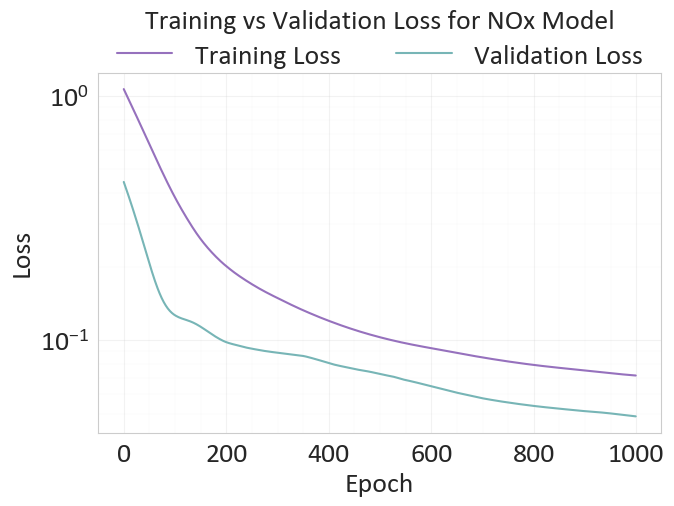

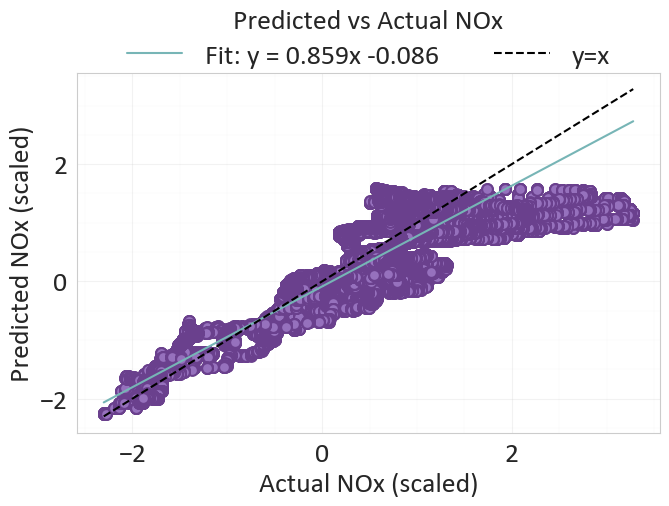

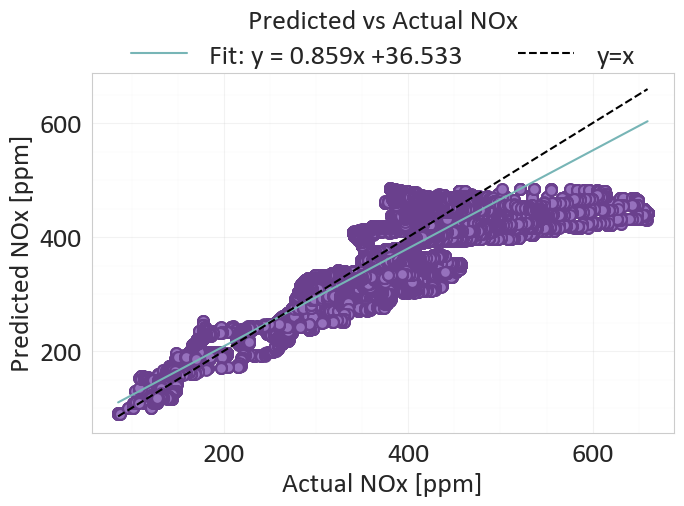

Real RMSE: 40.47777710612485
R^2 Score: 0.8512368202209473
L_inf = 2.2243


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▄▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▅▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.22433


wandb: Agent Starting Run: 5i5kym6c with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.9697, Val Loss = 0.3855
Epoch 10: Train Loss = 0.4621, Val Loss = 0.2838
Epoch 20: Train Loss = 0.2471, Val Loss = 0.1499
Epoch 30: Train Loss = 0.1774, Val Loss = 0.0965
Epoch 40: Train Loss = 0.1542, Val Loss = 0.0725
Epoch 50: Train Loss = 0.1317, Val Loss = 0.0744
Epoch 60: Train Loss = 0.1194, Val Loss = 0.0636
Epoch 70: Train Loss = 0.1090, Val Loss = 0.0571
Epoch 80: Train Loss = 0.1018, Val Loss = 0.0522
Epoch 90: Train Loss = 0.0960, Val Loss = 0.0486
Epoch 100: Train Loss = 0.0915, Val Loss = 0.0484
Epoch 110: Train Loss = 0.0876, Val Loss = 0.0485
Epoch 120: Train Loss = 0.0838, 

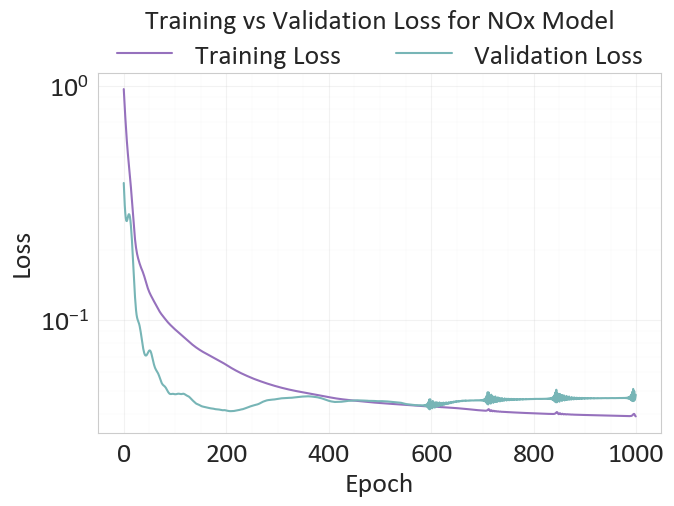

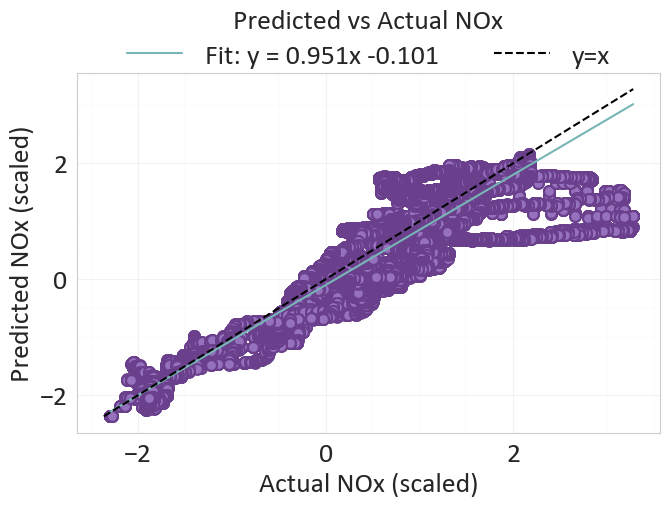

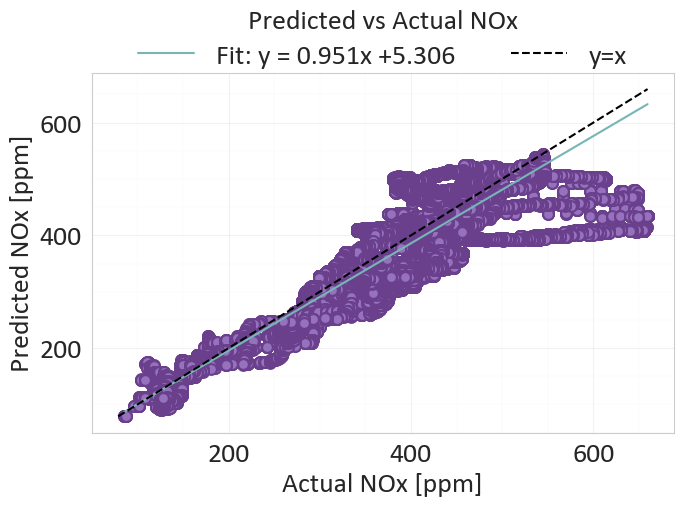

Real RMSE: 41.120327669611896
R^2 Score: 0.8464763164520264
L_inf = 2.4117


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▄▄▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▂▂▂▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,2.4117


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: epp8teki with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Simple NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.0663, Val Loss = 0.3916
Epoch 10: Train Loss = 0.3952, Val Loss = 0.1745
Epoch 20: Train Loss = 0.2515, Val Loss = 0.1595
Epoch 30: Train Loss = 0.1969, Val Loss = 0.0717
Epoch 40: Train Loss = 0.1635, Val Loss = 0.0751
Epoch 50: Train Loss = 0.1352, Val Loss = 0.0753
Epoch 60: Train Loss = 0.1169, Val Loss = 0.0705
Epoch 70: Train Loss = 0.1062, Val Loss = 0.0617
Epoch 80: Train Loss = 0.1000, Val Loss = 0.0546
Epoch 90: Train Loss = 0.0950, Val Loss = 0.0528
Epoch 100: Train Loss = 0.0910, Val Loss = 0.0483
Epoch 110: Train Loss = 0.0878, Val Loss = 0.0470
Epoch 120: Train Loss = 0.0848, 

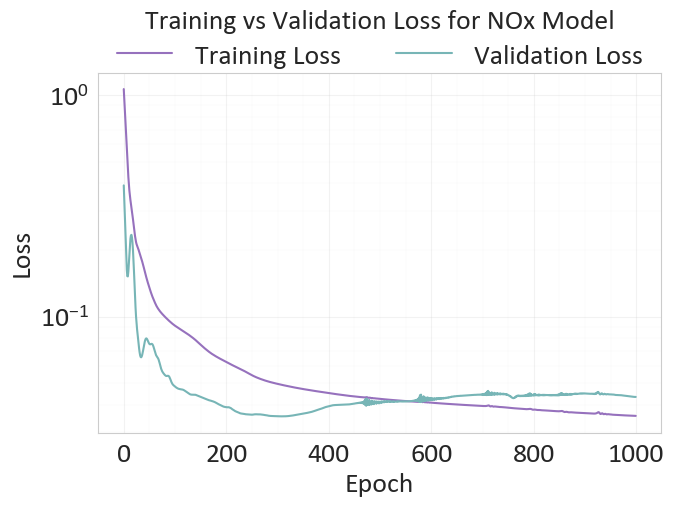

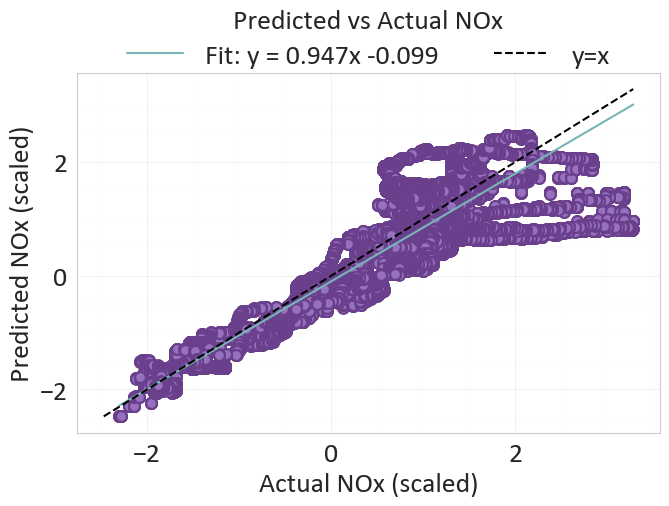

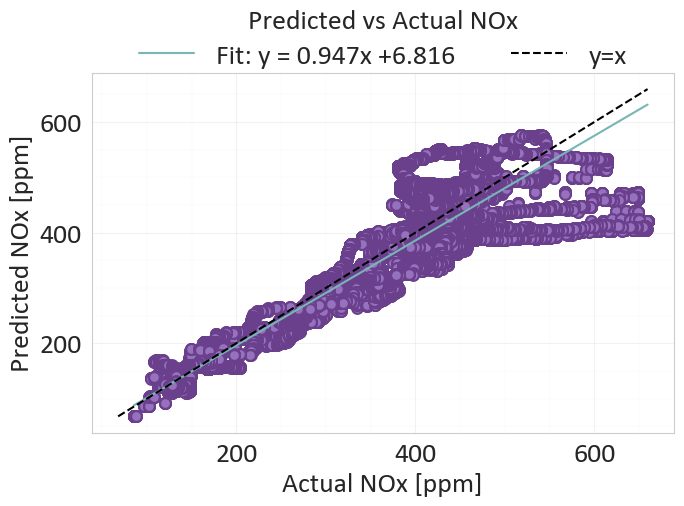

Real RMSE: 40.99085561610815
R^2 Score: 0.847441554069519
L_inf = 2.4622


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▅▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,2.46225


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [29]:
# Run the simple model for NOx
X = X_simple
feature_set_name = "Simple"
sweep_id = wandb.sweep(sweep_config_simple, project="NOx_nn")
wandb.agent(sweep_id, lambda: train_NOx("Simple NOx"))


 #################### Question 6 ########################## 



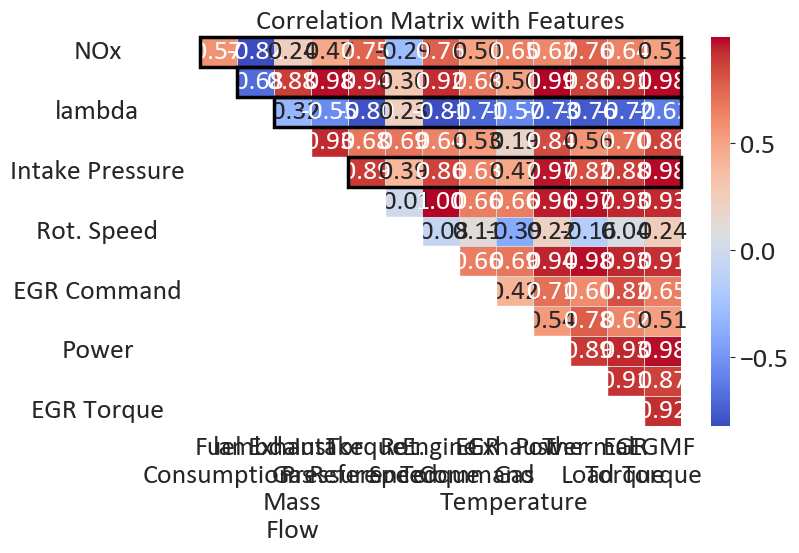

In [30]:
print("\n #################### Question 6 ########################## \n")
# feature engineering
dff = df.copy()
dff["Power"] = dff["Engine Torque"] * dff["Rot. Speed"] # Physical meaning and better correlation
dff["Thermal_Load"] = dff["Engine Torque"] * dff["Exhaust Gas Temperature"] # Better correlation
dff["EGR_Torque"] = dff["Engine Torque"] * dff["EGR Command"] # Better correlation
dff["EGMF_Torque"] = dff["Engine Torque"] * dff["Exhaust Gas Mass Flow"] # Better correlation
# plt.rcParams.update({
#     'font.family': 'sans-serif',  # monospace font
#     'font.sans-serif': 'Calibri',  # specific sans-serif font
#     'font.size': 18,
#     'axes.titlesize': 18,
#     'axes.labelsize': 18,
#     'xtick.labelsize': 18,
#     'ytick.labelsize': 18,
#     'legend.fontsize': 18,
#     'figure.titlesize': 18
# }) 
heatmap(dff.drop(columns=["rpm_group"]), "Correlation Matrix with Features")
# plt.rcParams.update({
#     'font.family': 'sans-serif',  # monospace font
#     'font.sans-serif': 'Calibri',  # specific sans-serif font
#     'font.size': 20,
#     'axes.titlesize': 20,
#     'axes.labelsize': 20,
#     'xtick.labelsize': 20,
#     'ytick.labelsize': 20,
#     'legend.fontsize': 20,
#     'figure.titlesize': 20
# }) 
X_engineered = dff.drop(columns=["NOx", "Fuel Consumption", "Intake Pressure", "lambda", "rpm_group", "Torque Reference"]) # αφαιρούμε τα μεγέθη που δεν έχουν νόημα για την πρόβλεψη των NOx (time) ή είναι πολύ άμεσα συνδεδεμένα με αυτά

Create sweep with ID: mhyg7wbw
Sweep URL: https://wandb.ai/sakkis-national-technical-university-of-athens/FOC_nn/sweeps/mhyg7wbw


wandb: Agent Starting Run: v2nu1q36 with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.7513, Val Loss = 0.7976
Epoch 10: Train Loss = 0.5808, Val Loss = 0.5953
Epoch 20: Train Loss = 0.4337, Val Loss = 0.4331
Epoch 30: Train Loss = 0.3139, Val Loss = 0.3031
Epoch 40: Train Loss = 0.2224, Val Loss = 0.2067
Epoch 50: Train Loss = 0.1574, Val Loss = 0.1392
Epoch 60: Train Loss = 0.1148, Val Loss = 0.0953
Epoch 70: Train Loss = 0.0885, Val Loss = 0.0696
Epoch 80: Train Loss = 0.0726, Val Loss = 0.0563
Epoch 90: Train Loss = 0.0628, Val Loss = 0.0497
Epoch 100: Train Loss = 0.0559, Val Loss = 0.0458
Epoch 110: Train Loss = 0.0503, Val Loss = 0.0427
Epoch 120: Train 

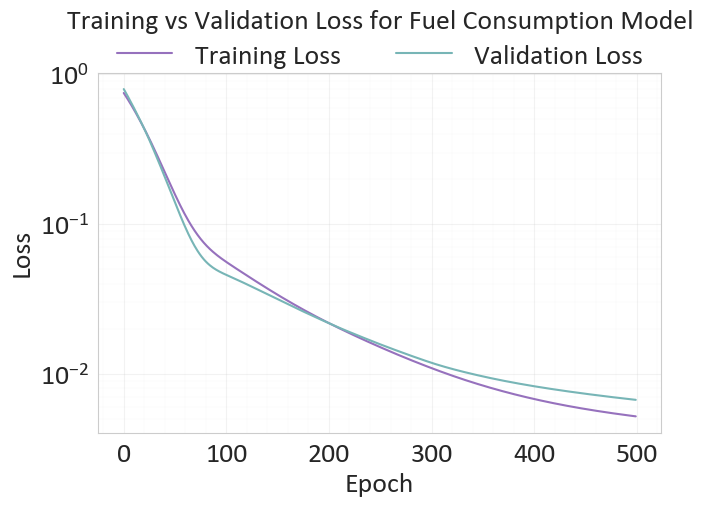

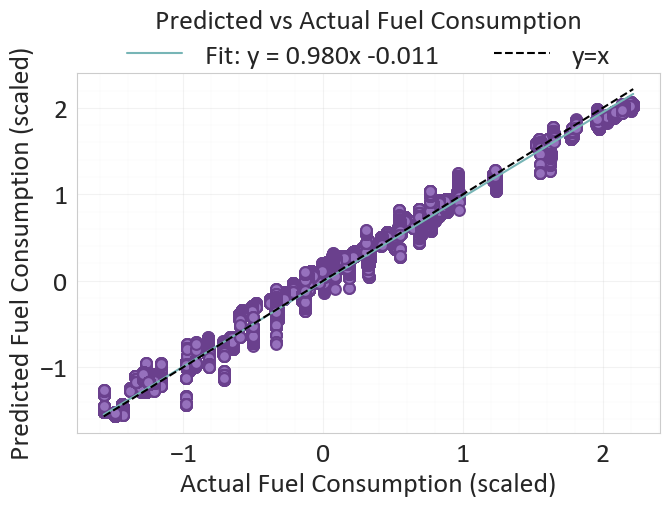

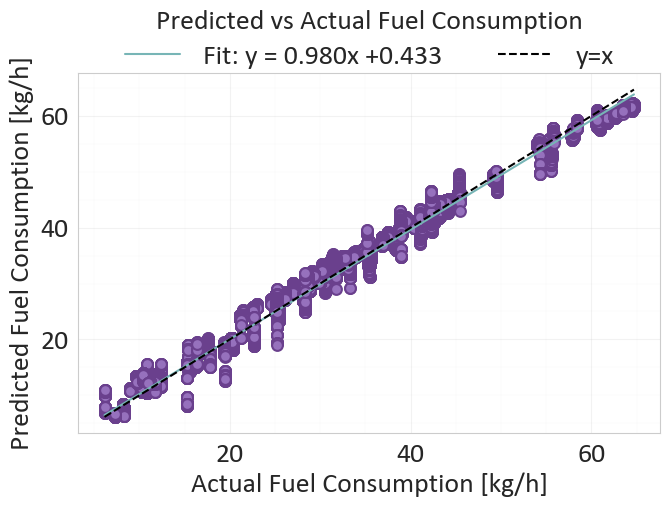

Real RMSE: 0.9669143451262913
R^2 Score: 0.9947695732116699
L_inf = 0.4660


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▅▄▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▄▄▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.46599


wandb: Agent Starting Run: 36vnq8nq with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.3670, Val Loss = 1.8170
Epoch 10: Train Loss = 1.1116, Val Loss = 1.5238
Epoch 20: Train Loss = 0.8997, Val Loss = 1.2746
Epoch 30: Train Loss = 0.7250, Val Loss = 1.0549
Epoch 40: Train Loss = 0.5773, Val Loss = 0.8530
Epoch 50: Train Loss = 0.4501, Val Loss = 0.6667
Epoch 60: Train Loss = 0.3381, Val Loss = 0.4957
Epoch 70: Train Loss = 0.2412, Val Loss = 0.3452
Epoch 80: Train Loss = 0.1620, Val Loss = 0.2224
Epoch 90: Train Loss = 0.1035, Val Loss = 0.1322
Epoch 100: Train Loss = 0.0656, Val Loss = 0.0741
Epoch 110: Train Loss = 0.0447, Val Loss = 0.0423
Epoch 120: Train 

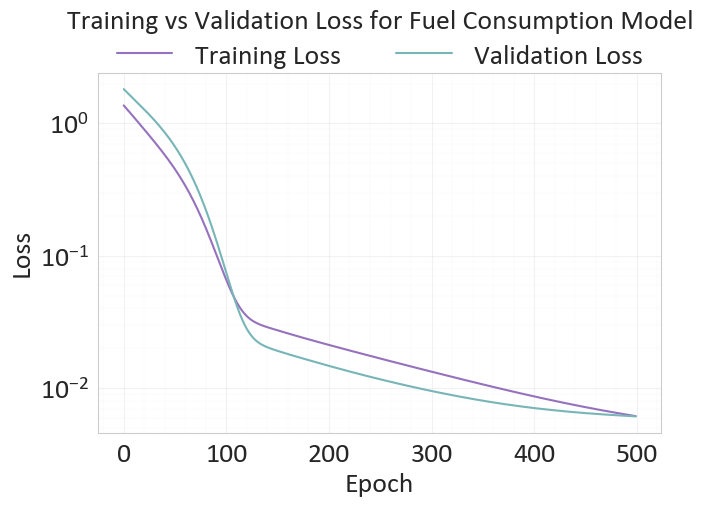

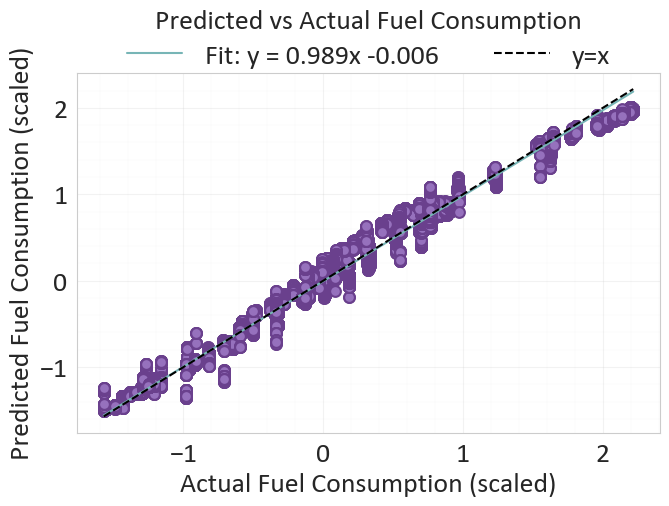

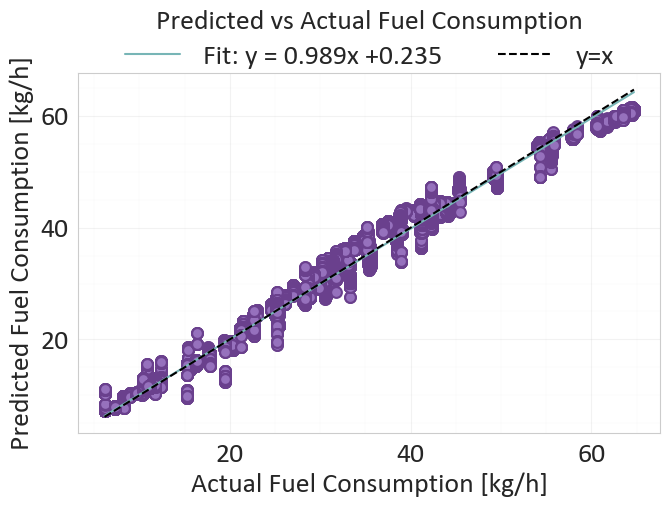

Real RMSE: 1.109171244217512
R^2 Score: 0.9931173324584961
L_inf = 0.4576


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▅▄▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▆▅▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,0.45759


wandb: Agent Starting Run: lrcbirj5 with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.7513, Val Loss = 0.6131
Epoch 10: Train Loss = 0.1081, Val Loss = 0.1316
Epoch 20: Train Loss = 0.0433, Val Loss = 0.0343
Epoch 30: Train Loss = 0.0286, Val Loss = 0.0235
Epoch 40: Train Loss = 0.0182, Val Loss = 0.0164
Epoch 50: Train Loss = 0.0111, Val Loss = 0.0111
Epoch 60: Train Loss = 0.0077, Val Loss = 0.0083
Epoch 70: Train Loss = 0.0058, Val Loss = 0.0070
Epoch 80: Train Loss = 0.0049, Val Loss = 0.0068
Epoch 90: Train Loss = 0.0045, Val Loss = 0.0065
Epoch 100: Train Loss = 0.0043, Val Loss = 0.0064
Epoch 110: Train Loss = 0.0042, Val Loss = 0.0060
Epoch 120: Train L

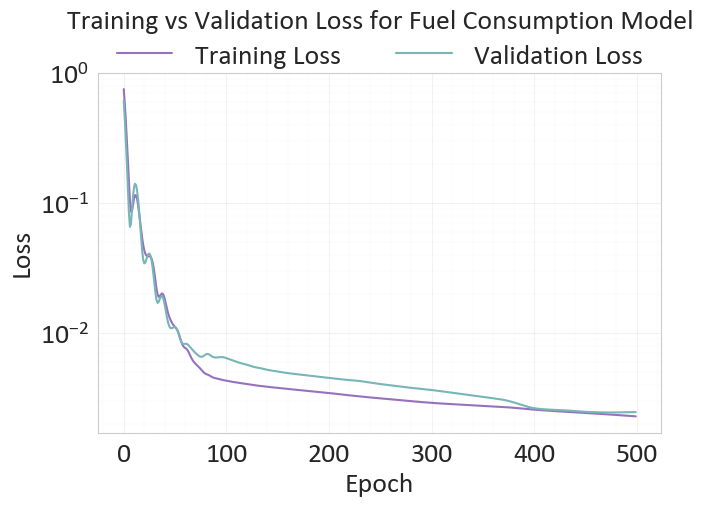

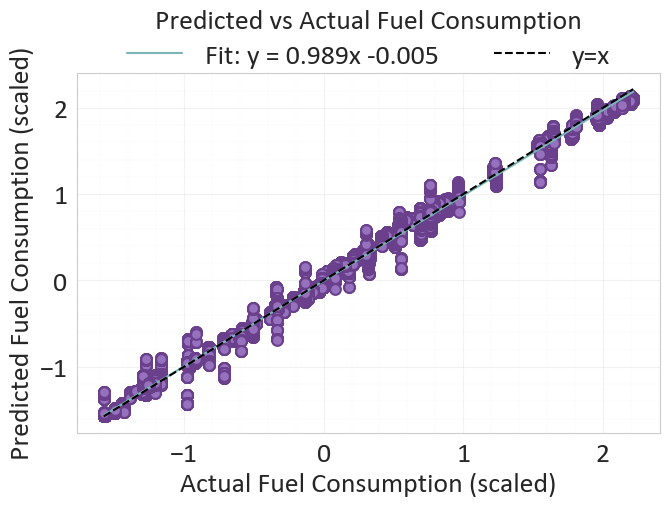

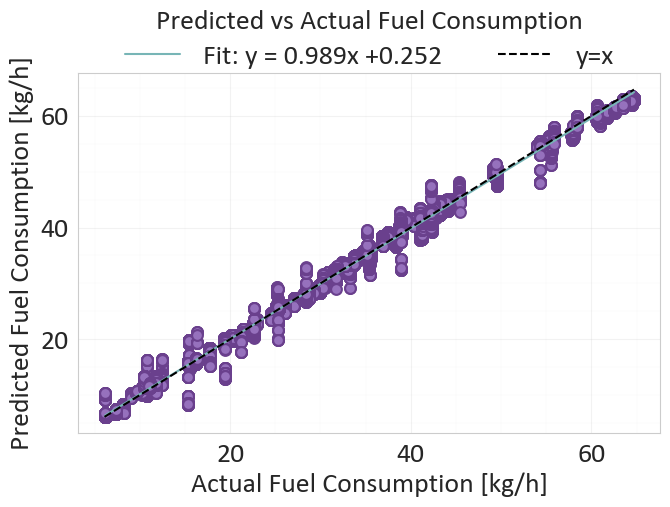

Real RMSE: 0.690296618899316
R^2 Score: 0.9973341822624207
L_inf = 0.4572


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▄▅▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.45719


wandb: Agent Starting Run: bmrv5i4a with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.3670, Val Loss = 1.5499
Epoch 10: Train Loss = 0.1104, Val Loss = 0.0691
Epoch 20: Train Loss = 0.0954, Val Loss = 0.0837
Epoch 30: Train Loss = 0.0421, Val Loss = 0.0413
Epoch 40: Train Loss = 0.0176, Val Loss = 0.0125
Epoch 50: Train Loss = 0.0146, Val Loss = 0.0131
Epoch 60: Train Loss = 0.0103, Val Loss = 0.0093
Epoch 70: Train Loss = 0.0074, Val Loss = 0.0083
Epoch 80: Train Loss = 0.0060, Val Loss = 0.0067
Epoch 90: Train Loss = 0.0051, Val Loss = 0.0065
Epoch 100: Train Loss = 0.0045, Val Loss = 0.0062
Epoch 110: Train Loss = 0.0041, Val Loss = 0.0058
Epoch 120: Train L

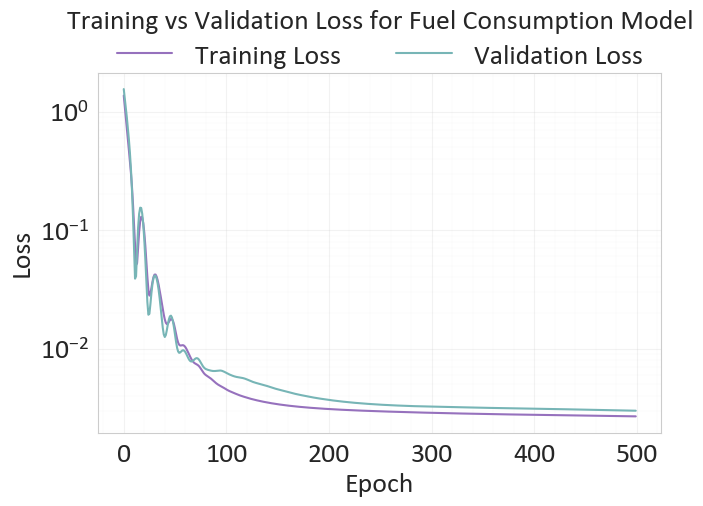

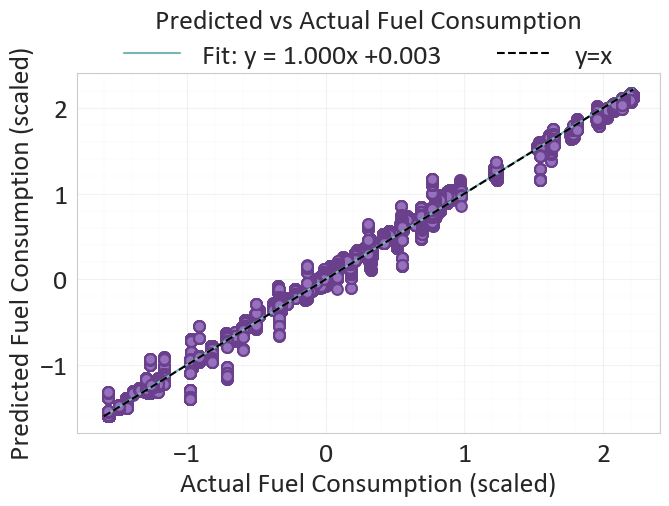

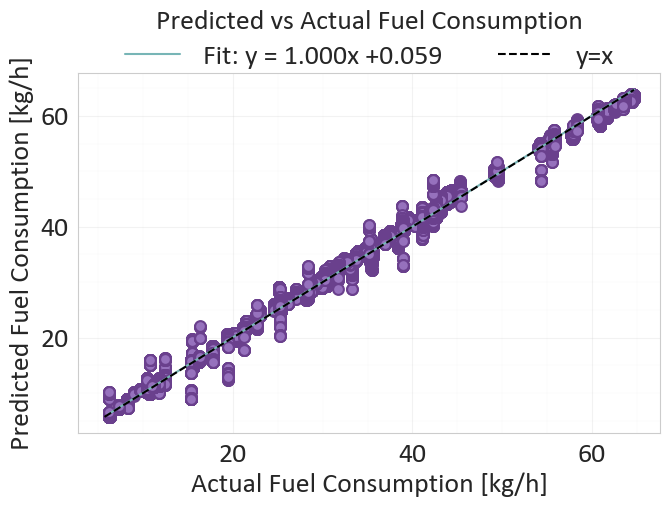

Real RMSE: 0.7399214432877933
R^2 Score: 0.996937096118927
L_inf = 0.4546


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,0.45465


wandb: Agent Starting Run: y857dix8 with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.7513, Val Loss = 0.7976
Epoch 10: Train Loss = 0.5808, Val Loss = 0.5953
Epoch 20: Train Loss = 0.4337, Val Loss = 0.4331
Epoch 30: Train Loss = 0.3139, Val Loss = 0.3031
Epoch 40: Train Loss = 0.2224, Val Loss = 0.2067
Epoch 50: Train Loss = 0.1574, Val Loss = 0.1392
Epoch 60: Train Loss = 0.1148, Val Loss = 0.0953
Epoch 70: Train Loss = 0.0885, Val Loss = 0.0696
Epoch 80: Train Loss = 0.0726, Val Loss = 0.0563
Epoch 90: Train Loss = 0.0628, Val Loss = 0.0497
Epoch 100: Train Loss = 0.0559, Val Loss = 0.0458
Epoch 110: Train Loss = 0.0503, Val Loss = 0.0427
Epoch 120: Train

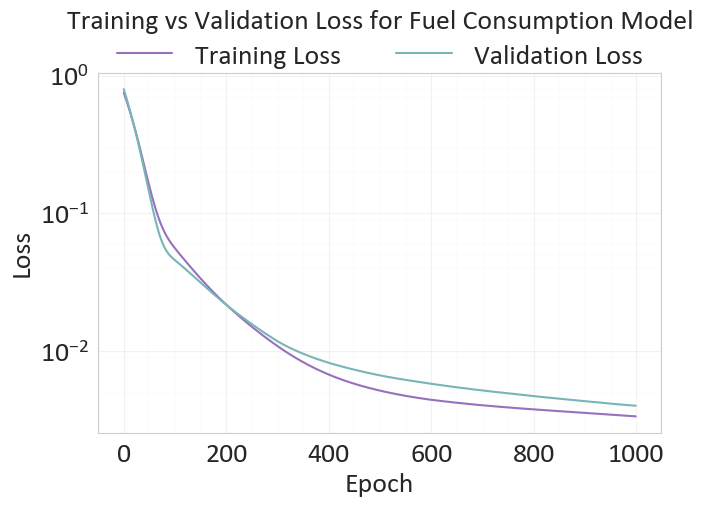

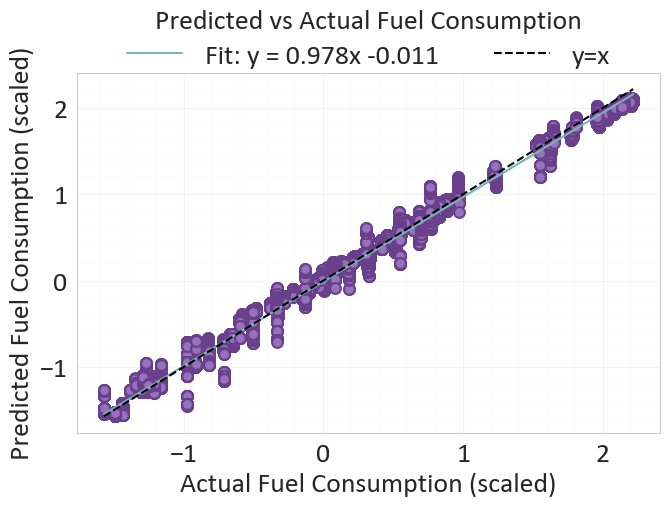

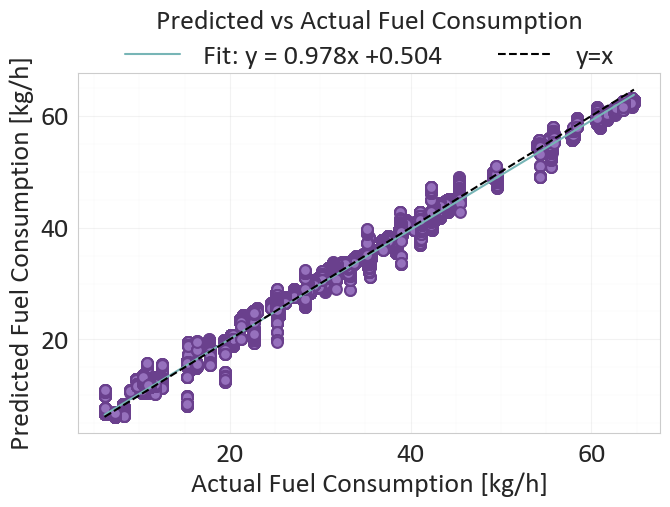

Real RMSE: 0.8663175188313711
R^2 Score: 0.9958013296127319
L_inf = 0.4669


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇██
epochs,▁
learning_rate,▁
L_inf,0.46694


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: x9jbr6vi with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.3670, Val Loss = 1.8170
Epoch 10: Train Loss = 1.1116, Val Loss = 1.5238
Epoch 20: Train Loss = 0.8997, Val Loss = 1.2746
Epoch 30: Train Loss = 0.7250, Val Loss = 1.0549
Epoch 40: Train Loss = 0.5773, Val Loss = 0.8530
Epoch 50: Train Loss = 0.4501, Val Loss = 0.6667
Epoch 60: Train Loss = 0.3381, Val Loss = 0.4957
Epoch 70: Train Loss = 0.2412, Val Loss = 0.3452
Epoch 80: Train Loss = 0.1620, Val Loss = 0.2224
Epoch 90: Train Loss = 0.1035, Val Loss = 0.1322
Epoch 100: Train Loss = 0.0656, Val Loss = 0.0741
Epoch 110: Train Loss = 0.0447, Val Loss = 0.0423
Epoch 120: Train

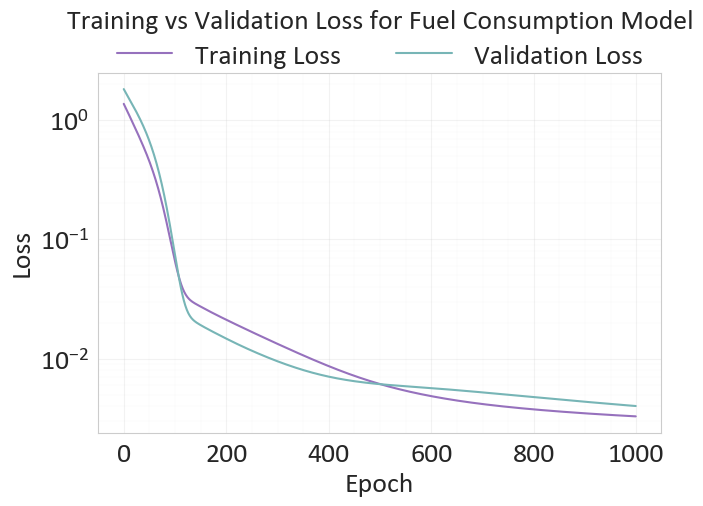

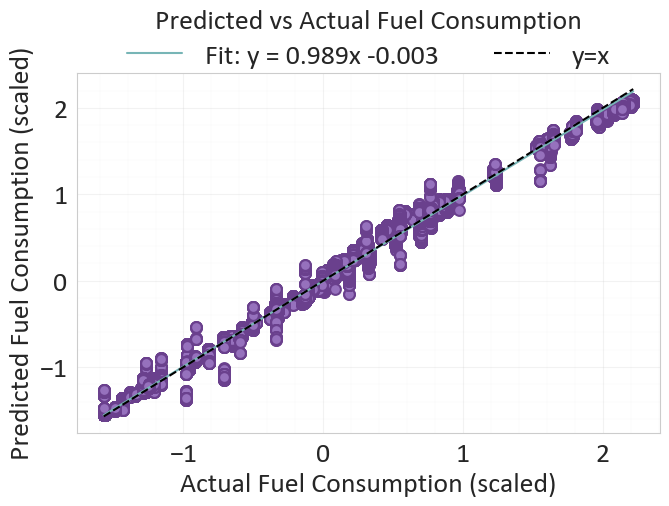

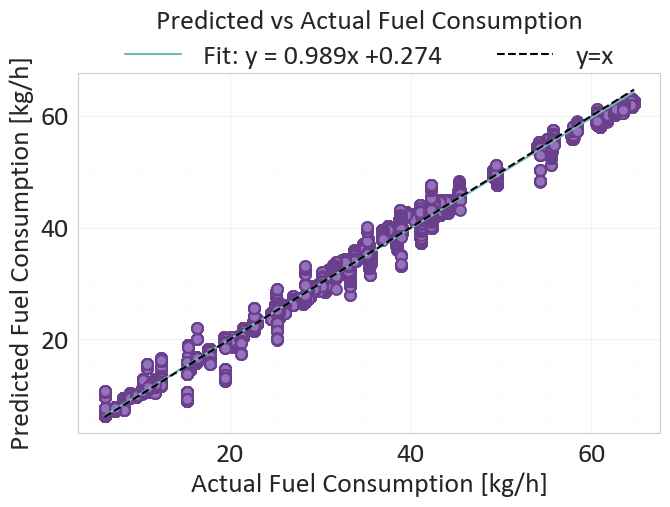

Real RMSE: 0.7934242781701474
R^2 Score: 0.9964781403541565
L_inf = 0.4439


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▅▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,0.44393


wandb: Agent Starting Run: jw6r6suq with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.7513, Val Loss = 0.6131
Epoch 10: Train Loss = 0.1081, Val Loss = 0.1316
Epoch 20: Train Loss = 0.0433, Val Loss = 0.0343
Epoch 30: Train Loss = 0.0286, Val Loss = 0.0235
Epoch 40: Train Loss = 0.0182, Val Loss = 0.0164
Epoch 50: Train Loss = 0.0111, Val Loss = 0.0111
Epoch 60: Train Loss = 0.0077, Val Loss = 0.0083
Epoch 70: Train Loss = 0.0058, Val Loss = 0.0070
Epoch 80: Train Loss = 0.0049, Val Loss = 0.0068
Epoch 90: Train Loss = 0.0045, Val Loss = 0.0065
Epoch 100: Train Loss = 0.0043, Val Loss = 0.0064
Epoch 110: Train Loss = 0.0042, Val Loss = 0.0060
Epoch 120: Train 

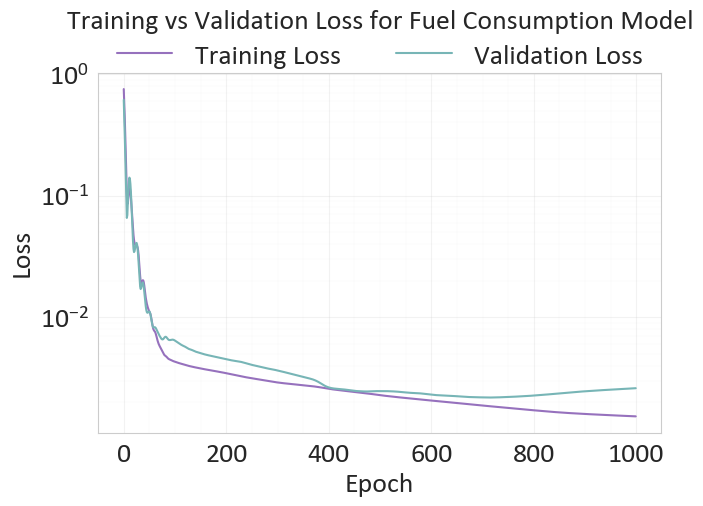

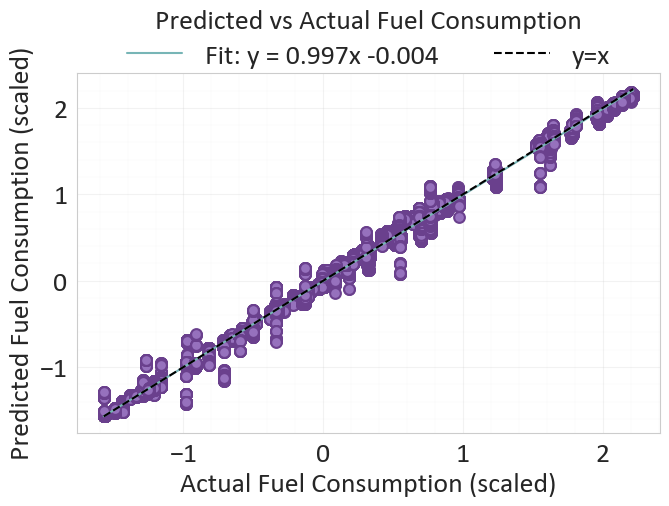

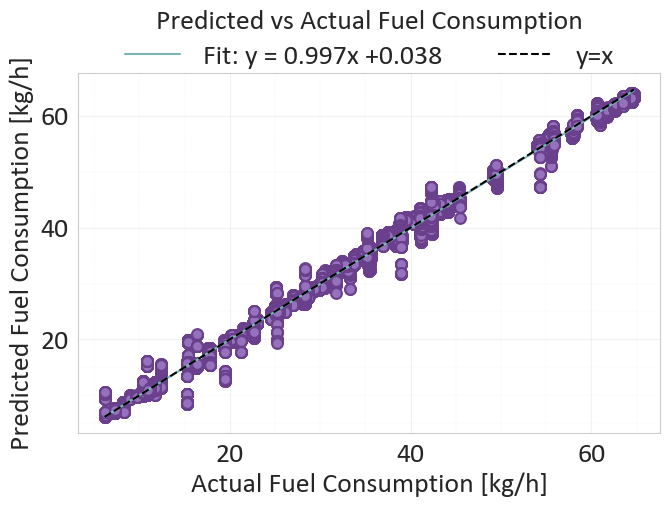

Real RMSE: 0.6973662103501427
R^2 Score: 0.9972792863845825
L_inf = 0.4710


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,██▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇███
epochs,▁
learning_rate,▁
L_inf,0.47101


wandb: Agent Starting Run: ociafj41 with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.3670, Val Loss = 1.5499
Epoch 10: Train Loss = 0.1104, Val Loss = 0.0691
Epoch 20: Train Loss = 0.0954, Val Loss = 0.0837
Epoch 30: Train Loss = 0.0421, Val Loss = 0.0413
Epoch 40: Train Loss = 0.0176, Val Loss = 0.0125
Epoch 50: Train Loss = 0.0146, Val Loss = 0.0131
Epoch 60: Train Loss = 0.0103, Val Loss = 0.0093
Epoch 70: Train Loss = 0.0074, Val Loss = 0.0083
Epoch 80: Train Loss = 0.0060, Val Loss = 0.0067
Epoch 90: Train Loss = 0.0051, Val Loss = 0.0065
Epoch 100: Train Loss = 0.0045, Val Loss = 0.0062
Epoch 110: Train Loss = 0.0041, Val Loss = 0.0058
Epoch 120: Train 

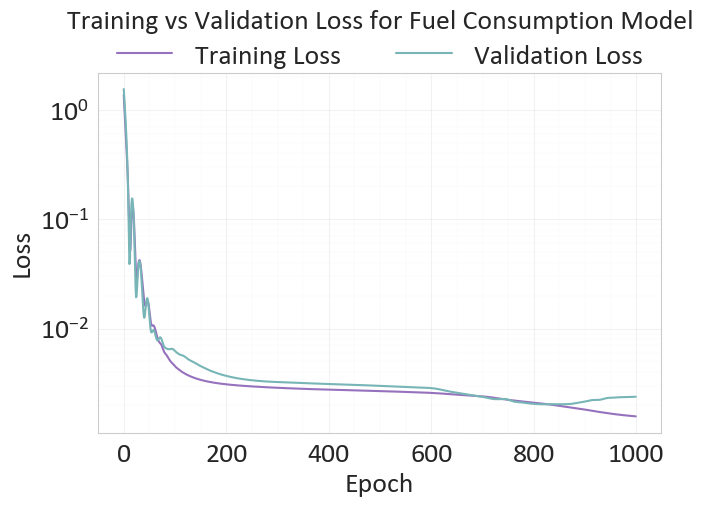

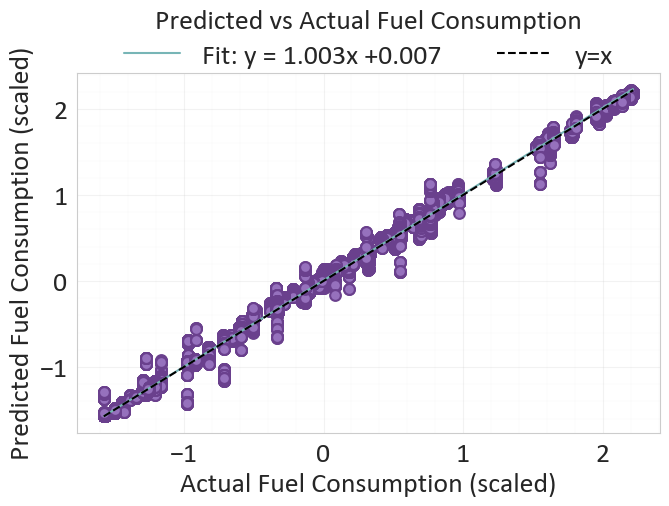

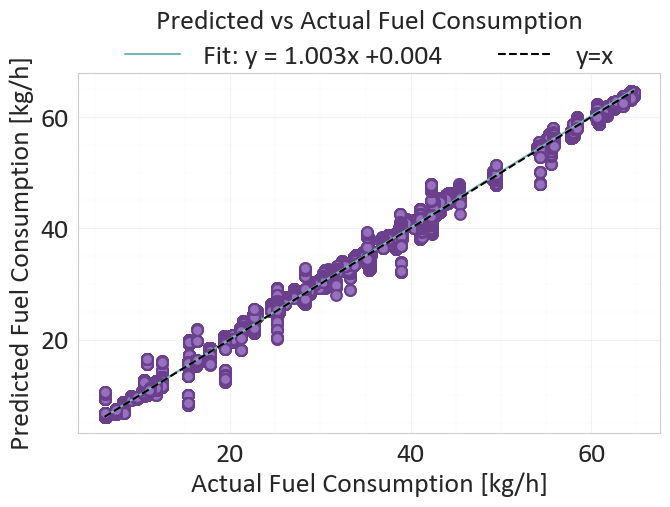

Real RMSE: 0.7272047260311306
R^2 Score: 0.9970414638519287
L_inf = 0.4548


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▄▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇███
epochs,▁
learning_rate,▁
L_inf,0.45485


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [31]:
# Run the simple model with engineered features for Fuel Consumption
X = X_engineered
feature_set_name = "Engineered_Simple"
sweep_id = wandb.sweep(sweep_config_simple, project="FOC_nn")
wandb.agent(sweep_id, lambda: train_Fuel_Consumption("Featured Fuel Consumption"))

Create sweep with ID: 2rfct0cq
Sweep URL: https://wandb.ai/sakkis-national-technical-university-of-athens/NOx_nn/sweeps/2rfct0cq


wandb: Agent Starting Run: gvkjv4a3 with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9951, Val Loss = 0.4156
Epoch 10: Train Loss = 0.8871, Val Loss = 0.3715
Epoch 20: Train Loss = 0.7898, Val Loss = 0.3421
Epoch 30: Train Loss = 0.7038, Val Loss = 0.3198
Epoch 40: Train Loss = 0.6308, Val Loss = 0.3038
Epoch 50: Train Loss = 0.5696, Val Loss = 0.2924
Epoch 60: Train Loss = 0.5170, Val Loss = 0.2821
Epoch 70: Train Loss = 0.4703, Val Loss = 0.2709
Epoch 80: Train Loss = 0.4277, Val Loss = 0.2585
Epoch 90: Train Loss = 0.3888, Val Loss = 0.2460
Epoch 100: Train Loss = 0.3531, Val Loss = 0.2342
Epoch 110: Train Loss = 0.3203, Val Loss = 0.2233
Epoch 120: Train Loss = 0.2903

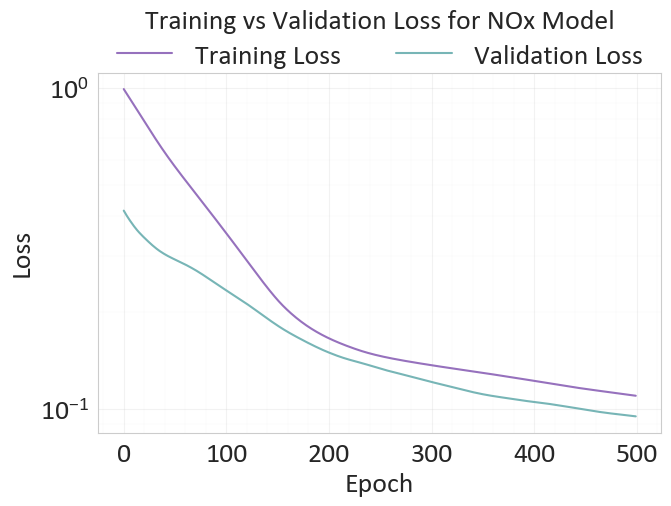

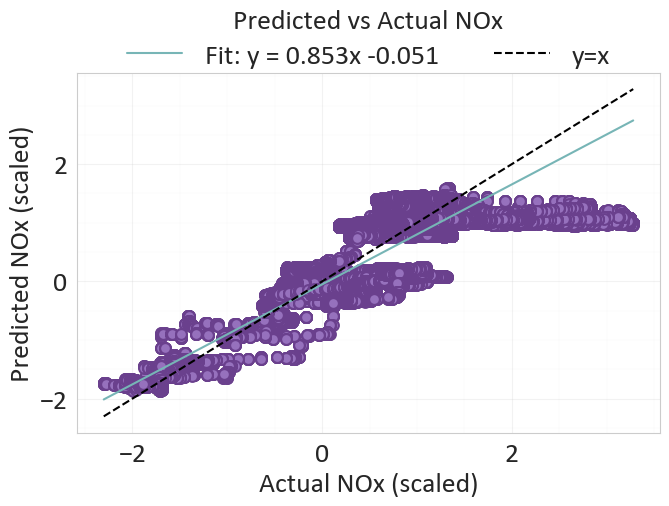

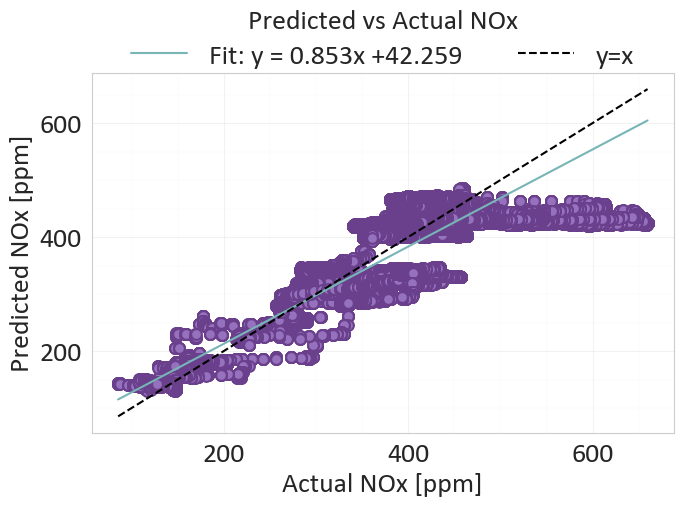

Real RMSE: 41.602829352776595
R^2 Score: 0.8428523540496826
L_inf = 2.3186


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▇▇▆▅▄▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▆▆▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,2.31859


wandb: Agent Starting Run: wg1lzgjq with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.1713, Val Loss = 0.7416
Epoch 10: Train Loss = 0.9826, Val Loss = 0.5780
Epoch 20: Train Loss = 0.8330, Val Loss = 0.4555
Epoch 30: Train Loss = 0.7164, Val Loss = 0.3680
Epoch 40: Train Loss = 0.6240, Val Loss = 0.3097
Epoch 50: Train Loss = 0.5500, Val Loss = 0.2716
Epoch 60: Train Loss = 0.4898, Val Loss = 0.2480
Epoch 70: Train Loss = 0.4399, Val Loss = 0.2333
Epoch 80: Train Loss = 0.3974, Val Loss = 0.2229
Epoch 90: Train Loss = 0.3603, Val Loss = 0.2135
Epoch 100: Train Loss = 0.3275, Val Loss = 0.2042
Epoch 110: Train Loss = 0.2977, Val Loss = 0.1953
Epoch 120: Train Loss = 0.2711

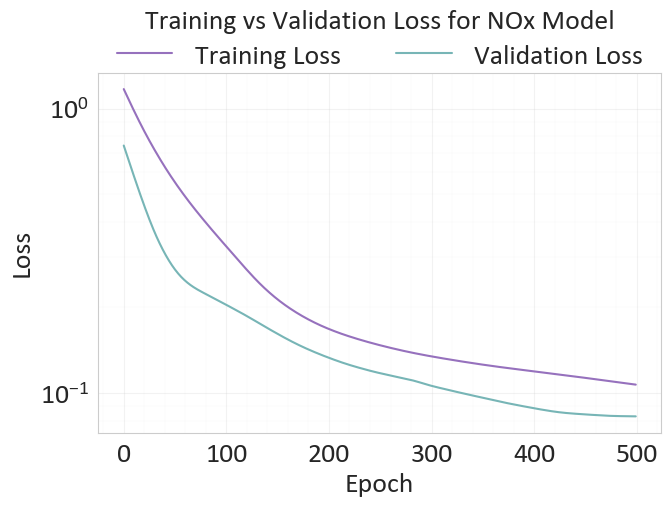

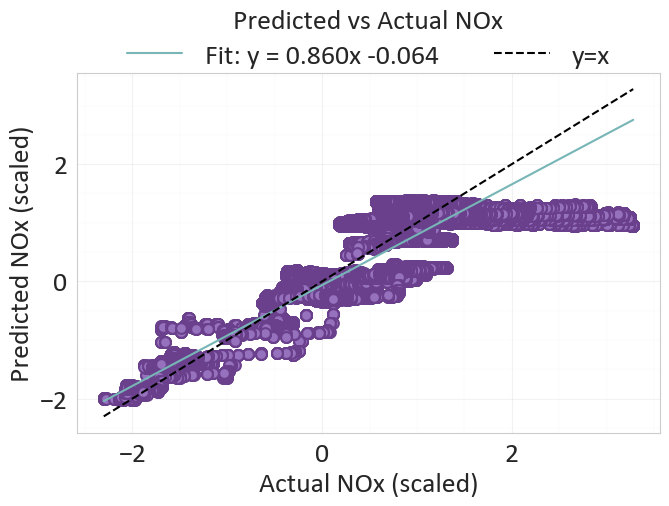

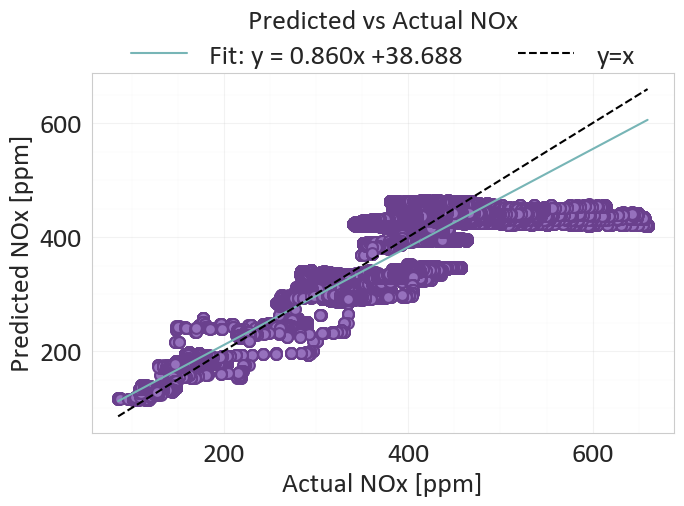

Real RMSE: 40.578376190500926
R^2 Score: 0.8504964113235474
L_inf = 2.3303


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▅▅▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▅▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
epochs,▁
learning_rate,▁
L_inf,2.33028


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: g4qjciy1 with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9951, Val Loss = 0.3756
Epoch 10: Train Loss = 0.4211, Val Loss = 0.3186
Epoch 20: Train Loss = 0.2099, Val Loss = 0.1608
Epoch 30: Train Loss = 0.1593, Val Loss = 0.1550
Epoch 40: Train Loss = 0.1420, Val Loss = 0.1074
Epoch 50: Train Loss = 0.1291, Val Loss = 0.1042
Epoch 60: Train Loss = 0.1221, Val Loss = 0.0949
Epoch 70: Train Loss = 0.1164, Val Loss = 0.0882
Epoch 80: Train Loss = 0.1120, Val Loss = 0.0884
Epoch 90: Train Loss = 0.1085, Val Loss = 0.0863
Epoch 100: Train Loss = 0.1044, Val Loss = 0.0856
Epoch 110: Train Loss = 0.1002, Val Loss = 0.0827
Epoch 120: Train Loss = 0.0958,

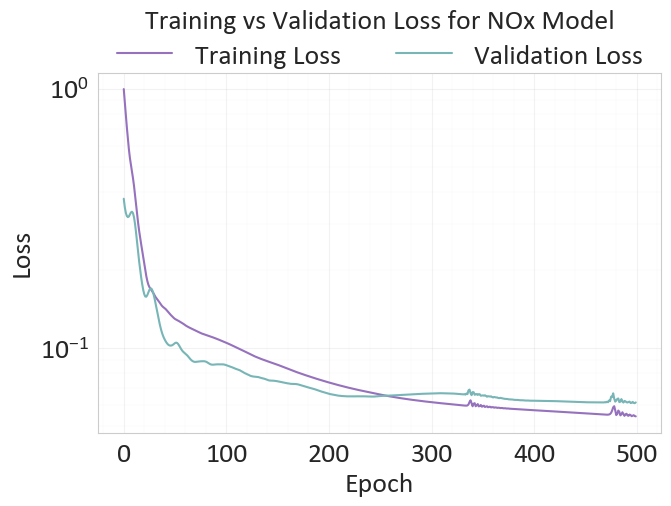

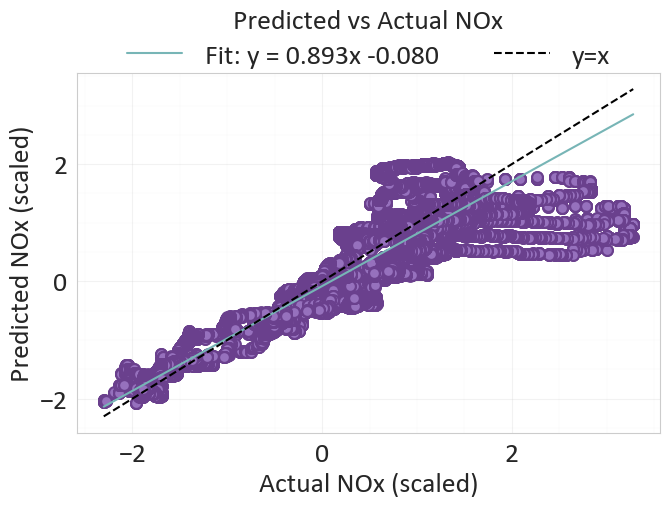

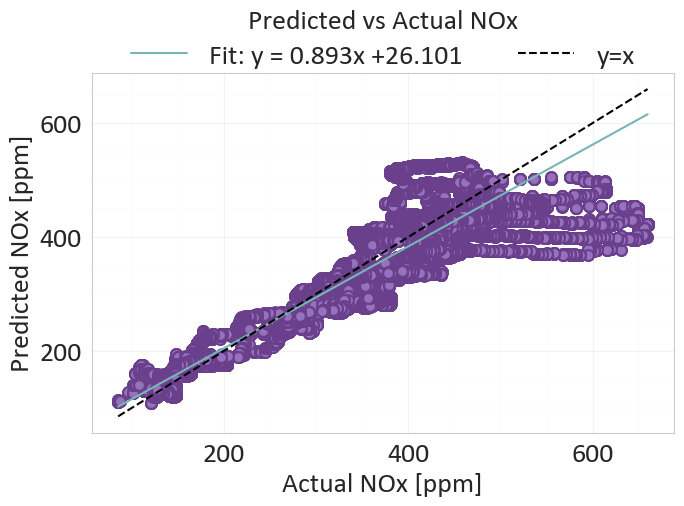

Real RMSE: 42.458113550298016
R^2 Score: 0.8363245725631714
L_inf = 2.5153


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▅▄▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇████
epochs,▁
learning_rate,▁
L_inf,2.51528


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 88mslste with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.1713, Val Loss = 0.5913
Epoch 10: Train Loss = 0.3976, Val Loss = 0.3099
Epoch 20: Train Loss = 0.2216, Val Loss = 0.1703
Epoch 30: Train Loss = 0.1716, Val Loss = 0.1491
Epoch 40: Train Loss = 0.1527, Val Loss = 0.1207
Epoch 50: Train Loss = 0.1344, Val Loss = 0.1255
Epoch 60: Train Loss = 0.1220, Val Loss = 0.1012
Epoch 70: Train Loss = 0.1137, Val Loss = 0.0926
Epoch 80: Train Loss = 0.1076, Val Loss = 0.0876
Epoch 90: Train Loss = 0.1030, Val Loss = 0.0852
Epoch 100: Train Loss = 0.0994, Val Loss = 0.0805
Epoch 110: Train Loss = 0.0963, Val Loss = 0.0781
Epoch 120: Train Loss = 0.0931,

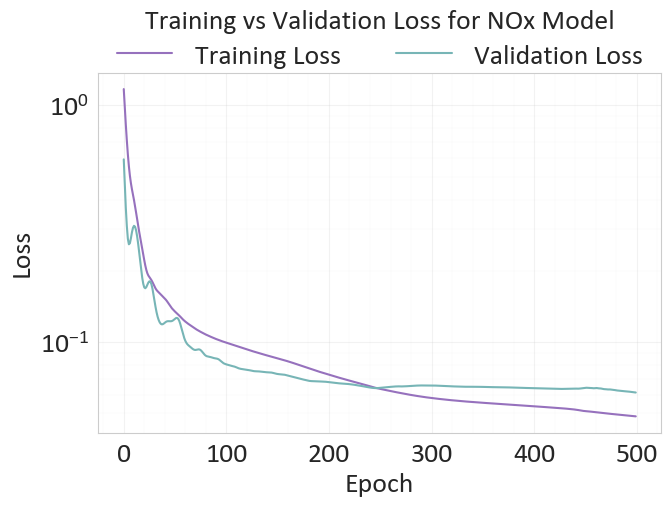

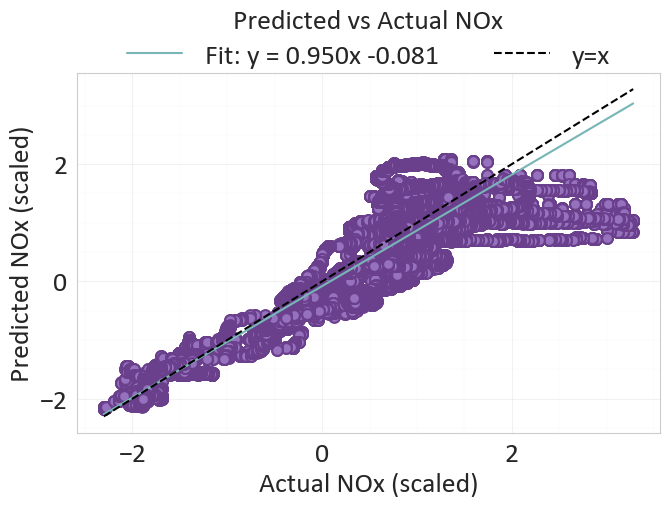

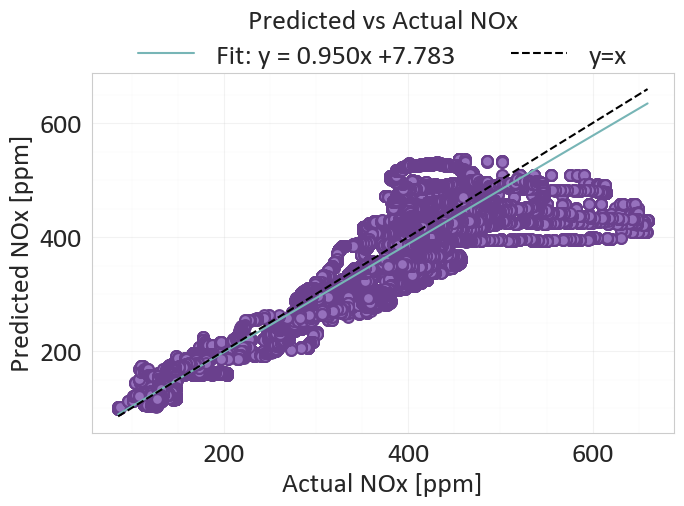

Real RMSE: 41.079631605121534
R^2 Score: 0.8467800617218018
L_inf = 2.4299


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▅▅▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,██▄▄▅▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,2.42992


wandb: Agent Starting Run: lc7dxun8 with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.9951, Val Loss = 0.4156
Epoch 10: Train Loss = 0.8871, Val Loss = 0.3715
Epoch 20: Train Loss = 0.7898, Val Loss = 0.3421
Epoch 30: Train Loss = 0.7038, Val Loss = 0.3198
Epoch 40: Train Loss = 0.6308, Val Loss = 0.3038
Epoch 50: Train Loss = 0.5696, Val Loss = 0.2924
Epoch 60: Train Loss = 0.5170, Val Loss = 0.2821
Epoch 70: Train Loss = 0.4703, Val Loss = 0.2709
Epoch 80: Train Loss = 0.4277, Val Loss = 0.2585
Epoch 90: Train Loss = 0.3888, Val Loss = 0.2460
Epoch 100: Train Loss = 0.3531, Val Loss = 0.2342
Epoch 110: Train Loss = 0.3203, Val Loss = 0.2233
Epoch 120: Train Loss = 0.290

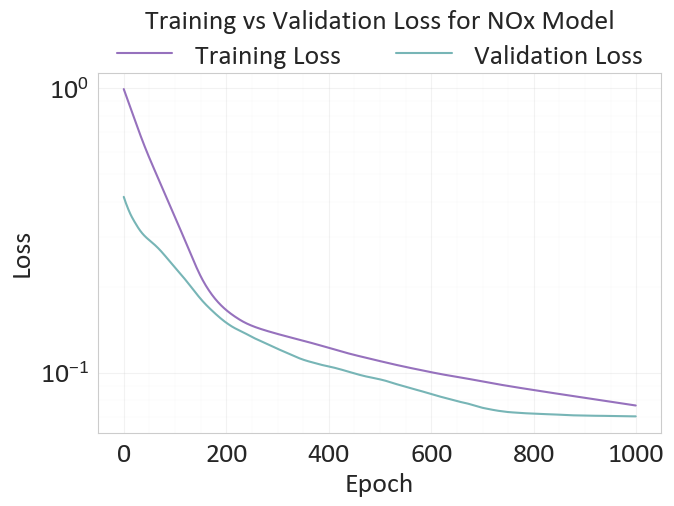

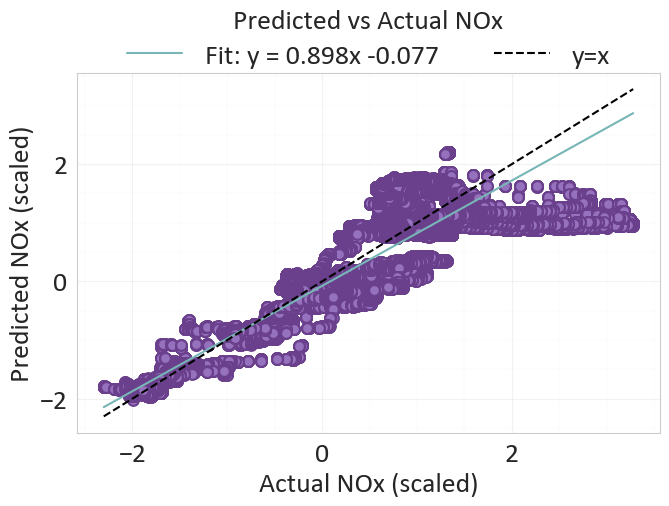

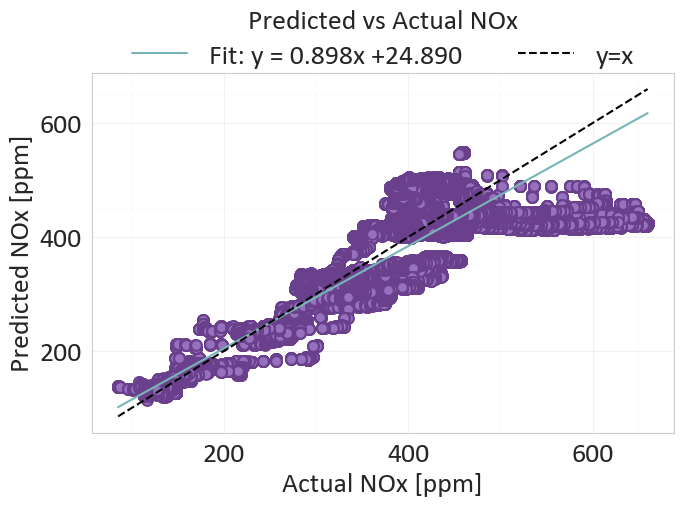

Real RMSE: 40.466163346388086
R^2 Score: 0.8513221740722656
L_inf = 2.3325


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▆▅▅▄▄▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▆▆▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇██
epochs,▁
learning_rate,▁
L_inf,2.33247


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: stac5x72 with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.001
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.001 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.1713, Val Loss = 0.7416
Epoch 10: Train Loss = 0.9826, Val Loss = 0.5780
Epoch 20: Train Loss = 0.8330, Val Loss = 0.4555
Epoch 30: Train Loss = 0.7164, Val Loss = 0.3680
Epoch 40: Train Loss = 0.6240, Val Loss = 0.3097
Epoch 50: Train Loss = 0.5500, Val Loss = 0.2716
Epoch 60: Train Loss = 0.4898, Val Loss = 0.2480
Epoch 70: Train Loss = 0.4399, Val Loss = 0.2333
Epoch 80: Train Loss = 0.3974, Val Loss = 0.2229
Epoch 90: Train Loss = 0.3603, Val Loss = 0.2135
Epoch 100: Train Loss = 0.3275, Val Loss = 0.2042
Epoch 110: Train Loss = 0.2977, Val Loss = 0.1953
Epoch 120: Train Loss = 0.271

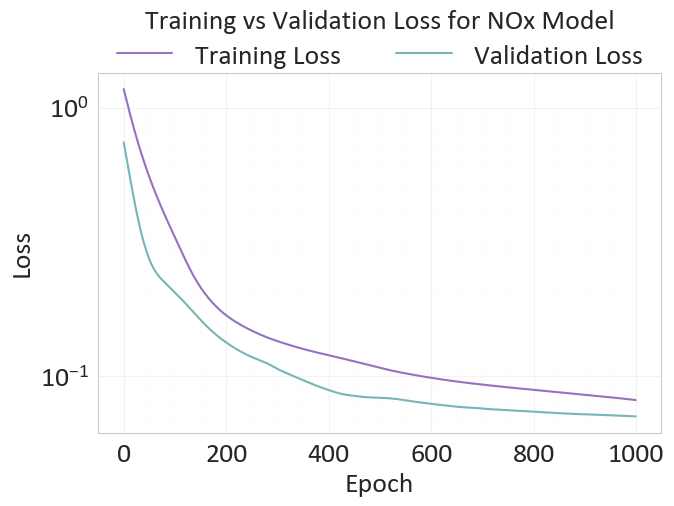

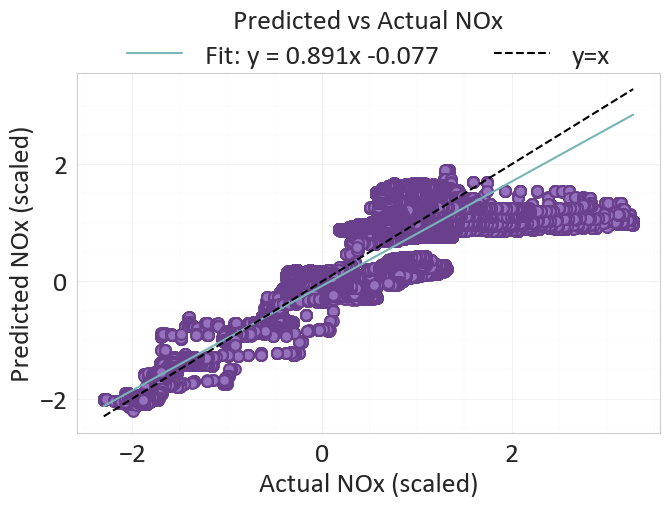

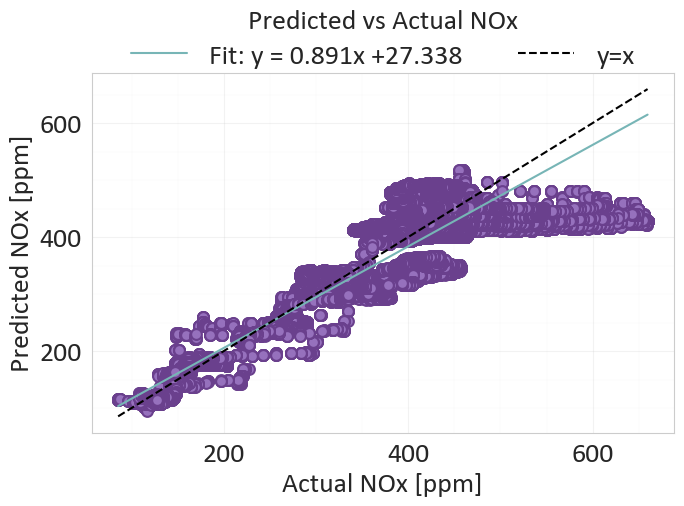

Real RMSE: 40.33706857919276
R^2 Score: 0.8522692322731018
L_inf = 2.3092


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▅▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,2.30925


wandb: Agent Starting Run: svpedi6e with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [16]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [16] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 0.9951, Val Loss = 0.3756
Epoch 10: Train Loss = 0.4211, Val Loss = 0.3186
Epoch 20: Train Loss = 0.2099, Val Loss = 0.1608
Epoch 30: Train Loss = 0.1593, Val Loss = 0.1550
Epoch 40: Train Loss = 0.1420, Val Loss = 0.1074
Epoch 50: Train Loss = 0.1291, Val Loss = 0.1042
Epoch 60: Train Loss = 0.1221, Val Loss = 0.0949
Epoch 70: Train Loss = 0.1164, Val Loss = 0.0882
Epoch 80: Train Loss = 0.1120, Val Loss = 0.0884
Epoch 90: Train Loss = 0.1085, Val Loss = 0.0863
Epoch 100: Train Loss = 0.1044, Val Loss = 0.0856
Epoch 110: Train Loss = 0.1002, Val Loss = 0.0827
Epoch 120: Train Loss = 0.0958

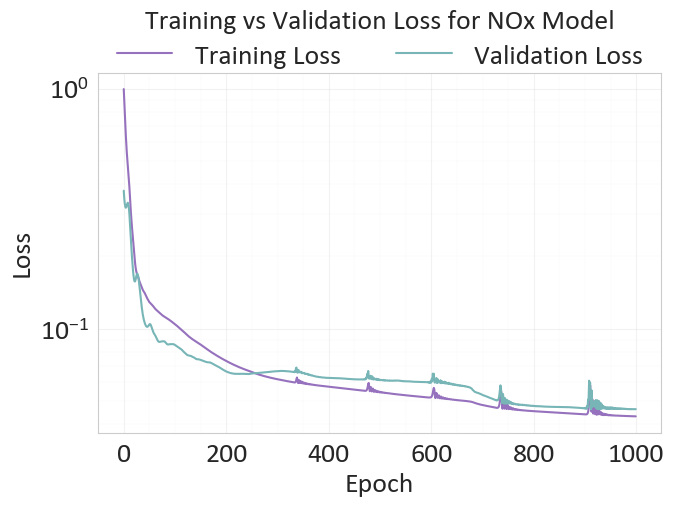

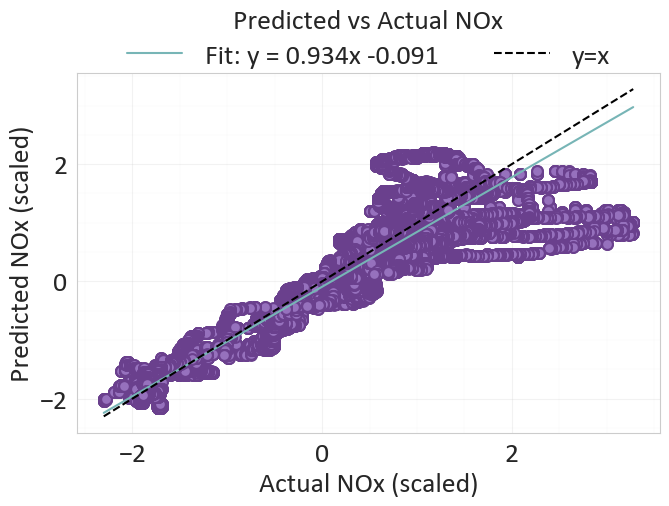

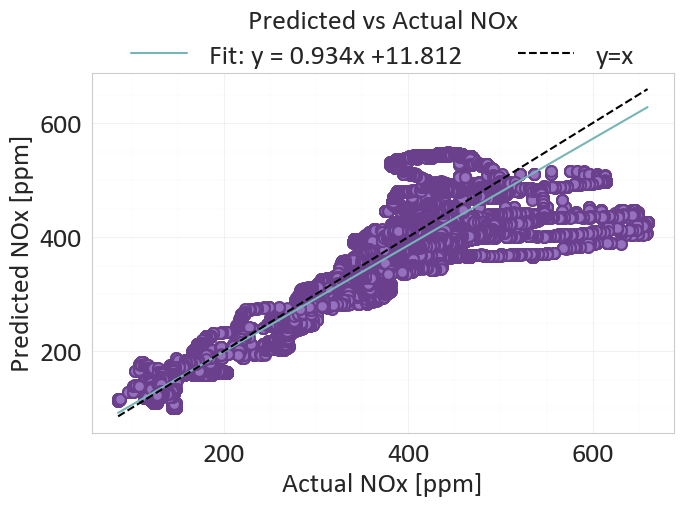

Real RMSE: 43.034031375706746
R^2 Score: 0.8318541049957275
L_inf = 2.4622


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,███▆▅▄▄▄▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.46215


wandb: Agent Starting Run: 5d1ch2ms with config:
wandb: 	epochs: 1000
wandb: 	lr: 0.01
wandb: 	neurons: [20]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Featured NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [20] neurons with 0.01 learning rate and 1000 epochs ########################## 

Epoch 0: Train Loss = 1.1713, Val Loss = 0.5913
Epoch 10: Train Loss = 0.3976, Val Loss = 0.3099
Epoch 20: Train Loss = 0.2216, Val Loss = 0.1703
Epoch 30: Train Loss = 0.1716, Val Loss = 0.1491
Epoch 40: Train Loss = 0.1527, Val Loss = 0.1207
Epoch 50: Train Loss = 0.1344, Val Loss = 0.1255
Epoch 60: Train Loss = 0.1220, Val Loss = 0.1012
Epoch 70: Train Loss = 0.1137, Val Loss = 0.0926
Epoch 80: Train Loss = 0.1076, Val Loss = 0.0876
Epoch 90: Train Loss = 0.1030, Val Loss = 0.0852
Epoch 100: Train Loss = 0.0994, Val Loss = 0.0805
Epoch 110: Train Loss = 0.0963, Val Loss = 0.0781
Epoch 120: Train Loss = 0.0931

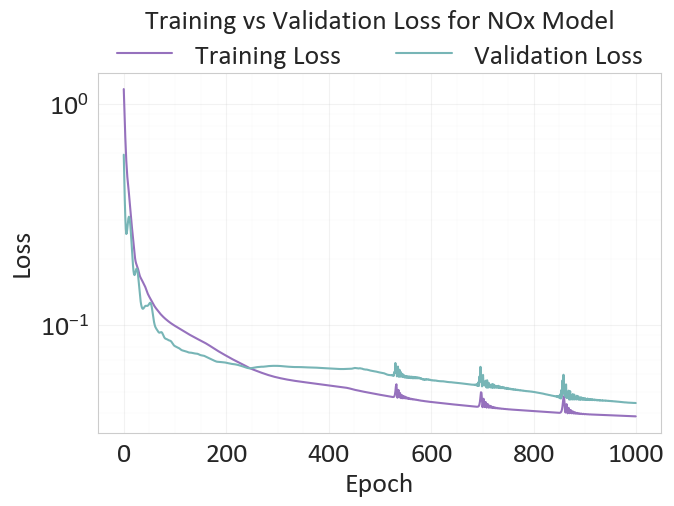

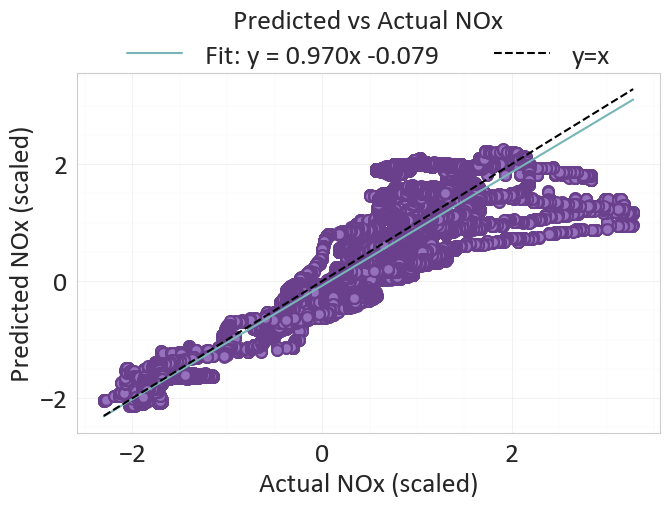

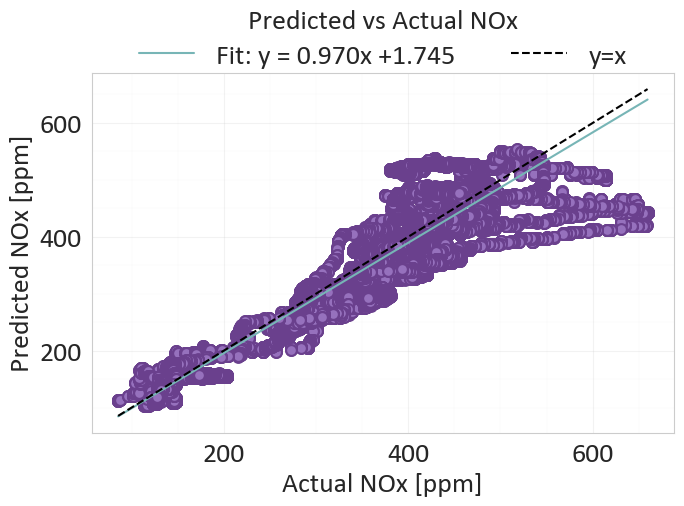

Real RMSE: 41.923170754294695
R^2 Score: 0.8404229283332825
L_inf = 2.3302


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,██▆▆▅▅▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▅▄▅▅▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,2.33024


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [32]:
# Run the simple model with engineered features for NOx
X = X_engineered
feature_set_name = "Engineered_Simple"
sweep_id = wandb.sweep(sweep_config_simple, project="NOx_nn")
wandb.agent(sweep_id, lambda: train_NOx("Featured NOx"))

Create sweep with ID: uqouhl03
Sweep URL: https://wandb.ai/sakkis-national-technical-university-of-athens/FOC_nn/sweeps/uqouhl03


wandb: Agent Starting Run: haehptri with config:
wandb: 	epochs: 200
wandb: 	lr: 0.001
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.001 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.1097, Val Loss = 1.3921
Epoch 10: Train Loss = 0.7926, Val Loss = 1.0410
Epoch 20: Train Loss = 0.5486, Val Loss = 0.7625
Epoch 30: Train Loss = 0.3791, Val Loss = 0.5489
Epoch 40: Train Loss = 0.2709, Val Loss = 0.3925
Epoch 50: Train Loss = 0.1968, Val Loss = 0.2759
Epoch 60: Train Loss = 0.1382, Val Loss = 0.1842
Epoch 70: Train Loss = 0.0946, Val Loss = 0.1158
Epoch 80: Train Loss = 0.0658, Val Loss = 0.0712
Epoch 90: Train Loss = 0.0484, Val Loss = 0.0459
Epoch 100: Train Loss = 0.0381, Val Loss = 0.0333
Epoch 110: Train Loss = 0.0315, Val Loss = 0.0270
Epoch 120: Train L

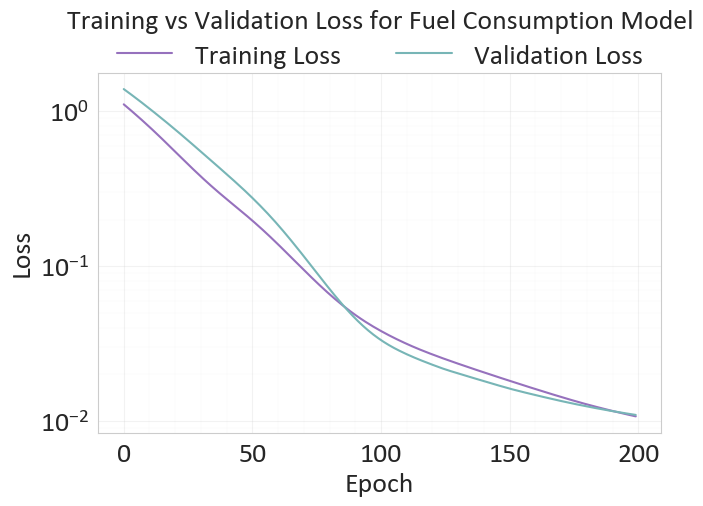

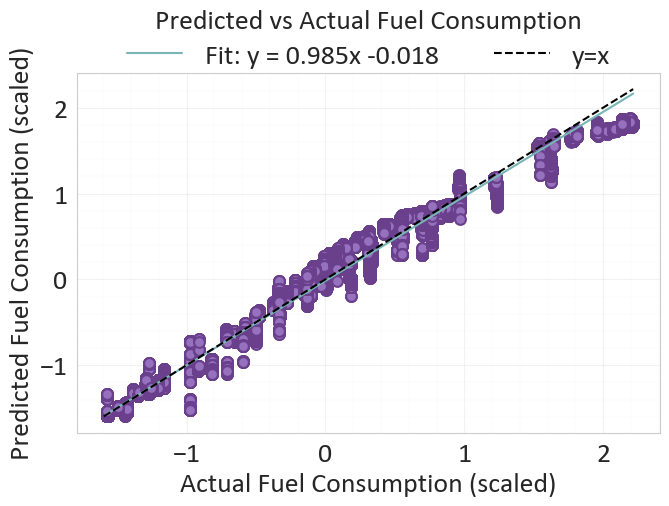

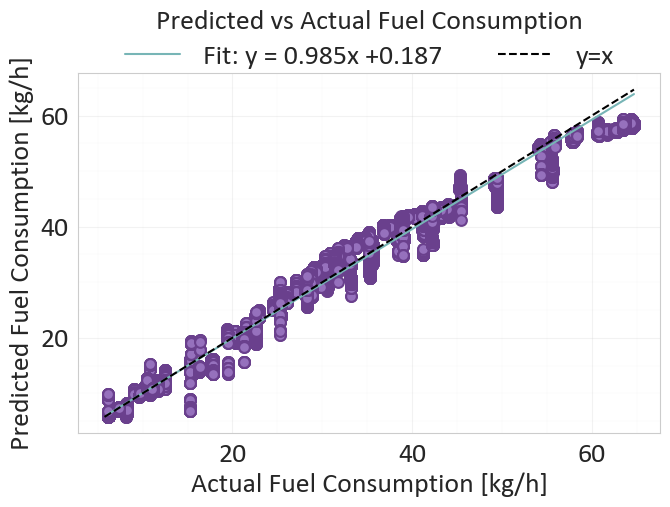

Real RMSE: 1.51703994614897
R^2 Score: 0.9871248006820679
L_inf = 0.5474


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,██▇▇▆▅▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▆▆▅▅▅▅▄▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,0.54736


wandb: Agent Starting Run: baqnnw1q with config:
wandb: 	epochs: 200
wandb: 	lr: 0.001
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.001 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 0.9203, Val Loss = 1.1335
Epoch 10: Train Loss = 0.6766, Val Loss = 0.8660
Epoch 20: Train Loss = 0.4610, Val Loss = 0.6318
Epoch 30: Train Loss = 0.2761, Val Loss = 0.3901
Epoch 40: Train Loss = 0.1275, Val Loss = 0.1650
Epoch 50: Train Loss = 0.0408, Val Loss = 0.0338
Epoch 60: Train Loss = 0.0335, Val Loss = 0.0267
Epoch 70: Train Loss = 0.0220, Val Loss = 0.0172
Epoch 80: Train Loss = 0.0161, Val Loss = 0.0145
Epoch 90: Train Loss = 0.0117, Val Loss = 0.0103
Epoch 100: Train Loss = 0.0083, Val Loss = 0.0069
Epoch 110: Train Loss = 0.0063, Val Loss = 0.0053
Epoch 120: Tra

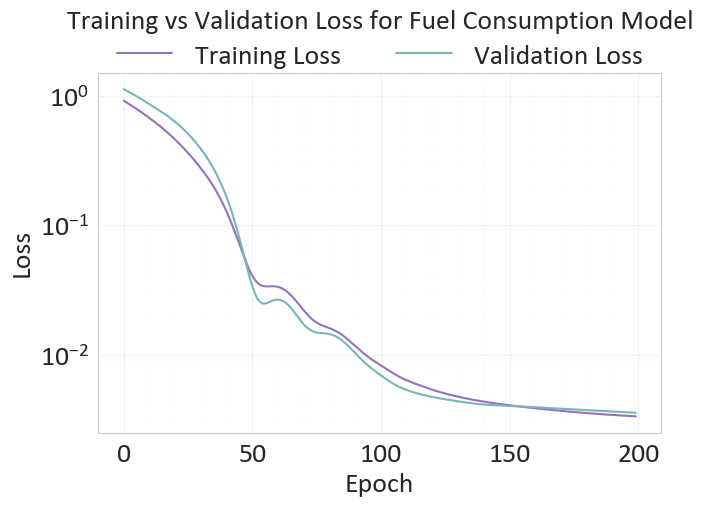

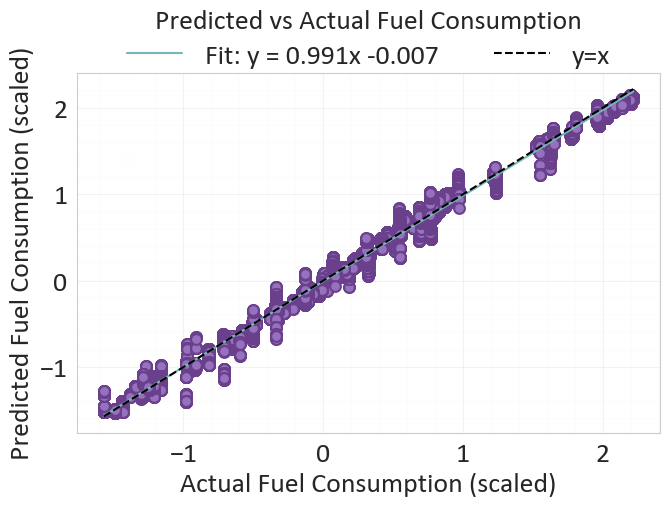

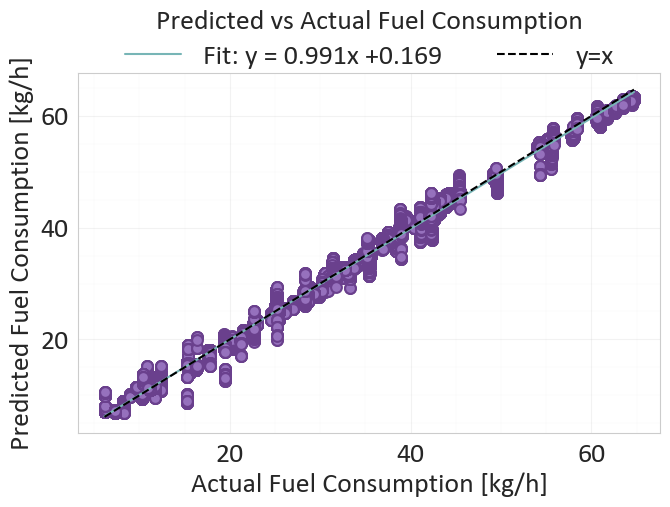

Real RMSE: 0.8476607854343851
R^2 Score: 0.9959802031517029
L_inf = 0.4426


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▆▆▅▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,0.44261


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: uw1tpnpm with config:
wandb: 	epochs: 200
wandb: 	lr: 0.001
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.001 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.0284, Val Loss = 0.9610
Epoch 10: Train Loss = 0.4285, Val Loss = 0.4201
Epoch 20: Train Loss = 0.0784, Val Loss = 0.0683
Epoch 30: Train Loss = 0.0442, Val Loss = 0.0456
Epoch 40: Train Loss = 0.0193, Val Loss = 0.0146
Epoch 50: Train Loss = 0.0148, Val Loss = 0.0146
Epoch 60: Train Loss = 0.0075, Val Loss = 0.0064
Epoch 70: Train Loss = 0.0058, Val Loss = 0.0046
Epoch 80: Train Loss = 0.0049, Val Loss = 0.0043
Epoch 90: Train Loss = 0.0042, Val Loss = 0.0036
Epoch 100: Train Loss = 0.0039, Val Loss = 0.0034
Epoch 110: Train Loss = 0.0036, Val Loss = 0.0033
Epoch 120: Tra

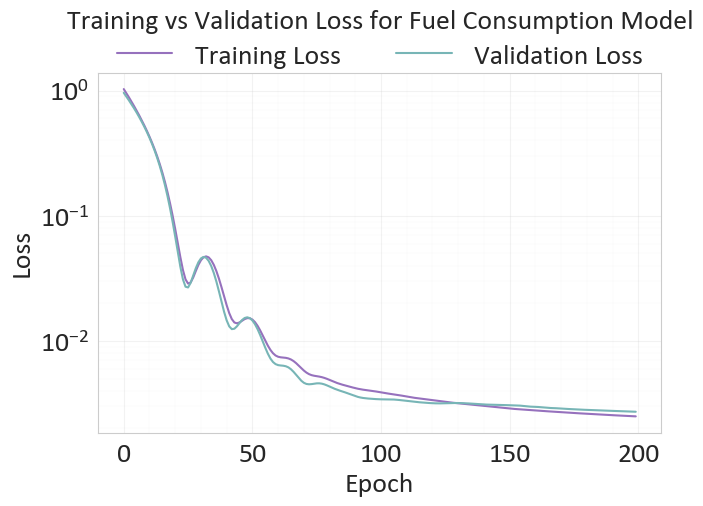

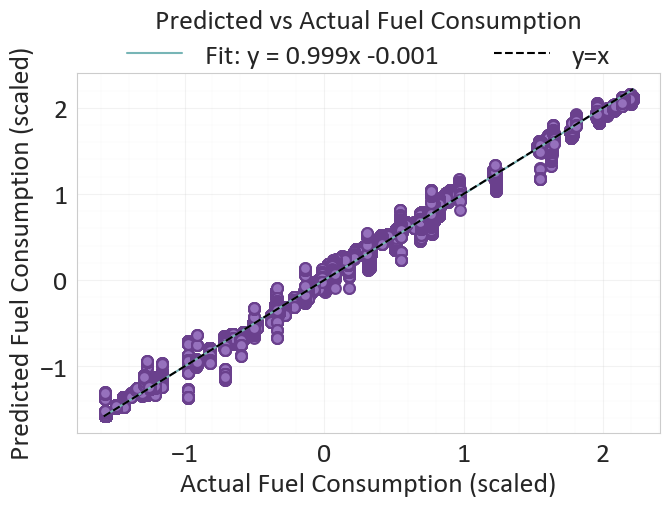

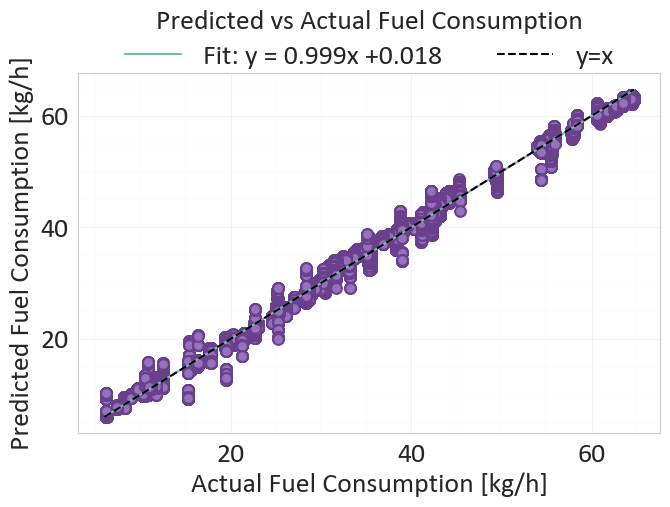

Real RMSE: 0.8086604952331669
R^2 Score: 0.9963415861129761
L_inf = 0.4456


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,██▆▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇██
epochs,▁
learning_rate,▁
L_inf,0.44564


wandb: Agent Starting Run: 2nxz1bew with config:
wandb: 	epochs: 200
wandb: 	lr: 0.01
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.01 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.1097, Val Loss = 1.0711
Epoch 10: Train Loss = 0.0722, Val Loss = 0.0496
Epoch 20: Train Loss = 0.0281, Val Loss = 0.0237
Epoch 30: Train Loss = 0.0196, Val Loss = 0.0132
Epoch 40: Train Loss = 0.0109, Val Loss = 0.0125
Epoch 50: Train Loss = 0.0065, Val Loss = 0.0113
Epoch 60: Train Loss = 0.0050, Val Loss = 0.0082
Epoch 70: Train Loss = 0.0043, Val Loss = 0.0082
Epoch 80: Train Loss = 0.0039, Val Loss = 0.0057
Epoch 90: Train Loss = 0.0036, Val Loss = 0.0054
Epoch 100: Train Loss = 0.0034, Val Loss = 0.0047
Epoch 110: Train Loss = 0.0033, Val Loss = 0.0044
Epoch 120: Train Lo

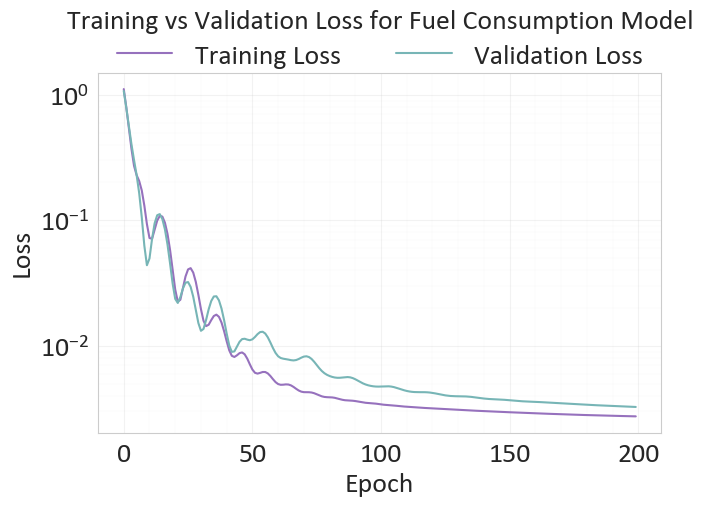

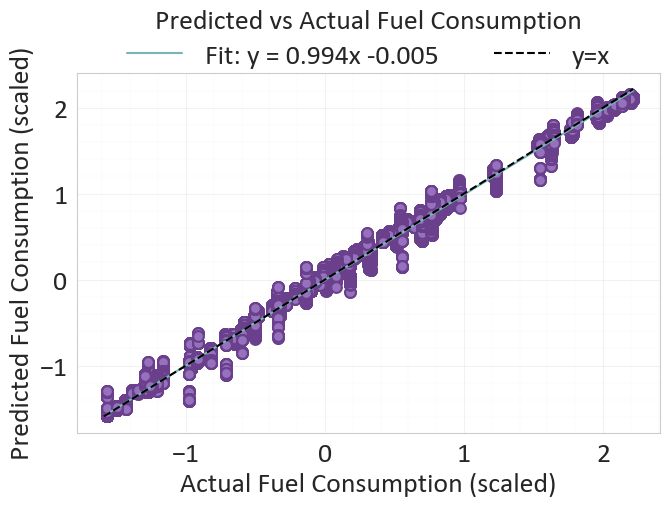

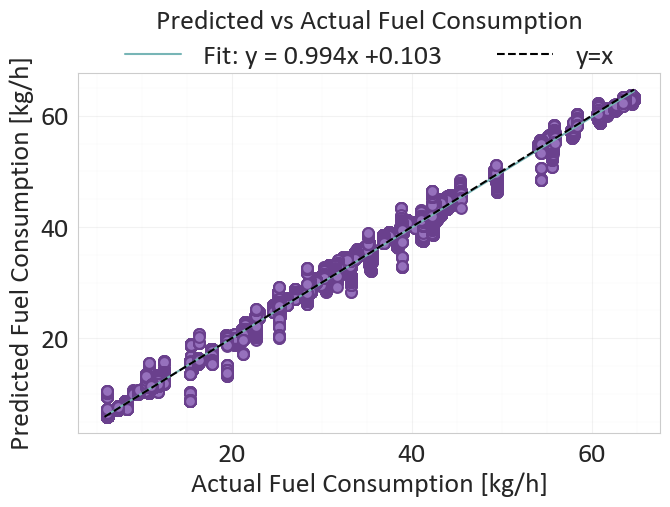

Real RMSE: 0.6835873412785527
R^2 Score: 0.9973857402801514
L_inf = 0.4309


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▅▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▄▄▇▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,0.43093


wandb: Agent Starting Run: dgo6w5g8 with config:
wandb: 	epochs: 200
wandb: 	lr: 0.01
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.01 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 0.9203, Val Loss = 0.8978
Epoch 10: Train Loss = 0.1120, Val Loss = 0.0610
Epoch 20: Train Loss = 0.0331, Val Loss = 0.0230
Epoch 30: Train Loss = 0.0126, Val Loss = 0.0109
Epoch 40: Train Loss = 0.0062, Val Loss = 0.0060
Epoch 50: Train Loss = 0.0044, Val Loss = 0.0051
Epoch 60: Train Loss = 0.0042, Val Loss = 0.0054
Epoch 70: Train Loss = 0.0036, Val Loss = 0.0041
Epoch 80: Train Loss = 0.0033, Val Loss = 0.0038
Epoch 90: Train Loss = 0.0031, Val Loss = 0.0037
Epoch 100: Train Loss = 0.0028, Val Loss = 0.0034
Epoch 110: Train Loss = 0.0026, Val Loss = 0.0031
Epoch 120: Trai

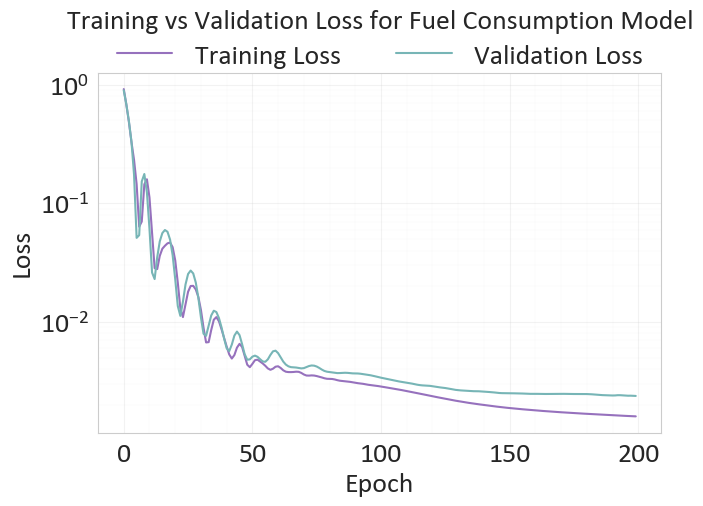

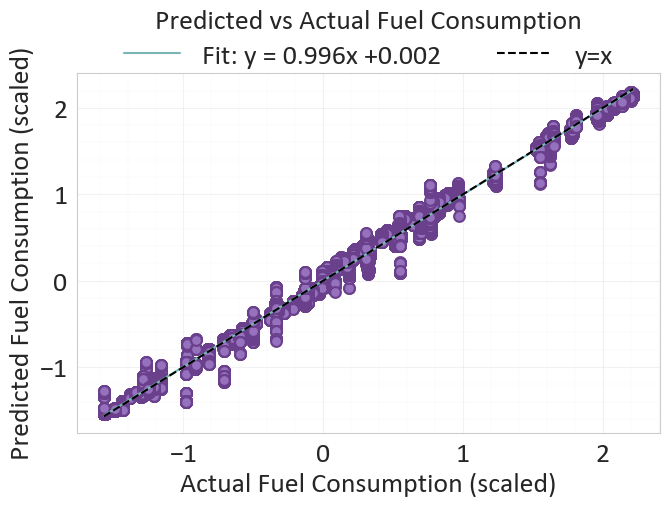

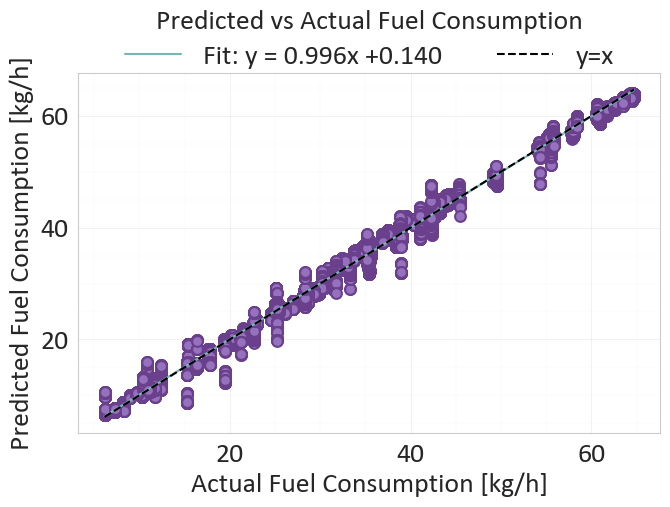

Real RMSE: 0.7714078841135119
R^2 Score: 0.9966709017753601
L_inf = 0.4642


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,0.46418


wandb: Agent Starting Run: 6g4dwucq with config:
wandb: 	epochs: 200
wandb: 	lr: 0.01
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.01 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.0284, Val Loss = 0.4844
Epoch 10: Train Loss = 0.0706, Val Loss = 0.0445
Epoch 20: Train Loss = 0.0155, Val Loss = 0.0227
Epoch 30: Train Loss = 0.0053, Val Loss = 0.0051
Epoch 40: Train Loss = 0.0055, Val Loss = 0.0087
Epoch 50: Train Loss = 0.0033, Val Loss = 0.0061
Epoch 60: Train Loss = 0.0028, Val Loss = 0.0042
Epoch 70: Train Loss = 0.0027, Val Loss = 0.0035
Epoch 80: Train Loss = 0.0025, Val Loss = 0.0032
Epoch 90: Train Loss = 0.0024, Val Loss = 0.0031
Epoch 100: Train Loss = 0.0023, Val Loss = 0.0029
Epoch 110: Train Loss = 0.0023, Val Loss = 0.0027
Epoch 120: Trai

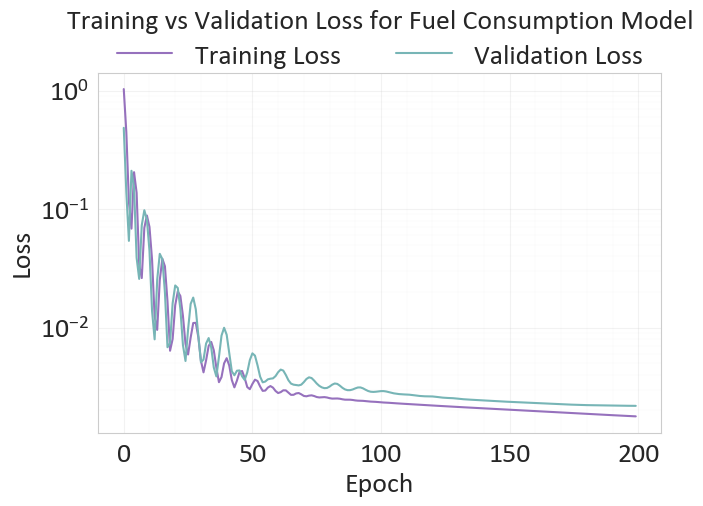

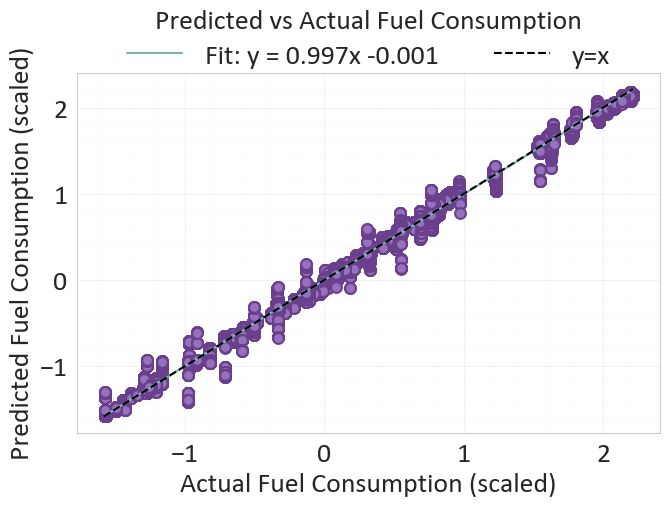

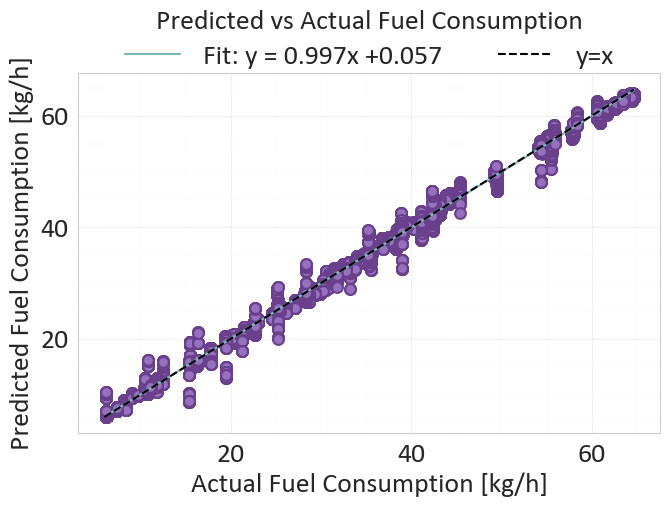

Real RMSE: 0.6642736435854132
R^2 Score: 0.9975313544273376
L_inf = 0.4363


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▂▄▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.43632


wandb: Agent Starting Run: 2k95oi61 with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.1097, Val Loss = 1.3921
Epoch 10: Train Loss = 0.7926, Val Loss = 1.0410
Epoch 20: Train Loss = 0.5486, Val Loss = 0.7625
Epoch 30: Train Loss = 0.3791, Val Loss = 0.5489
Epoch 40: Train Loss = 0.2709, Val Loss = 0.3925
Epoch 50: Train Loss = 0.1968, Val Loss = 0.2759
Epoch 60: Train Loss = 0.1382, Val Loss = 0.1842
Epoch 70: Train Loss = 0.0946, Val Loss = 0.1158
Epoch 80: Train Loss = 0.0658, Val Loss = 0.0712
Epoch 90: Train Loss = 0.0484, Val Loss = 0.0459
Epoch 100: Train Loss = 0.0381, Val Loss = 0.0333
Epoch 110: Train Loss = 0.0315, Val Loss = 0.0270
Epoch 120: Train L

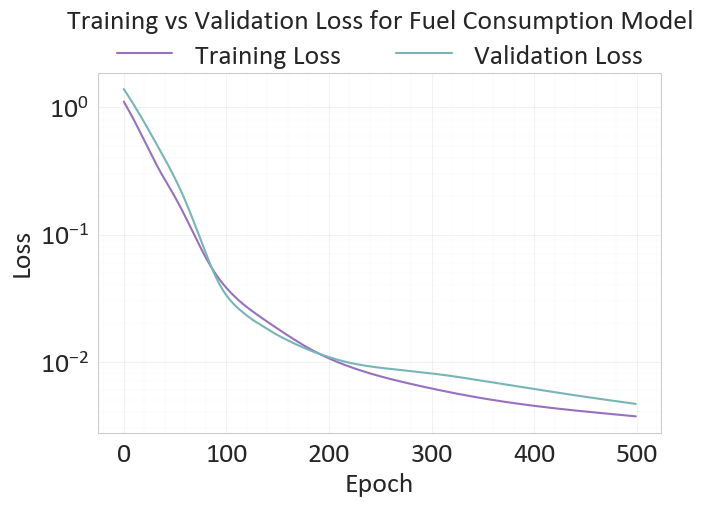

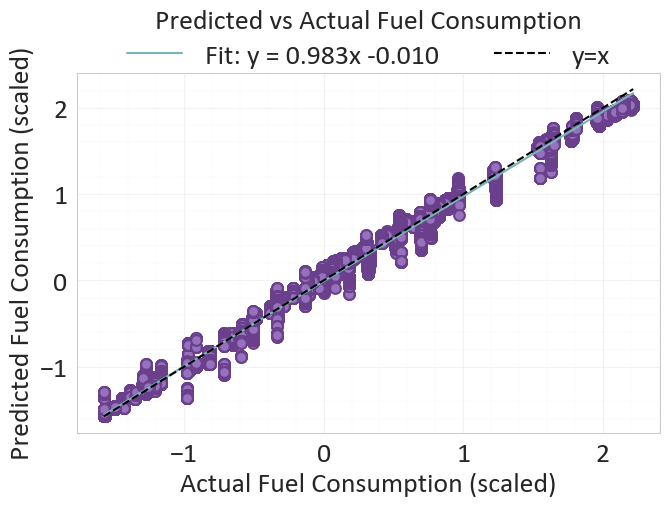

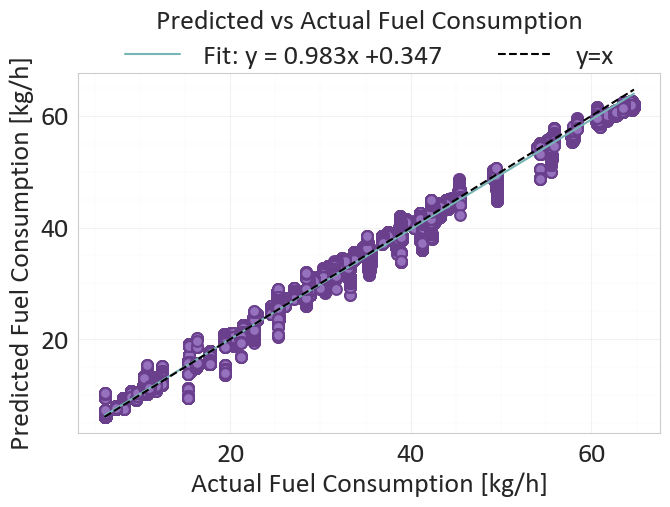

Real RMSE: 0.8221945471409039
R^2 Score: 0.9962180852890015
L_inf = 0.3848


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▅▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇██
epochs,▁
learning_rate,▁
L_inf,0.38485


wandb: Agent Starting Run: r7evmopo with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9203, Val Loss = 1.1335
Epoch 10: Train Loss = 0.6766, Val Loss = 0.8660
Epoch 20: Train Loss = 0.4610, Val Loss = 0.6318
Epoch 30: Train Loss = 0.2761, Val Loss = 0.3901
Epoch 40: Train Loss = 0.1275, Val Loss = 0.1650
Epoch 50: Train Loss = 0.0408, Val Loss = 0.0338
Epoch 60: Train Loss = 0.0335, Val Loss = 0.0267
Epoch 70: Train Loss = 0.0220, Val Loss = 0.0172
Epoch 80: Train Loss = 0.0161, Val Loss = 0.0145
Epoch 90: Train Loss = 0.0117, Val Loss = 0.0103
Epoch 100: Train Loss = 0.0083, Val Loss = 0.0069
Epoch 110: Train Loss = 0.0063, Val Loss = 0.0053
Epoch 120: Tra

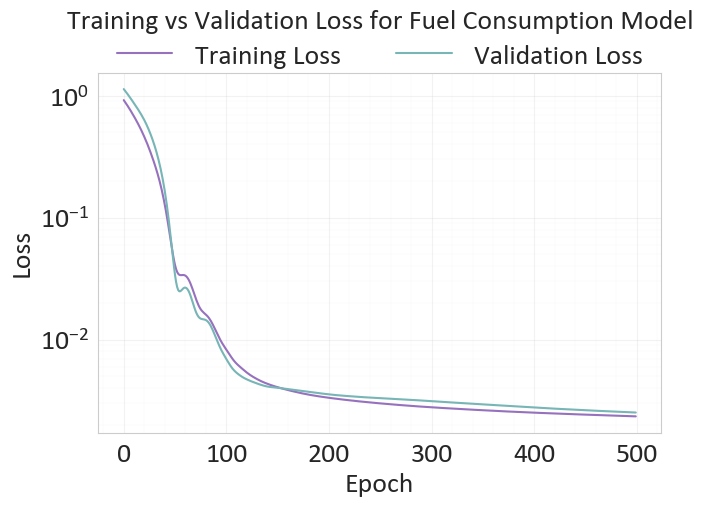

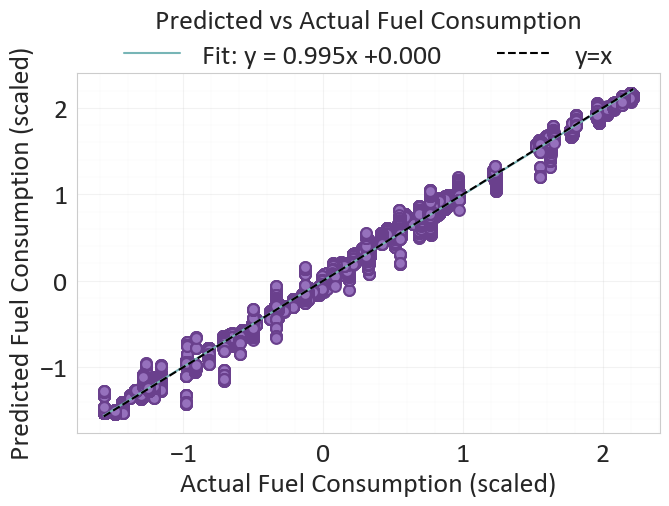

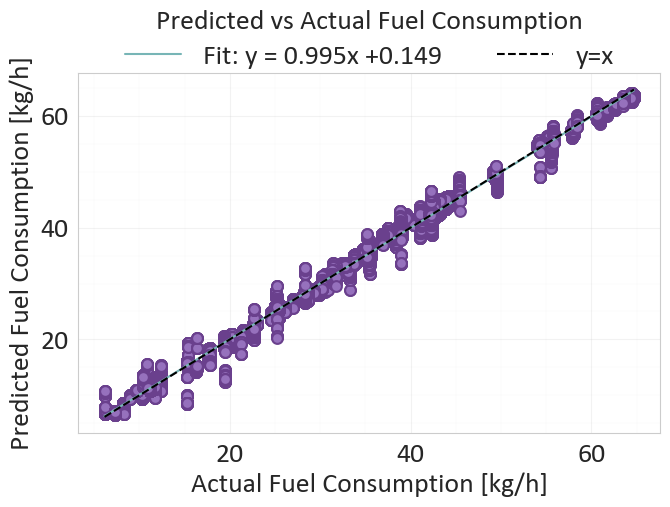

Real RMSE: 0.7267002262304627
R^2 Score: 0.9970455765724182
L_inf = 0.4553


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▅▅▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,0.45528


wandb: Agent Starting Run: minqzfby with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0284, Val Loss = 0.9610
Epoch 10: Train Loss = 0.4285, Val Loss = 0.4201
Epoch 20: Train Loss = 0.0784, Val Loss = 0.0683
Epoch 30: Train Loss = 0.0442, Val Loss = 0.0456
Epoch 40: Train Loss = 0.0193, Val Loss = 0.0146
Epoch 50: Train Loss = 0.0148, Val Loss = 0.0146
Epoch 60: Train Loss = 0.0075, Val Loss = 0.0064
Epoch 70: Train Loss = 0.0058, Val Loss = 0.0046
Epoch 80: Train Loss = 0.0049, Val Loss = 0.0043
Epoch 90: Train Loss = 0.0042, Val Loss = 0.0036
Epoch 100: Train Loss = 0.0039, Val Loss = 0.0034
Epoch 110: Train Loss = 0.0036, Val Loss = 0.0033
Epoch 120: Tra

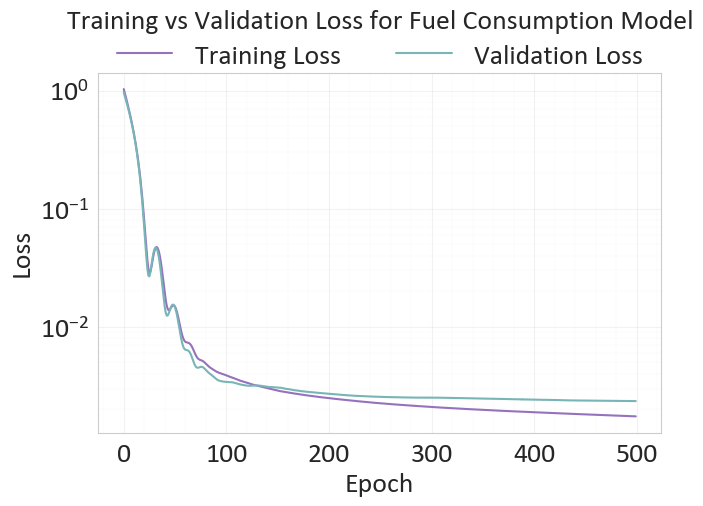

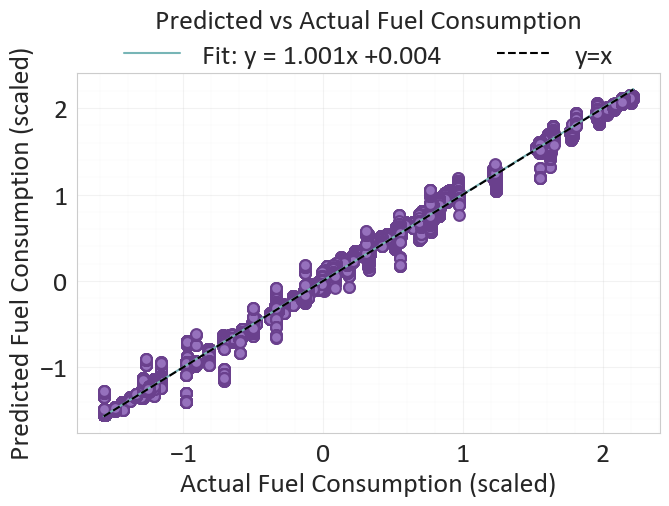

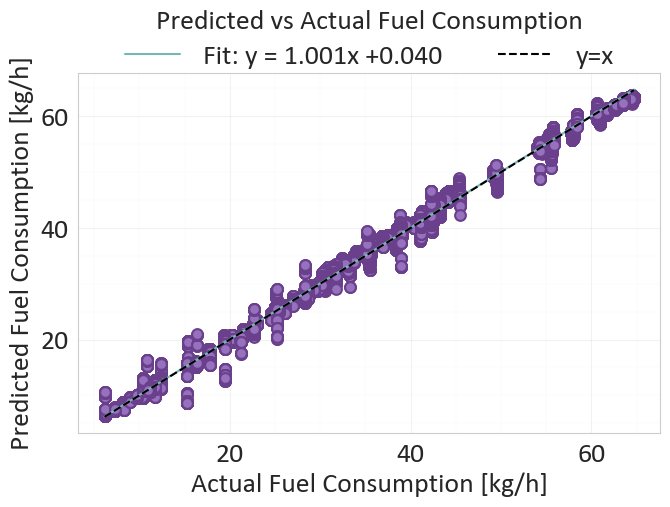

Real RMSE: 0.7633795605603366
R^2 Score: 0.9967398047447205
L_inf = 0.4473


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,0.44732


wandb: Agent Starting Run: 4d7cm5cz with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.1097, Val Loss = 1.0711
Epoch 10: Train Loss = 0.0722, Val Loss = 0.0496
Epoch 20: Train Loss = 0.0281, Val Loss = 0.0237
Epoch 30: Train Loss = 0.0196, Val Loss = 0.0132
Epoch 40: Train Loss = 0.0109, Val Loss = 0.0125
Epoch 50: Train Loss = 0.0065, Val Loss = 0.0113
Epoch 60: Train Loss = 0.0050, Val Loss = 0.0082
Epoch 70: Train Loss = 0.0043, Val Loss = 0.0082
Epoch 80: Train Loss = 0.0039, Val Loss = 0.0057
Epoch 90: Train Loss = 0.0036, Val Loss = 0.0054
Epoch 100: Train Loss = 0.0034, Val Loss = 0.0047
Epoch 110: Train Loss = 0.0033, Val Loss = 0.0044
Epoch 120: Train Lo

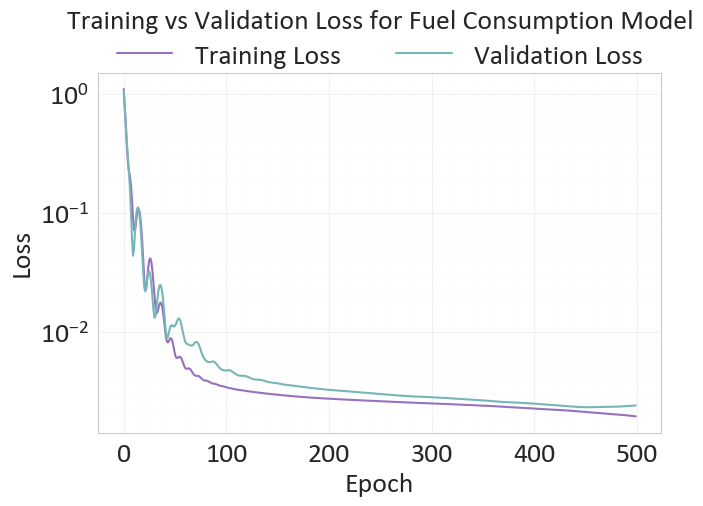

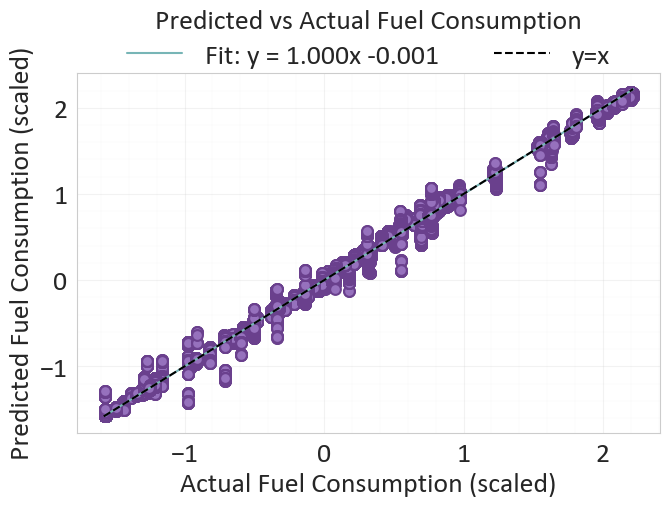

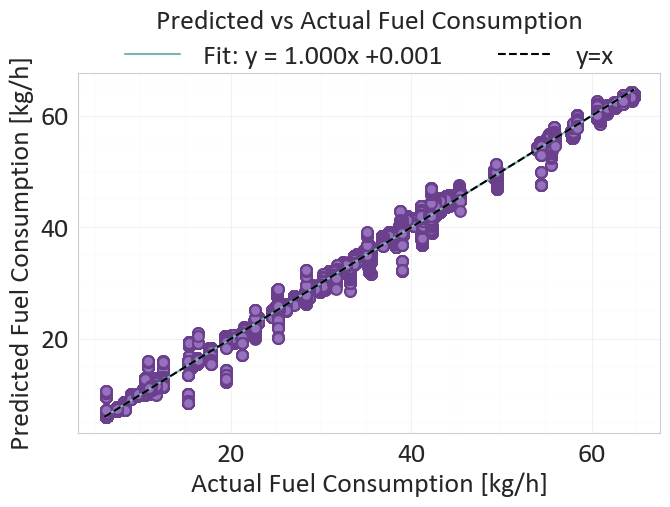

Real RMSE: 0.6807396954804776
R^2 Score: 0.9974074959754944
L_inf = 0.4603


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▃▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.46033


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 2ebhfpbr with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9203, Val Loss = 0.8978
Epoch 10: Train Loss = 0.1120, Val Loss = 0.0610
Epoch 20: Train Loss = 0.0331, Val Loss = 0.0230
Epoch 30: Train Loss = 0.0126, Val Loss = 0.0109
Epoch 40: Train Loss = 0.0062, Val Loss = 0.0060
Epoch 50: Train Loss = 0.0044, Val Loss = 0.0051
Epoch 60: Train Loss = 0.0042, Val Loss = 0.0054
Epoch 70: Train Loss = 0.0036, Val Loss = 0.0041
Epoch 80: Train Loss = 0.0033, Val Loss = 0.0038
Epoch 90: Train Loss = 0.0031, Val Loss = 0.0037
Epoch 100: Train Loss = 0.0028, Val Loss = 0.0034
Epoch 110: Train Loss = 0.0026, Val Loss = 0.0031
Epoch 120: Trai

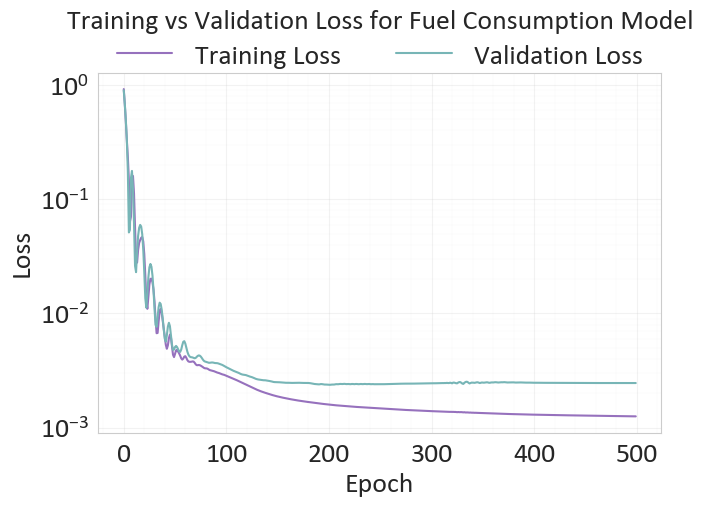

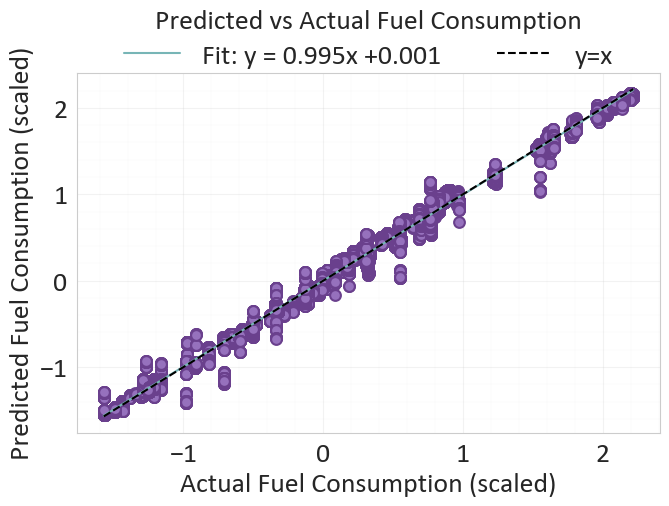

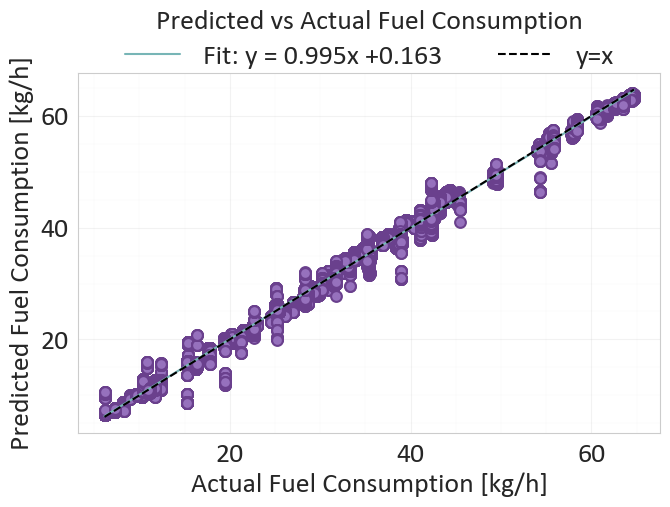

Real RMSE: 0.8329458806224621
R^2 Score: 0.9961185455322266
L_inf = 0.5215


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,▆██▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,0.5215


wandb: Agent Starting Run: gd3ld0et with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0284, Val Loss = 0.4844
Epoch 10: Train Loss = 0.0706, Val Loss = 0.0445
Epoch 20: Train Loss = 0.0155, Val Loss = 0.0227
Epoch 30: Train Loss = 0.0053, Val Loss = 0.0051
Epoch 40: Train Loss = 0.0055, Val Loss = 0.0087
Epoch 50: Train Loss = 0.0033, Val Loss = 0.0061
Epoch 60: Train Loss = 0.0028, Val Loss = 0.0042
Epoch 70: Train Loss = 0.0027, Val Loss = 0.0035
Epoch 80: Train Loss = 0.0025, Val Loss = 0.0032
Epoch 90: Train Loss = 0.0024, Val Loss = 0.0031
Epoch 100: Train Loss = 0.0023, Val Loss = 0.0029
Epoch 110: Train Loss = 0.0023, Val Loss = 0.0027
Epoch 120: Trai

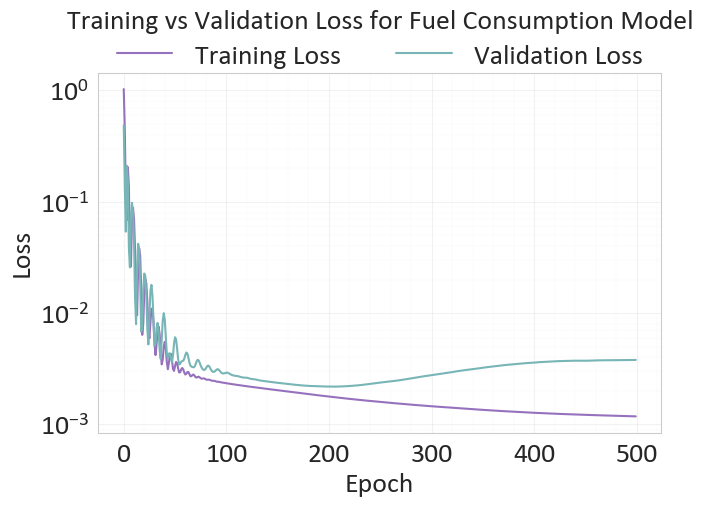

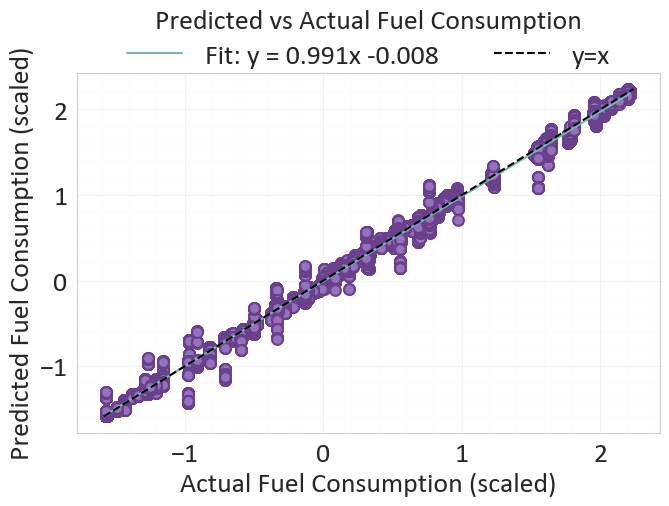

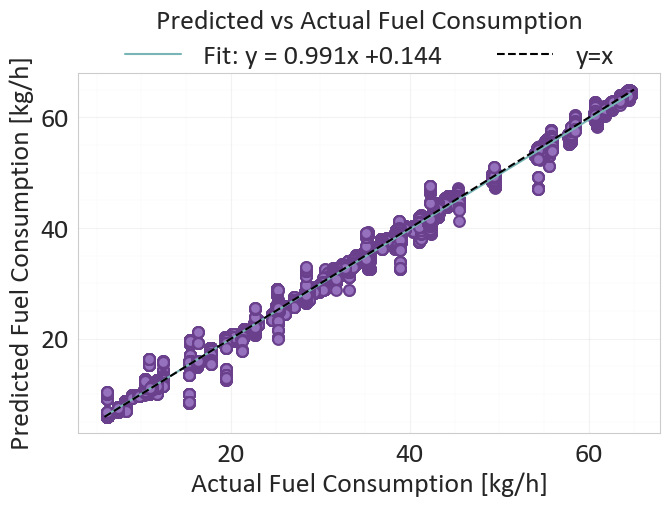

Real RMSE: 0.666645077018039
R^2 Score: 0.9975137114524841
L_inf = 0.4705


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,▃█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇████
epochs,▁
learning_rate,▁
L_inf,0.47052


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [33]:
# Run the complex model for Fuel Consumption
X = X_engineered
feature_set_name = "Engineered_Complex"
sweep_id = wandb.sweep(sweep_config_complex, project="FOC_nn")
wandb.agent(sweep_id, lambda: train_Fuel_Consumption("Complex Fuel Consumption"))

Create sweep with ID: 8po3m4u4
Sweep URL: https://wandb.ai/sakkis-national-technical-university-of-athens/NOx_nn/sweeps/8po3m4u4


wandb: Agent Starting Run: 7mp71sts with config:
wandb: 	epochs: 200
wandb: 	lr: 0.001
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.001 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.0186, Val Loss = 0.5815
Epoch 10: Train Loss = 0.7716, Val Loss = 0.3773
Epoch 20: Train Loss = 0.5875, Val Loss = 0.2354
Epoch 30: Train Loss = 0.4634, Val Loss = 0.1574
Epoch 40: Train Loss = 0.3846, Val Loss = 0.1289
Epoch 50: Train Loss = 0.3342, Val Loss = 0.1255
Epoch 60: Train Loss = 0.2976, Val Loss = 0.1260
Epoch 70: Train Loss = 0.2672, Val Loss = 0.1228
Epoch 80: Train Loss = 0.2415, Val Loss = 0.1171
Epoch 90: Train Loss = 0.2193, Val Loss = 0.1113
Epoch 100: Train Loss = 0.2002, Val Loss = 0.1062
Epoch 110: Train Loss = 0.1842, Val Loss = 0.1012
Epoch 120: Train Loss = 0.1712,

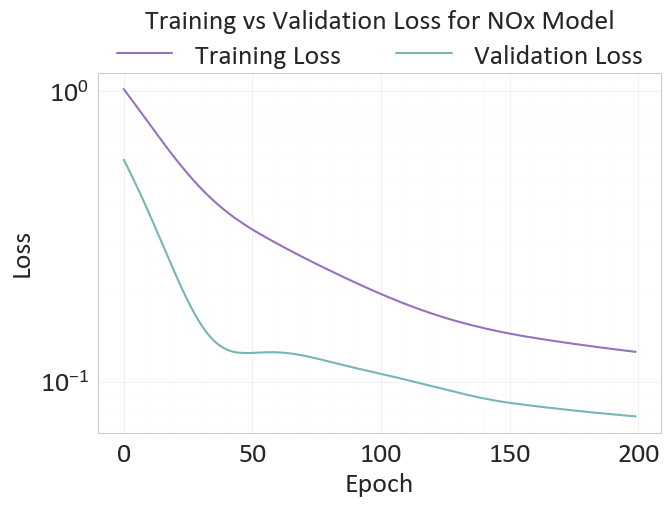

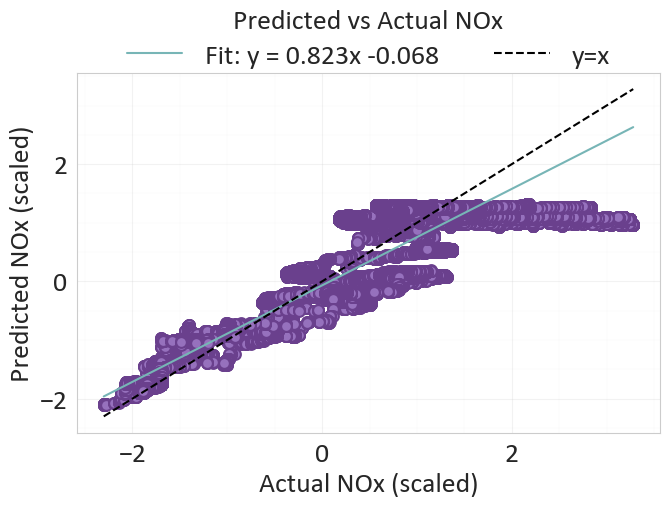

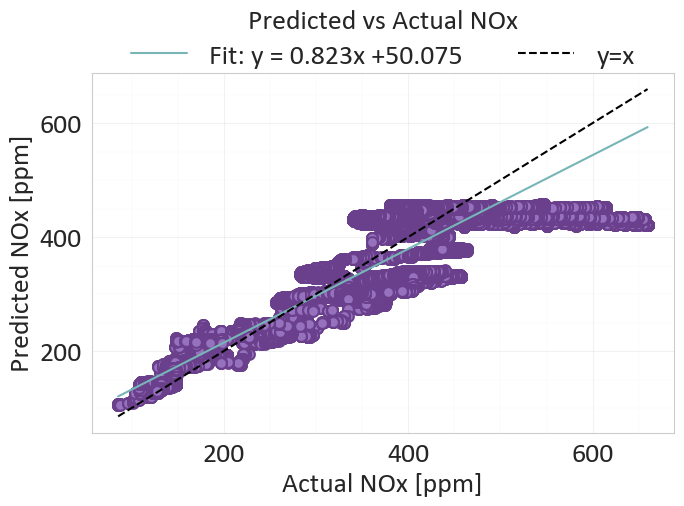

Real RMSE: 44.5160130182282
R^2 Score: 0.8200737237930298
L_inf = 2.3181


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▆▆▆▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▆▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇██
epochs,▁
learning_rate,▁
L_inf,2.3181


wandb: Agent Starting Run: ntp1g2k2 with config:
wandb: 	epochs: 200
wandb: 	lr: 0.001
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.001 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 0.9583, Val Loss = 0.4690
Epoch 10: Train Loss = 0.7788, Val Loss = 0.3442
Epoch 20: Train Loss = 0.6227, Val Loss = 0.2514
Epoch 30: Train Loss = 0.4886, Val Loss = 0.2056
Epoch 40: Train Loss = 0.3823, Val Loss = 0.1951
Epoch 50: Train Loss = 0.2962, Val Loss = 0.1744
Epoch 60: Train Loss = 0.2297, Val Loss = 0.1475
Epoch 70: Train Loss = 0.1899, Val Loss = 0.1324
Epoch 80: Train Loss = 0.1648, Val Loss = 0.1184
Epoch 90: Train Loss = 0.1459, Val Loss = 0.1049
Epoch 100: Train Loss = 0.1317, Val Loss = 0.0982
Epoch 110: Train Loss = 0.1208, Val Loss = 0.0941
Epoch 120: Train Loss = 0.1

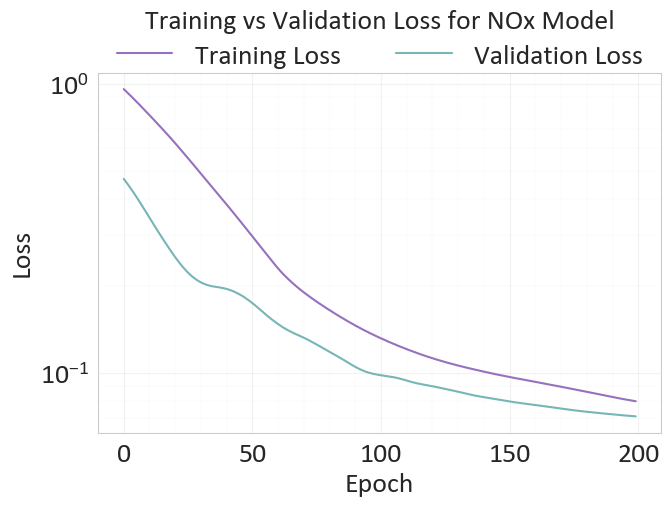

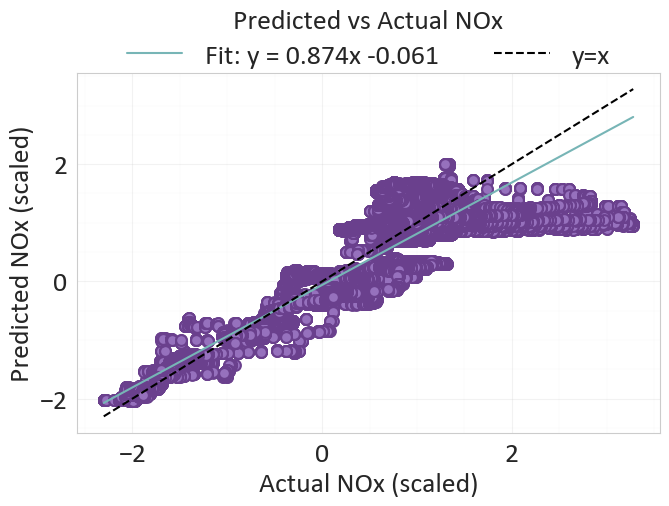

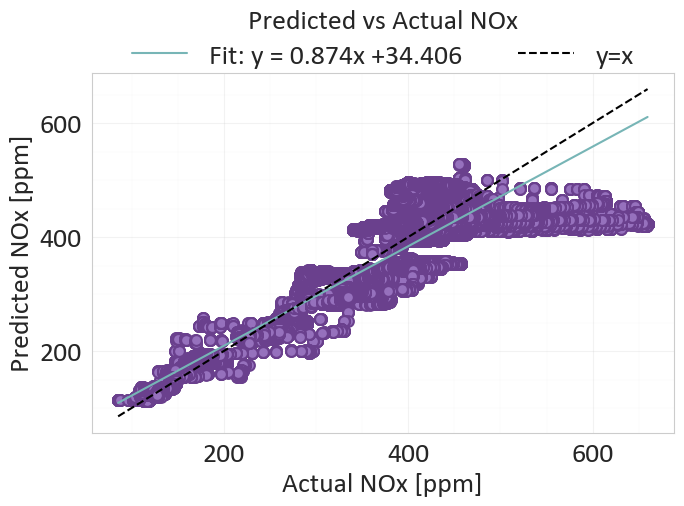

Real RMSE: 39.88472158139003
R^2 Score: 0.8555639982223511
L_inf = 2.3352


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,███▇▆▅▅▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▇▆▆▅▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇████
epochs,▁
learning_rate,▁
L_inf,2.33516


wandb: Agent Starting Run: wxmg03od with config:
wandb: 	epochs: 200
wandb: 	lr: 0.001
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.001 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.0669, Val Loss = 0.5707
Epoch 10: Train Loss = 0.6141, Val Loss = 0.2715
Epoch 20: Train Loss = 0.3737, Val Loss = 0.1681
Epoch 30: Train Loss = 0.2493, Val Loss = 0.1711
Epoch 40: Train Loss = 0.1813, Val Loss = 0.1383
Epoch 50: Train Loss = 0.1481, Val Loss = 0.1144
Epoch 60: Train Loss = 0.1283, Val Loss = 0.0858
Epoch 70: Train Loss = 0.1144, Val Loss = 0.0808
Epoch 80: Train Loss = 0.1034, Val Loss = 0.0795
Epoch 90: Train Loss = 0.0951, Val Loss = 0.0710
Epoch 100: Train Loss = 0.0888, Val Loss = 0.0670
Epoch 110: Train Loss = 0.0836, Val Loss = 0.0647
Epoch 120: Train Loss = 0.0

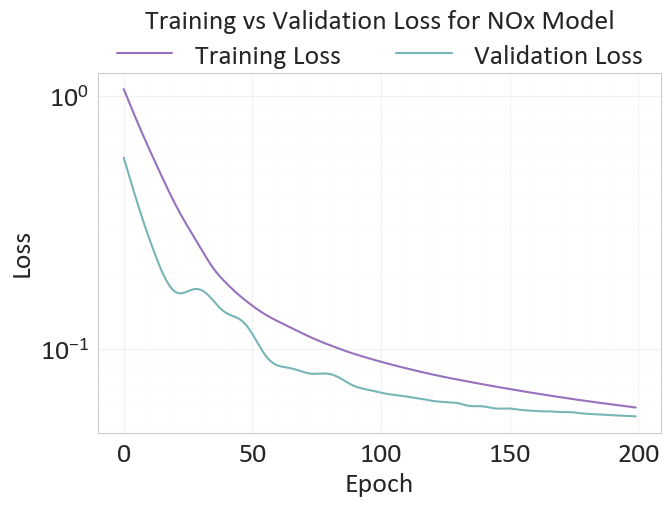

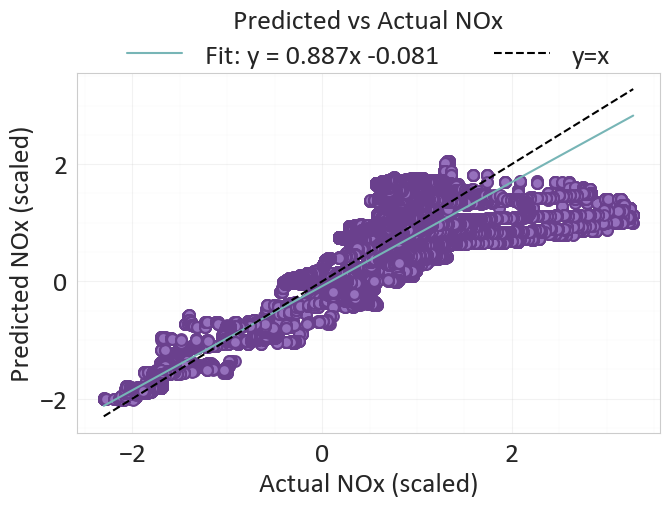

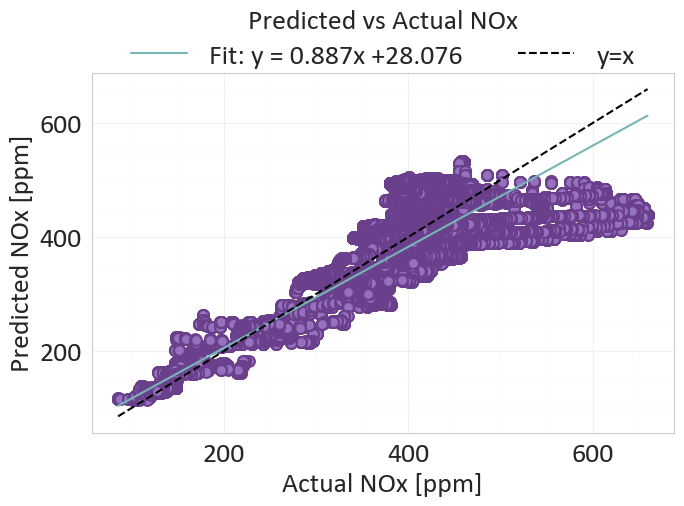

Real RMSE: 40.18300421975689
R^2 Score: 0.8533955812454224
L_inf = 2.2756


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▆▆▅▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▆▅▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██
epochs,▁
learning_rate,▁
L_inf,2.27559


wandb: Agent Starting Run: 9hye5vu0 with config:
wandb: 	epochs: 200
wandb: 	lr: 0.01
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.01 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.0186, Val Loss = 0.3945
Epoch 10: Train Loss = 0.2706, Val Loss = 0.1895
Epoch 20: Train Loss = 0.1656, Val Loss = 0.1349
Epoch 30: Train Loss = 0.1385, Val Loss = 0.0674
Epoch 40: Train Loss = 0.1239, Val Loss = 0.0803
Epoch 50: Train Loss = 0.1091, Val Loss = 0.0744
Epoch 60: Train Loss = 0.0992, Val Loss = 0.0622
Epoch 70: Train Loss = 0.0918, Val Loss = 0.0662
Epoch 80: Train Loss = 0.0854, Val Loss = 0.0666
Epoch 90: Train Loss = 0.0796, Val Loss = 0.0648
Epoch 100: Train Loss = 0.0747, Val Loss = 0.0662
Epoch 110: Train Loss = 0.0701, Val Loss = 0.0640
Epoch 120: Train Loss = 0.0668, 

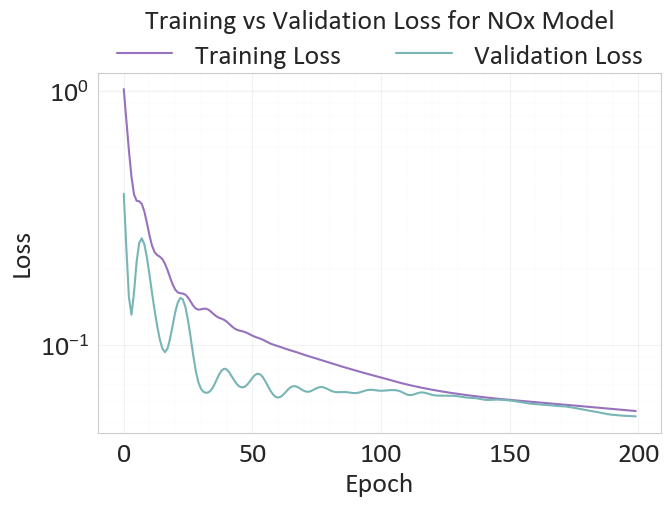

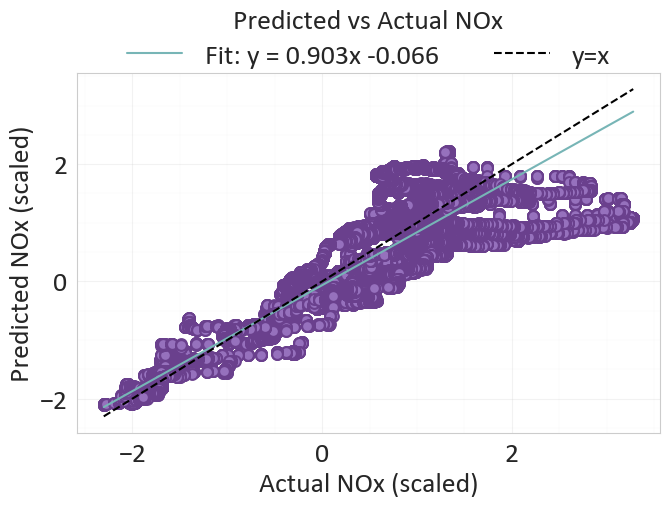

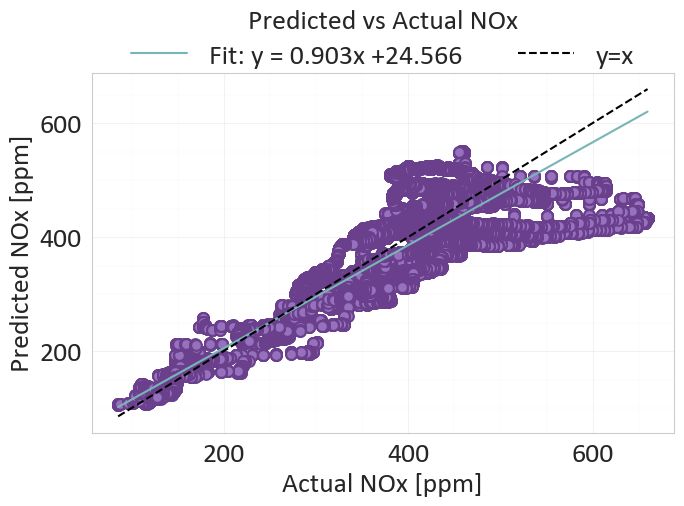

Real RMSE: 41.07479511750865
R^2 Score: 0.8468161225318909
L_inf = 2.2494


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▃▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,2.24936


wandb: Agent Starting Run: 3fur34la with config:
wandb: 	epochs: 200
wandb: 	lr: 0.01
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.01 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 0.9583, Val Loss = 0.3586
Epoch 10: Train Loss = 0.2326, Val Loss = 0.2058
Epoch 20: Train Loss = 0.1326, Val Loss = 0.0850
Epoch 30: Train Loss = 0.1022, Val Loss = 0.0892
Epoch 40: Train Loss = 0.0879, Val Loss = 0.0567
Epoch 50: Train Loss = 0.0760, Val Loss = 0.0529
Epoch 60: Train Loss = 0.0663, Val Loss = 0.0502
Epoch 70: Train Loss = 0.0587, Val Loss = 0.0423
Epoch 80: Train Loss = 0.0539, Val Loss = 0.0421
Epoch 90: Train Loss = 0.0503, Val Loss = 0.0402
Epoch 100: Train Loss = 0.0476, Val Loss = 0.0445
Epoch 110: Train Loss = 0.0455, Val Loss = 0.0395
Epoch 120: Train Loss = 0.04

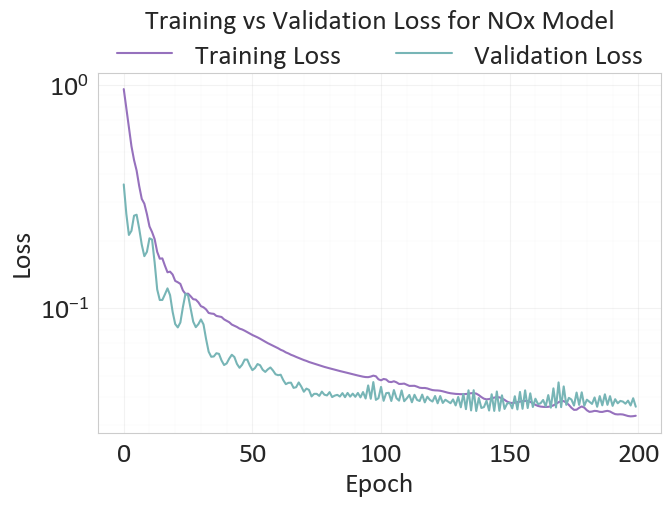

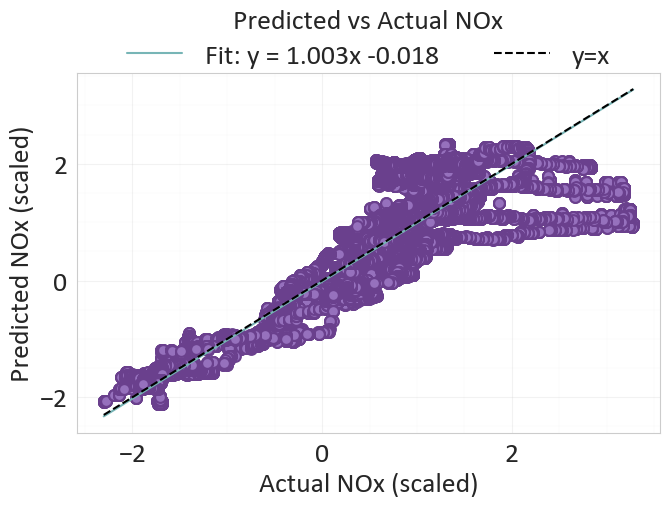

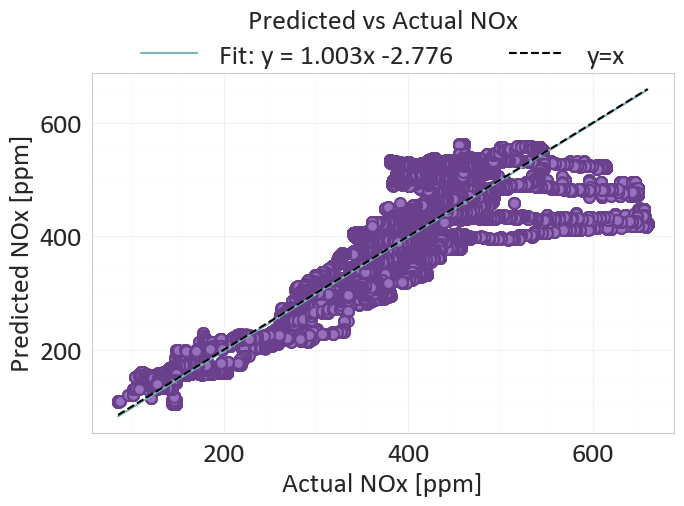

Real RMSE: 43.056246144215244
R^2 Score: 0.8316804766654968
L_inf = 2.3529


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▄▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.35294


wandb: Agent Starting Run: vuyvz4d3 with config:
wandb: 	epochs: 200
wandb: 	lr: 0.01
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.01 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.0669, Val Loss = 0.2943
Epoch 10: Train Loss = 0.1591, Val Loss = 0.0763
Epoch 20: Train Loss = 0.1079, Val Loss = 0.0764
Epoch 30: Train Loss = 0.0852, Val Loss = 0.0598
Epoch 40: Train Loss = 0.0716, Val Loss = 0.0531
Epoch 50: Train Loss = 0.0598, Val Loss = 0.0519
Epoch 60: Train Loss = 0.0514, Val Loss = 0.0480
Epoch 70: Train Loss = 0.0453, Val Loss = 0.0476
Epoch 80: Train Loss = 0.0405, Val Loss = 0.0485
Epoch 90: Train Loss = 0.0376, Val Loss = 0.0456
Epoch 100: Train Loss = 0.0352, Val Loss = 0.0461
Epoch 110: Train Loss = 0.0331, Val Loss = 0.0425
Epoch 120: Train Loss = 0.03

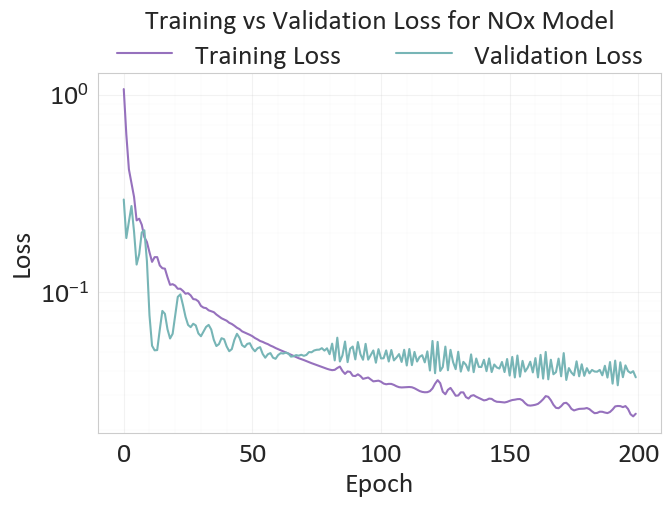

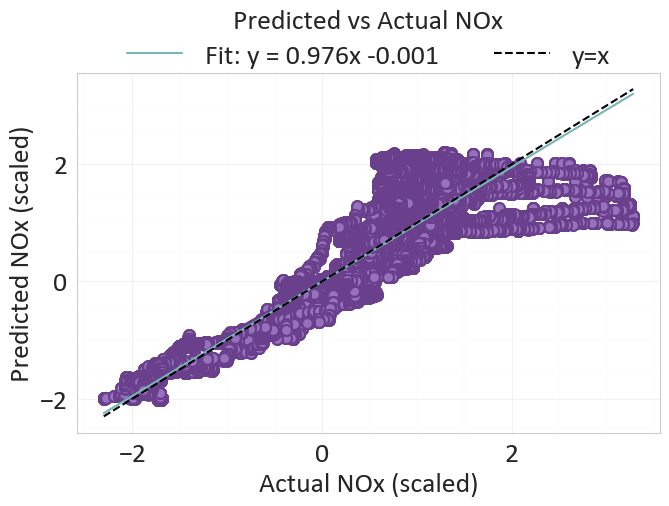

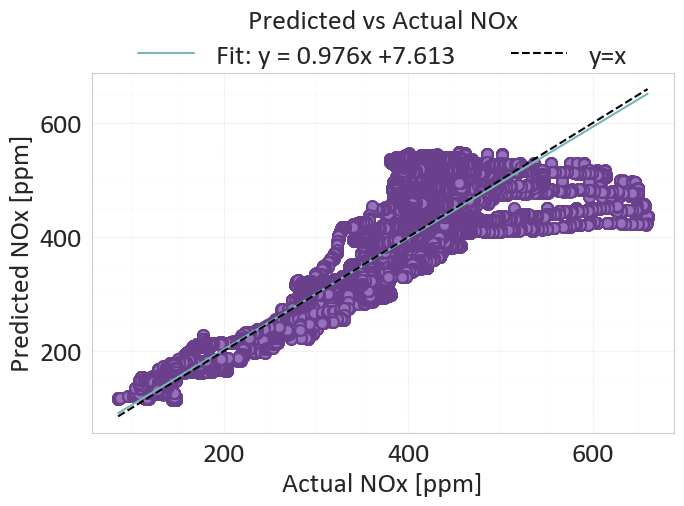

Real RMSE: 41.44563427655484
R^2 Score: 0.844037652015686
L_inf = 2.2983


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▅▇▂▂▃▂▂▂▂▂▂▁▁▁▁▂▂▂▂▂▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.29829


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 0natvidy with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0186, Val Loss = 0.5815
Epoch 10: Train Loss = 0.7716, Val Loss = 0.3773
Epoch 20: Train Loss = 0.5875, Val Loss = 0.2354
Epoch 30: Train Loss = 0.4634, Val Loss = 0.1574
Epoch 40: Train Loss = 0.3846, Val Loss = 0.1289
Epoch 50: Train Loss = 0.3342, Val Loss = 0.1255
Epoch 60: Train Loss = 0.2976, Val Loss = 0.1260
Epoch 70: Train Loss = 0.2672, Val Loss = 0.1228
Epoch 80: Train Loss = 0.2415, Val Loss = 0.1171
Epoch 90: Train Loss = 0.2193, Val Loss = 0.1113
Epoch 100: Train Loss = 0.2002, Val Loss = 0.1062
Epoch 110: Train Loss = 0.1842, Val Loss = 0.1012
Epoch 120: Train Loss = 0.1712,

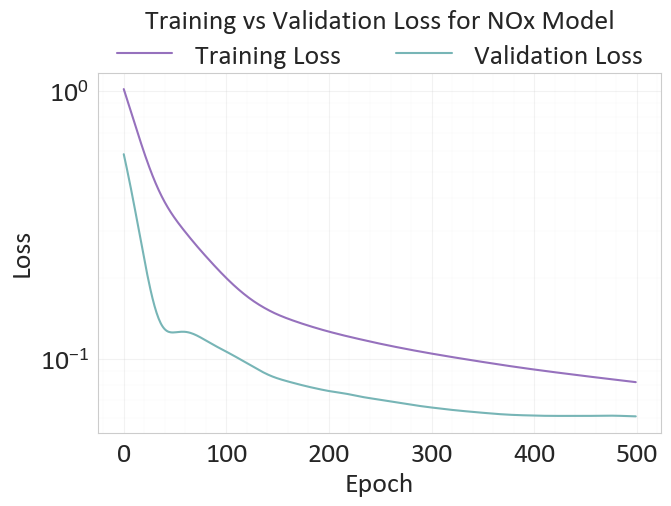

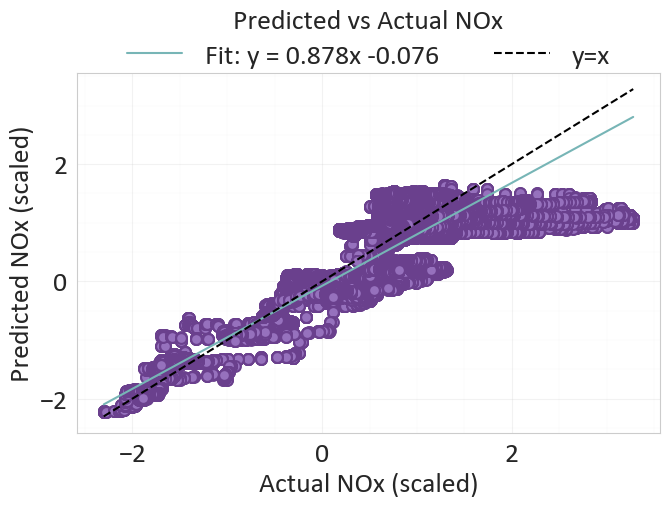

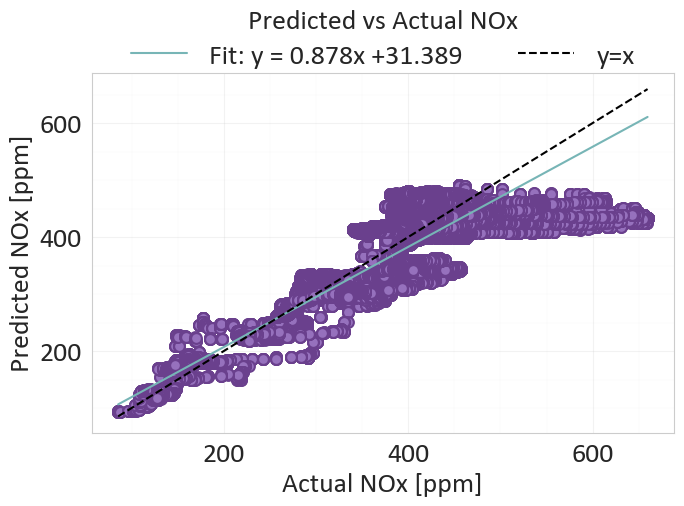

Real RMSE: 39.767423829648244
R^2 Score: 0.8564122915267944
L_inf = 2.2868


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▆▅▅▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇████
epochs,▁
learning_rate,▁
L_inf,2.28684


wandb: Agent Starting Run: rx8l3tfz with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9583, Val Loss = 0.4690
Epoch 10: Train Loss = 0.7788, Val Loss = 0.3442
Epoch 20: Train Loss = 0.6227, Val Loss = 0.2514
Epoch 30: Train Loss = 0.4886, Val Loss = 0.2056
Epoch 40: Train Loss = 0.3823, Val Loss = 0.1951
Epoch 50: Train Loss = 0.2962, Val Loss = 0.1744
Epoch 60: Train Loss = 0.2297, Val Loss = 0.1475
Epoch 70: Train Loss = 0.1899, Val Loss = 0.1324
Epoch 80: Train Loss = 0.1648, Val Loss = 0.1184
Epoch 90: Train Loss = 0.1459, Val Loss = 0.1049
Epoch 100: Train Loss = 0.1317, Val Loss = 0.0982
Epoch 110: Train Loss = 0.1208, Val Loss = 0.0941
Epoch 120: Train Loss = 0.1

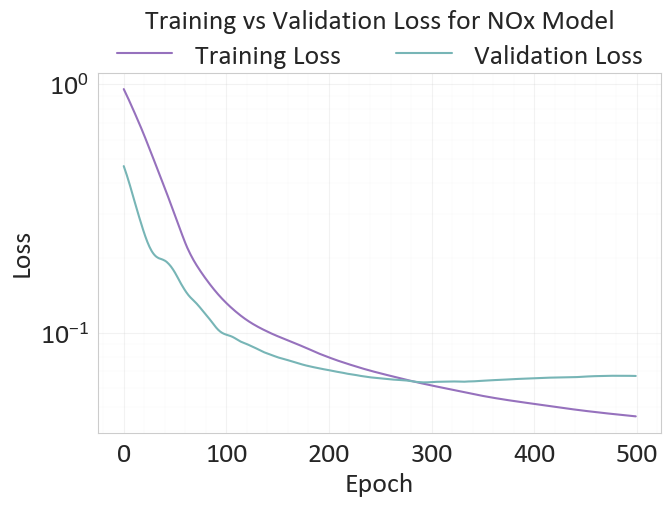

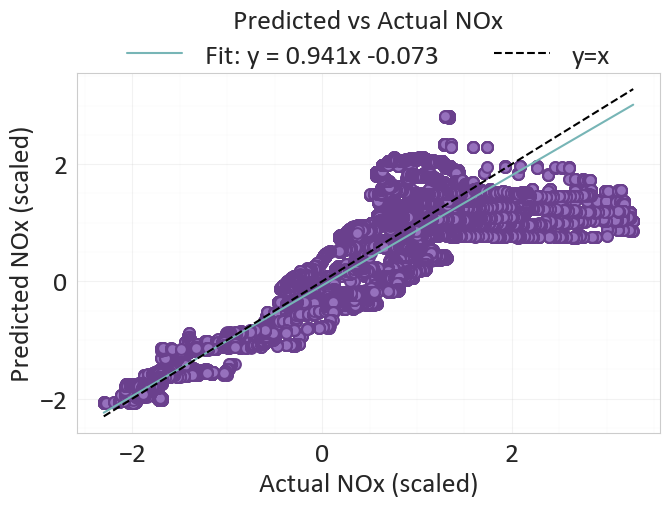

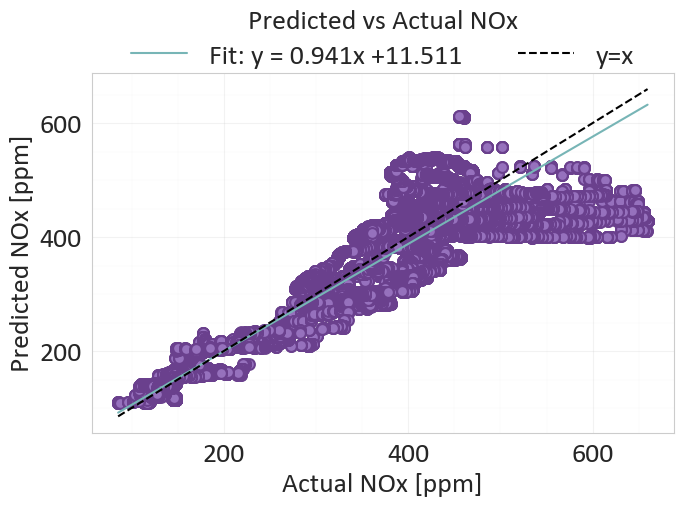

Real RMSE: 42.43518149962658
R^2 Score: 0.8365012407302856
L_inf = 2.4139


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▅▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▆▆▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,2.41386


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: r7h8lj8f with config:
wandb: 	epochs: 500
wandb: 	lr: 0.001
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0669, Val Loss = 0.5707
Epoch 10: Train Loss = 0.6141, Val Loss = 0.2715
Epoch 20: Train Loss = 0.3737, Val Loss = 0.1681
Epoch 30: Train Loss = 0.2493, Val Loss = 0.1711
Epoch 40: Train Loss = 0.1813, Val Loss = 0.1383
Epoch 50: Train Loss = 0.1481, Val Loss = 0.1144
Epoch 60: Train Loss = 0.1283, Val Loss = 0.0858
Epoch 70: Train Loss = 0.1144, Val Loss = 0.0808
Epoch 80: Train Loss = 0.1034, Val Loss = 0.0795
Epoch 90: Train Loss = 0.0951, Val Loss = 0.0710
Epoch 100: Train Loss = 0.0888, Val Loss = 0.0670
Epoch 110: Train Loss = 0.0836, Val Loss = 0.0647
Epoch 120: Train Loss = 0.0

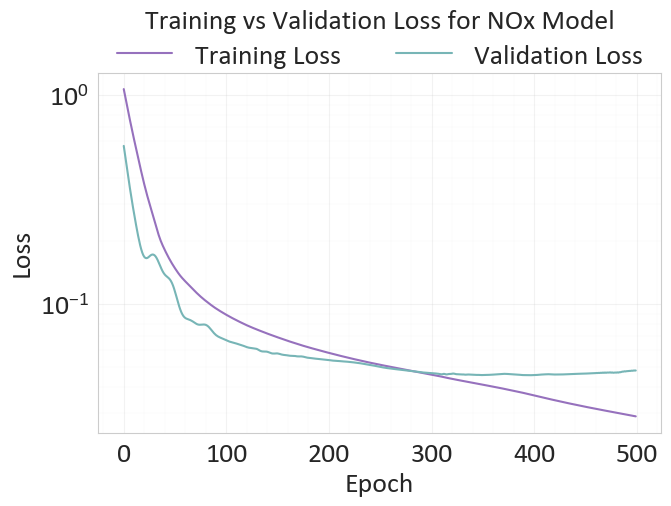

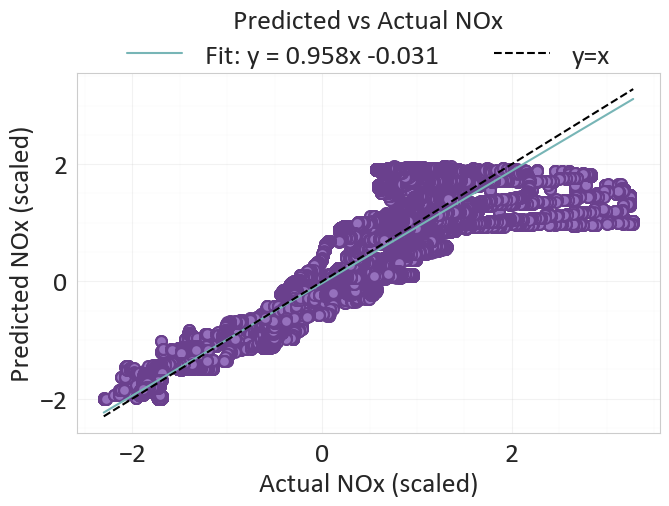

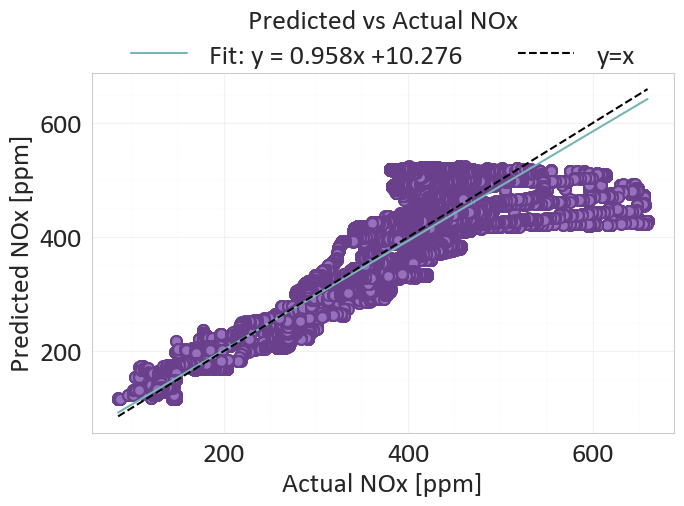

Real RMSE: 39.002223807291585
R^2 Score: 0.8618849515914917
L_inf = 2.2940


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.29403


wandb: Agent Starting Run: xj5n30ek with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0186, Val Loss = 0.3945
Epoch 10: Train Loss = 0.2706, Val Loss = 0.1895
Epoch 20: Train Loss = 0.1656, Val Loss = 0.1349
Epoch 30: Train Loss = 0.1385, Val Loss = 0.0674
Epoch 40: Train Loss = 0.1239, Val Loss = 0.0803
Epoch 50: Train Loss = 0.1091, Val Loss = 0.0744
Epoch 60: Train Loss = 0.0992, Val Loss = 0.0622
Epoch 70: Train Loss = 0.0918, Val Loss = 0.0662
Epoch 80: Train Loss = 0.0854, Val Loss = 0.0666
Epoch 90: Train Loss = 0.0796, Val Loss = 0.0648
Epoch 100: Train Loss = 0.0747, Val Loss = 0.0662
Epoch 110: Train Loss = 0.0701, Val Loss = 0.0640
Epoch 120: Train Loss = 0.0668, 

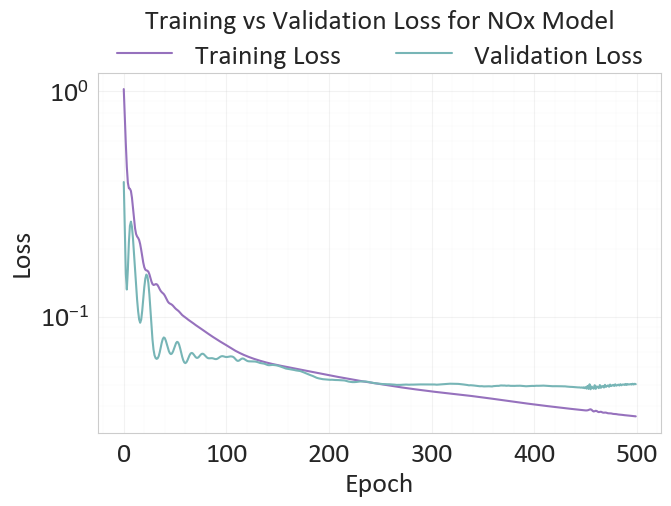

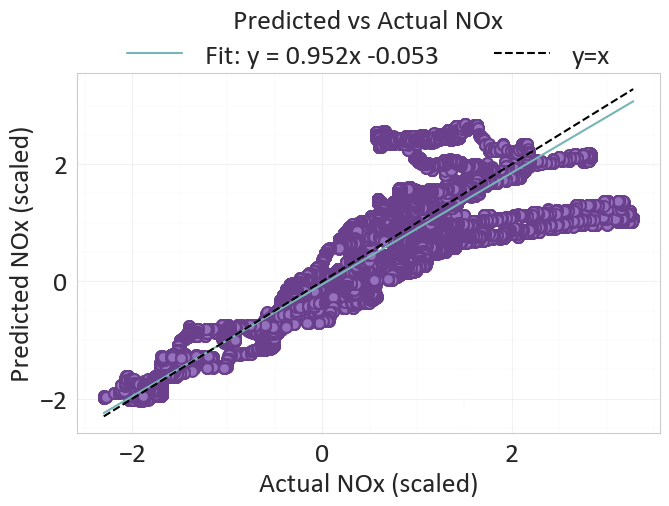

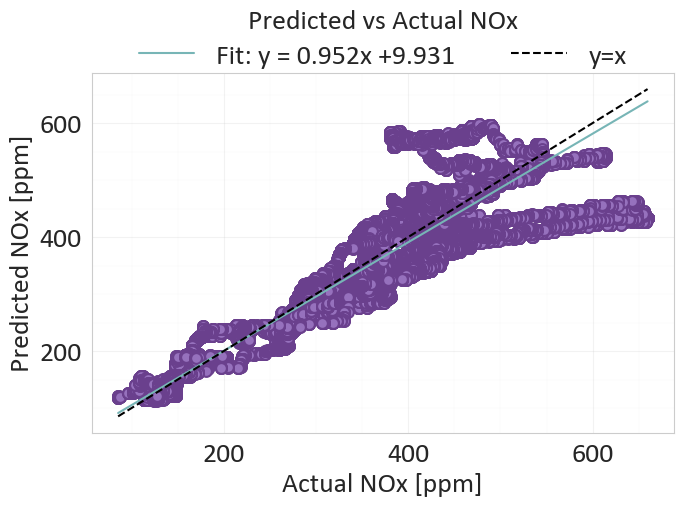

Real RMSE: 44.80434489297955
R^2 Score: 0.8177353143692017
L_inf = 2.2511


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,██▆█▂▂▂▂▂▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,2.25111


wandb: Agent Starting Run: hb38wl0t with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [32, 32]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [32, 32] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 0.9583, Val Loss = 0.3586
Epoch 10: Train Loss = 0.2326, Val Loss = 0.2058
Epoch 20: Train Loss = 0.1326, Val Loss = 0.0850
Epoch 30: Train Loss = 0.1022, Val Loss = 0.0892
Epoch 40: Train Loss = 0.0879, Val Loss = 0.0567
Epoch 50: Train Loss = 0.0760, Val Loss = 0.0529
Epoch 60: Train Loss = 0.0663, Val Loss = 0.0502
Epoch 70: Train Loss = 0.0587, Val Loss = 0.0423
Epoch 80: Train Loss = 0.0539, Val Loss = 0.0421
Epoch 90: Train Loss = 0.0503, Val Loss = 0.0402
Epoch 100: Train Loss = 0.0476, Val Loss = 0.0445
Epoch 110: Train Loss = 0.0455, Val Loss = 0.0395
Epoch 120: Train Loss = 0.04

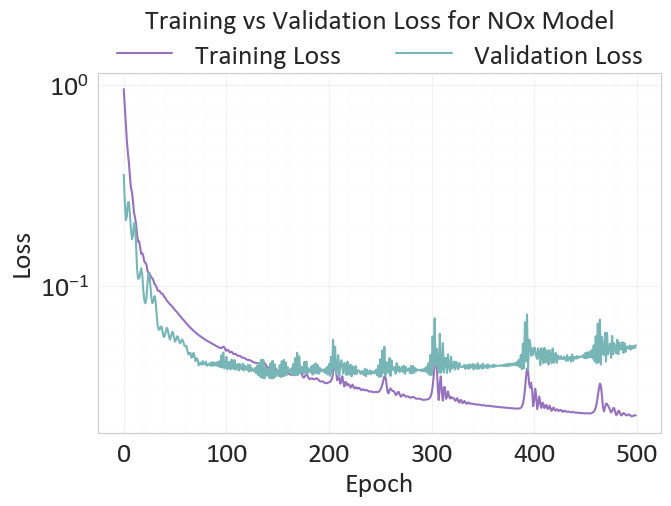

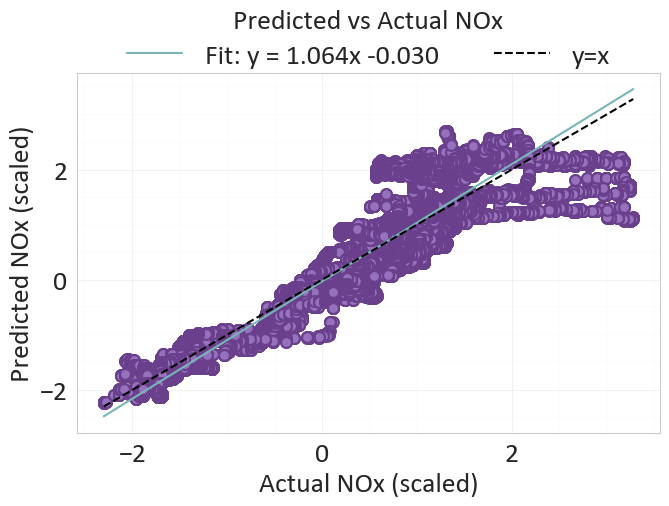

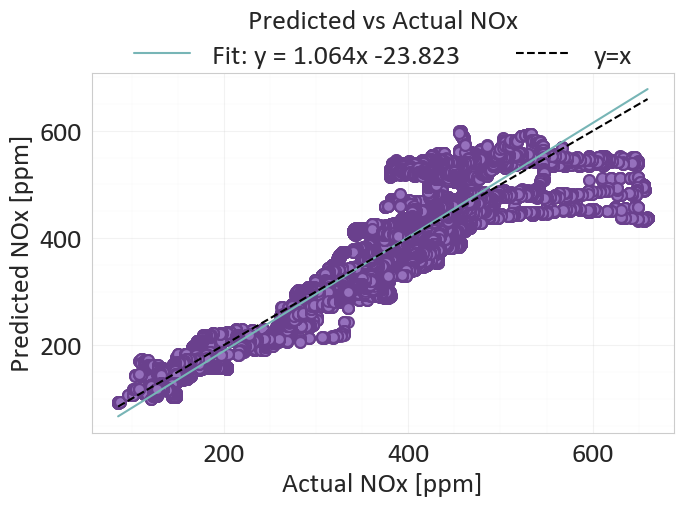

Real RMSE: 45.94246359238368
R^2 Score: 0.8083579540252686
L_inf = 2.1832


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▆▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁
Validation_Loss,█▄▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▁▁▂▁▂▂
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇█
epochs,▁
learning_rate,▁
L_inf,2.18324


wandb: Agent Starting Run: 8z8dea8b with config:
wandb: 	epochs: 500
wandb: 	lr: 0.01
wandb: 	neurons: [64, 64]
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from C:\Users\Georgia\_netrc.



 #################### Complex NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.01 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0669, Val Loss = 0.2943
Epoch 10: Train Loss = 0.1591, Val Loss = 0.0763
Epoch 20: Train Loss = 0.1079, Val Loss = 0.0764
Epoch 30: Train Loss = 0.0852, Val Loss = 0.0598
Epoch 40: Train Loss = 0.0716, Val Loss = 0.0531
Epoch 50: Train Loss = 0.0598, Val Loss = 0.0519
Epoch 60: Train Loss = 0.0514, Val Loss = 0.0480
Epoch 70: Train Loss = 0.0453, Val Loss = 0.0476
Epoch 80: Train Loss = 0.0405, Val Loss = 0.0485
Epoch 90: Train Loss = 0.0376, Val Loss = 0.0456
Epoch 100: Train Loss = 0.0352, Val Loss = 0.0461
Epoch 110: Train Loss = 0.0331, Val Loss = 0.0425
Epoch 120: Train Loss = 0.03

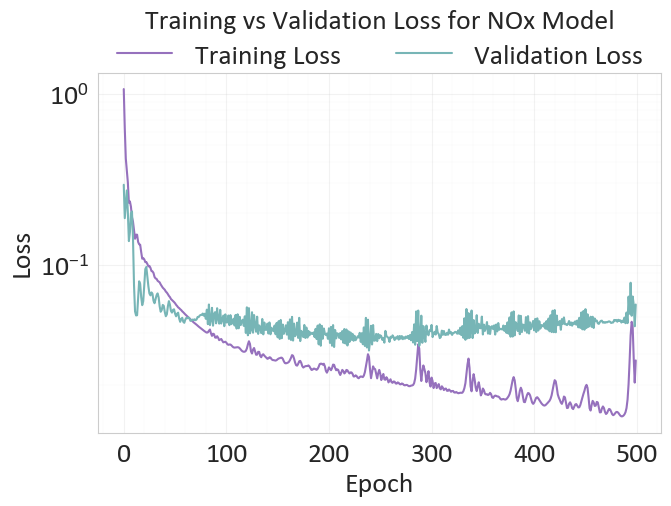

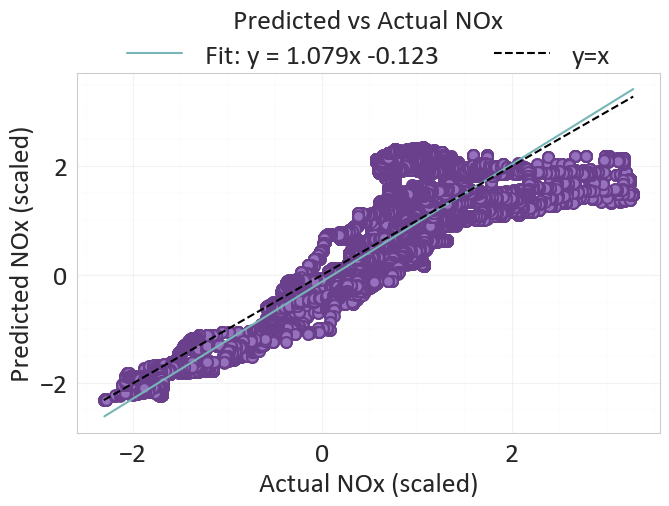

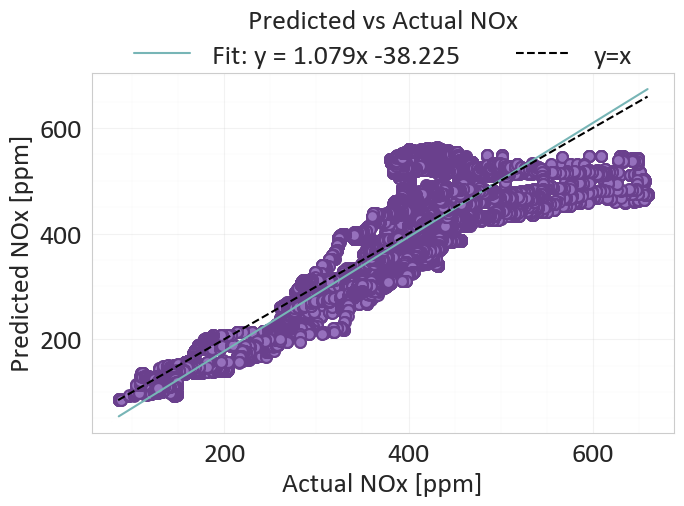

Real RMSE: 47.296108455136135
R^2 Score: 0.7968985438346863
L_inf = 1.8652


L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▇▇▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▂▂▁▁▁▁▁▁▁▂
Validation_Loss,█▂▃▃▂▂▂▂▂▂▂▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▁▂▂▂▂▂▄
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇████
epochs,▁
learning_rate,▁
L_inf,1.86523


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [34]:
# Run the complex model for NOx
X = X_engineered
feature_set_name = "Engineered_Complex"
sweep_id = wandb.sweep(sweep_config_complex, project="NOx_nn")
wandb.agent(sweep_id, lambda: train_NOx("Complex NOx"))

In [35]:
# Final run with SHAP for the best Fuel Consumption model
X = X_engineered
feature_set_name = "Best_Engineered_Complex"

In [44]:
wandb.init(project="FOC_nn")
wandb.run.name = "Best_Fuel_Consumption_SHAP"


 #################### Fuel Consumption Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.01 learning rate and 200 epochs ########################## 

Epoch 0: Train Loss = 1.0284, Val Loss = 0.4844
Epoch 10: Train Loss = 0.0706, Val Loss = 0.0445
Epoch 20: Train Loss = 0.0155, Val Loss = 0.0227
Epoch 30: Train Loss = 0.0053, Val Loss = 0.0051
Epoch 40: Train Loss = 0.0055, Val Loss = 0.0087
Epoch 50: Train Loss = 0.0033, Val Loss = 0.0061
Epoch 60: Train Loss = 0.0028, Val Loss = 0.0042
Epoch 70: Train Loss = 0.0027, Val Loss = 0.0035
Epoch 80: Train Loss = 0.0025, Val Loss = 0.0032
Epoch 90: Train Loss = 0.0024, Val Loss = 0.0031
Epoch 100: Train Loss = 0.0023, Val Loss = 0.0029
Epoch 110: Train Loss = 0.0023, Val Loss = 0.0027
Epoch 120: Train Loss =

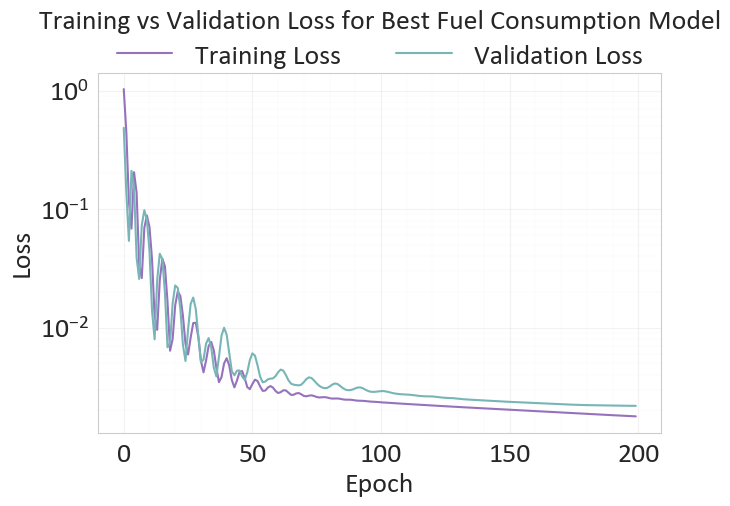

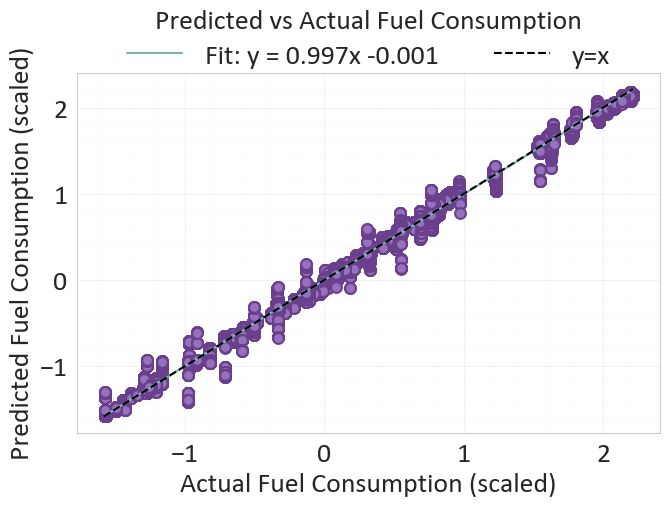

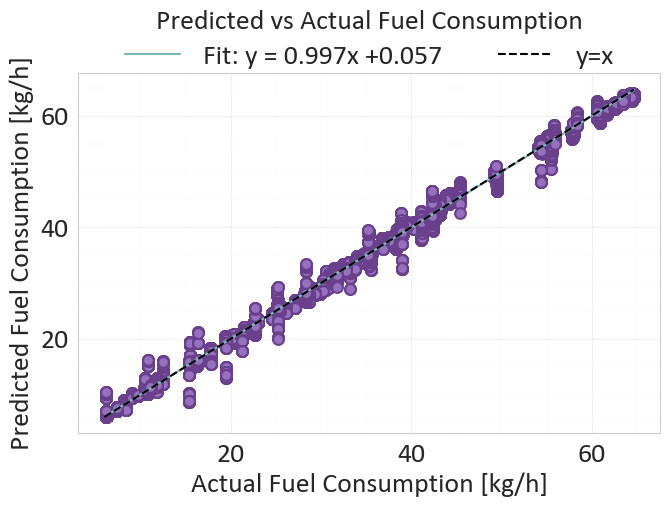

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Real RMSE: 0.6642736435854132
R^2 Score: 0.9975313544273376
L_inf = 0.4363

Running SHAP analysis...


100%|██████████| 300/300 [00:38<00:00,  7.84it/s]
C:\Users\Georgia\AppData\Local\Temp\ipykernel_57220\840945109.py:302: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


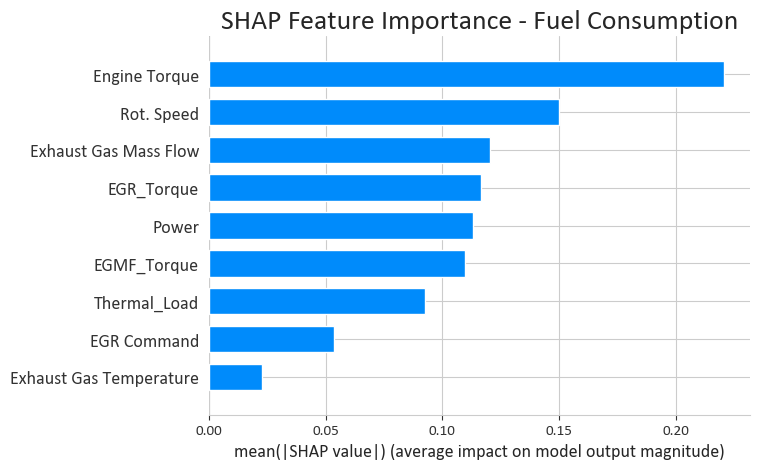

C:\Users\Georgia\AppData\Local\Temp\ipykernel_57220\840945109.py:318: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


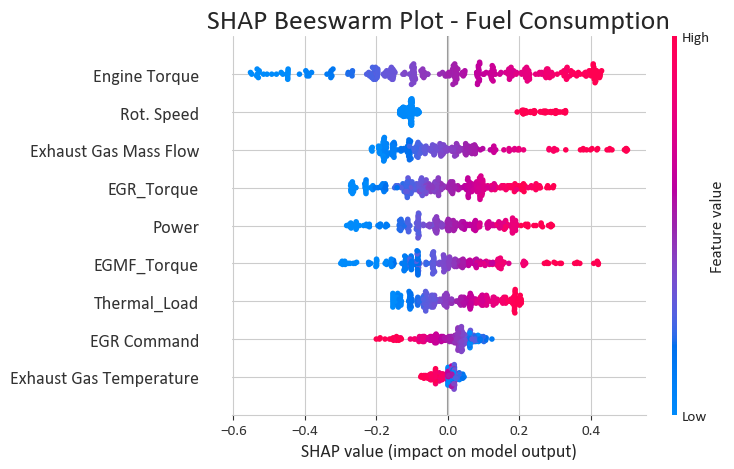

SHAP analysis completed.


In [45]:
run_neural_network(
    X,
    df["Fuel Consumption"],
    "Fuel Consumption",
    200,
    [64, 64],
    0.01,
    "Actual Fuel Consumption (scaled)",
    "Predicted Fuel Consumption (scaled)",
    "Actual Fuel Consumption [kg/h]",
    "Predicted Fuel Consumption [kg/h]",
    "Training vs Validation Loss for Best Fuel Consumption Model",
    "Predicted vs Actual Fuel Consumption",
    "Predicted vs Actual Fuel Consumption",
    do_shap=True
)

In [38]:
wandb.finish()

L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇█████
epochs,▁
learning_rate,▁
L_inf,0.47052


In [39]:
# Final run with SHAP for the best NOx model
X = X_engineered
feature_set_name = "Best_Engineered_Complex"

In [40]:
wandb.init(project="NOx_nn")
wandb.run.name = "Best_NOx_SHAP"


 #################### NOx Model ########################## 

Train RPM groups: [np.int64(1100), np.int64(1300), np.int64(1400), np.int64(1500), np.int64(1700), np.int64(1900)]
Validation RPM groups: [np.int64(1600)]
Test RPM groups: [np.int64(1200), np.int64(1800)]

 #################### [64, 64] neurons with 0.001 learning rate and 500 epochs ########################## 

Epoch 0: Train Loss = 1.0669, Val Loss = 0.5707
Epoch 10: Train Loss = 0.6141, Val Loss = 0.2715
Epoch 20: Train Loss = 0.3737, Val Loss = 0.1681
Epoch 30: Train Loss = 0.2493, Val Loss = 0.1711
Epoch 40: Train Loss = 0.1813, Val Loss = 0.1383
Epoch 50: Train Loss = 0.1481, Val Loss = 0.1144
Epoch 60: Train Loss = 0.1283, Val Loss = 0.0858
Epoch 70: Train Loss = 0.1144, Val Loss = 0.0808
Epoch 80: Train Loss = 0.1034, Val Loss = 0.0795
Epoch 90: Train Loss = 0.0951, Val Loss = 0.0710
Epoch 100: Train Loss = 0.0888, Val Loss = 0.0670
Epoch 110: Train Loss = 0.0836, Val Loss = 0.0647
Epoch 120: Train Loss = 0.0791, Val

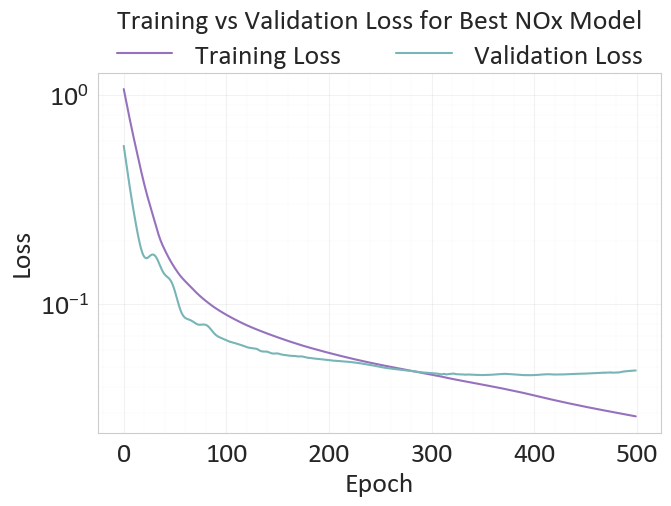

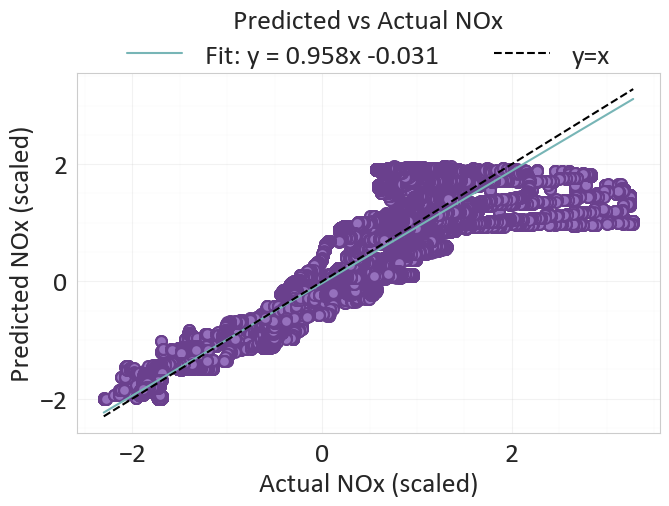

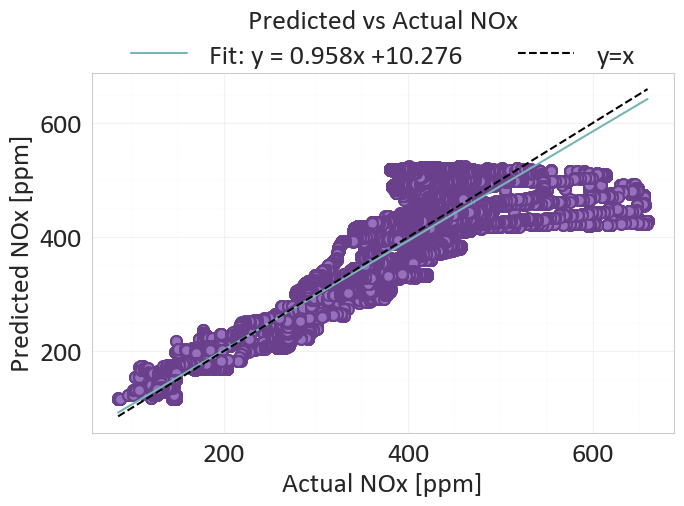

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Real RMSE: 39.002223807291585
R^2 Score: 0.8618849515914917
L_inf = 2.2940

Running SHAP analysis...


100%|██████████| 300/300 [00:33<00:00,  8.84it/s]
C:\Users\Georgia\AppData\Local\Temp\ipykernel_57220\840945109.py:302: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


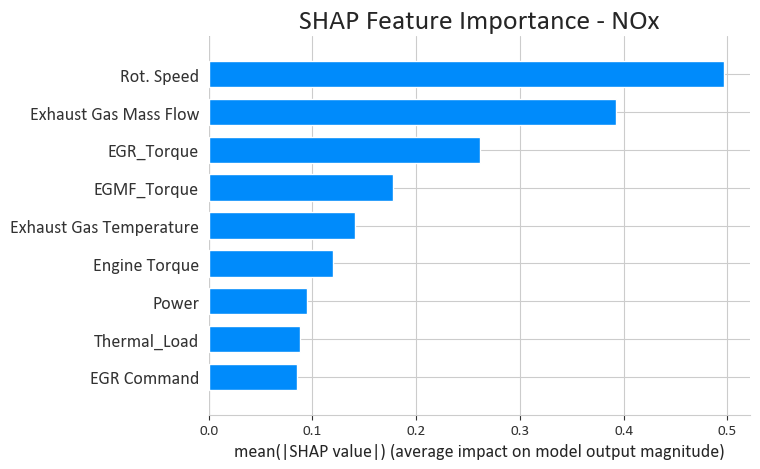

C:\Users\Georgia\AppData\Local\Temp\ipykernel_57220\840945109.py:318: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


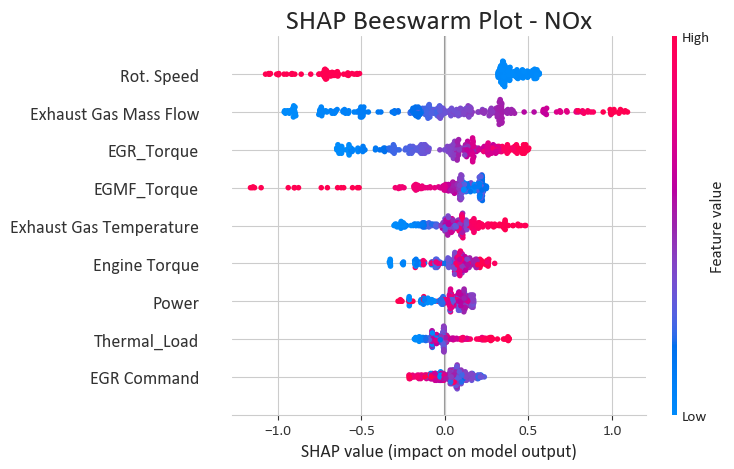

SHAP analysis completed.


In [41]:
run_neural_network(
    X,
    df["NOx"],
    "NOx",
    500,
    [64, 64],
    0.001,
    "Actual NOx (scaled)",
    "Predicted NOx (scaled)",
    "Actual NOx [ppm]",
    "Predicted NOx [ppm]",
    "Training vs Validation Loss for Best NOx Model",
    "Predicted vs Actual NOx",
    "Predicted vs Actual NOx",
    do_shap=True
)

In [42]:
wandb.finish()

L_inf,▁
R2_Score,▁
Real_RMSE,▁
Test_Loss,▁
Test_RMSE,▁
Train_Loss,█▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Validation_Loss,█▇▅▅▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
epochs,▁
learning_rate,▁
L_inf,2.29403
